In [1]:
##############
### Import ###
##############

import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline
matplotlib.rcParams.update({'font.size': 25})

from scipy.optimize import curve_fit

In [2]:
import numpy as np
import astropy
from astropy.io import fits
from astropy.table import Table
from scipy.interpolate import InterpolatedUnivariateSpline
import warnings
# from scipy.optimize import curve_fit
from tqdm import tqdm_notebook

class AetasStellae():
    '''
    Class to calculate a star's age and extinction using PARSEC isochrones and extinction law
    from Cardelli et al. 1989
    '''
    def __init__(self,teff,FeH,CNAlpha,phot,phot_err,Distance,Isochrones,Rv=3.1):
        
        '''
        teff: teff of star
        FeH: [float] metallicity [Fe/H] of star
        CNAlpha: [array] [C/Fe],[N/Fe],[O/Fe],[Mg/Fe],[Si/Fe],[S/Fe],[Ca/Fe],[Ti/Fe]
        phot: observed [BP,RP,J,H,K] photometry
        phot_err: observed [BP,RP,J,H,K] photometry error
        Distance: [float] distance to star in pc
        Isochrones: [astropy Table] PARSEC isochrone table
        '''
        
        #teff
        self.teff = teff
        
        # Salaris Correction
        self.salfeh = self.SalarisCorrectedFeH(FeH,CNAlpha)
        
        # photometry
        self.phot = phot
        self.phot_err = phot_err
        
        
        
        # Distance modulus
        self.distance = Distance
        self.distmod = 5.0*np.log10(Distance)-5.0
        
        # PARSEC isochrones
        self.rv = Rv
        self.labels = ['G_BPmag','G_RPmag','Jmag','Hmag','Ksmag']
        
        self.uniq_ages = np.unique(Isochrones['logAge'])
        self.iso = Isochrones[np.where(Isochrones['MH']==self.closest(Isochrones['MH'],self.salfeh))]
        
        age_idx = []
        for i in range(len(self.uniq_ages)):
            ages, = np.where(self.iso['logAge']==self.uniq_ages[i])
            age_idx.append(np.array([min(ages),max(ages)]))
        
        self.age_idx = np.asarray(age_idx)
                
        # Effective Wavelengths of different passbands in units of microns
        self.leff = {'G_BPmag':0.5387,'Gmag':0.6419,'G_RPmag':0.7667,'Jmag':1.2345,'Hmag':1.6393,'Ksmag':2.1757}
        
    def SalarisCorrectedFeH(self,feh,cnalpha):
        '''
        Calculate the Salaris corrected [Fe/H] according to Salaris et al. 1993 with Piersanti et al. 2007 and 
        Asplund et al. 2009. Also C and N have been added to the alpha elements and Ne has been excluded.
        
        Inputs:
        ------
            feh: metallcity of a star
            cnalpa: array of abundances np.array([C/Fe],[N/Fe],[O/Fe],[Mg/Fe],[Si/Fe],[S/Fe],[Ca/Fe],[Ti/Fe])
        
        Output:
        ------
            
        '''
        # hydrogen_wgt = 1.008 #IUPAC
        # atomic_wgts = np.array([12.011,14.007,15.999,24.305,28.085,32.06,40.078,47.867]) #IUPAC
        # asplund = np.array([8.43,7.83,8.69,7.60,7.51,7.12,6.34,4.95]) #Asplund et al. 2009
        # ZX_sol = 0.0181 # (Z/X) Asplund et al. 2009
        # a = sum(10**(asplund-12.00)*(atomic_wgts/hydrowh_wgt)*(1/0.0181)) # a = 0.78963627131196057
        # b = 1-a # b = 0.21036372868803943
        
        asplund = np.array([8.43,7.83,8.69,7.60,7.51,7.12,6.34,4.95])
        
        # assign solar value to stars if abundance is bad
        for j in range(len(cnalpha)):
            if cnalpha[j] < -100. or cnalpha[j] > 10. or np.isfinite(cnalpha[j])==False:
                cnalpha[j] = 0.0
                
        if np.isfinite(0.0)==False:
            feh = 0.0
        
        fac_acn = sum(10**(asplund+cnalpha))/sum(10**asplund)
        salfeh = feh+np.log10(0.78963627131196057*fac_acn+0.21036372868803943)
        
        return salfeh 
    
        
    def closest(self,data,value):
        '''
        Find nearest value in array to given value
        
        Inputs:
        ------
            data: data to search through 
            value: value of interest
        '''
        
        data = np.asarray(data)
    
        return data[(np.abs(np.subtract(data,value))).argmin()]
    
    def neighbors(self,data,value):
        '''
        Find values of two elements closest to the given value
    
        Inputs:
        ------
            data: data to search through 
            value: value of interest
        
        Output:
        ------
            close1: closest value under the given value
            close2: closest value over the given value
        '''
    
        data = np.asarray(data)
        close1 = data[(np.abs(np.subtract(data,value))).argmin()]
        data = data[np.where(data!=close1)]
        close2 = data[(np.abs(np.subtract(data,value))).argmin()]
    
        return close1,close2
    
    def cardelli_a(self,x):
        '''
        a(x) function from Cardelli et al. 1989
    
        Input:
        -----
            x: effective wavelength in units of 1/micron
        
        Output:
        ------
            a: a function value  
        '''
        if 0.3 <= x < 1.1:
            a = 0.574*(x**1.61)
            return a
    
        elif 1.1 <= x < 3.3:
            y = x - 1.82
            a = (1.+0.17699*y-0.50477*(y**2)-0.02427*(y**3)+0.72085*(y**4)+
                 0.01979*(y**5)-0.77530*(y**6)+0.32999*(y**7))
            return a
    
        elif 3.3 <= x < 8.0:
            if x < 5.9:
                a = 1.752-0.136*x-0.104/((x-4.67)**2+0.341)
                return a
        
            else:
                fa = -0.04473*((x-5.9)**2)+0.1207*((x-5.9)**3)
                a = 1.752-0.136*x-0.104/((x-4.67)**2+0.341)+fa
                return a       
    
    def cardelli_b(self,x):
        '''
        b(x) function from Cardelli et al. 1989
    
        Input:
        -----
            x: effective wavelength in units of 1/micron
        
        Output:
        ------
            b: b function value 
        '''
        if 0.3 <= x < 1.1:
            b = -0.527*(x**1.61)
            return b
    
        elif 1.1 <= x <= 3.3:
            y = x - 1.82
            b = (1.41338*y+2.28305*(y**2)+1.07233*(y**3)-5.38434*(y**4)-
                 0.62251*(y**5)+5.30260*(y**6)-2.09002*(y**7))
            return b
    
        elif 3.3 <= x < 8.0:
            if x < 5.9:
                b = -3.090+1.825*x+1.206/((x-4.62)**2+0.263)
                return b
        
            else:
                fb = 0.2130*((x-5.9)**2)+0.1207*((x-5.9)**3)
                b = -3.090+1.825*x+1.206/((x-4.62)**2+0.263)+fb
                return b
    
    def cardelli_alav(self,wave):
        '''
        Calculate A\lambda/Av
    
        Inputs:
        ------
            wave: effective wavelength in units of micron
            rv: Rv value (=Av/E(B_V))
        
        Output:
        ------
            alav: A\lambda/Av
        '''
        x=1/wave
        alav = self.cardelli_a(x)+self.cardelli_b(x)/self.rv
        return alav 
        
    def Teff2AppMags(self,teff,age,ak,verbose=False):
        '''
        Calculate the expected apparent magnitude of a star
        
        Inputs:
        ------
            teff: temperature of star
            age: age of star
            ak: extinction in the 2MASS K band
        
        Output:
        ------
            calc_mag: expected intrinsic magnitude for the given temperature
        '''
        
        #Some calcualtions to set things up
        lgteff = np.log10(teff)
        
        abpak = self.cardelli_alav(self.leff['G_BPmag'])/self.cardelli_alav(self.leff['Ksmag'])
        arpak = self.cardelli_alav(self.leff['G_RPmag'])/self.cardelli_alav(self.leff['Ksmag'])
        ajak = self.cardelli_alav(self.leff['Jmag'])/self.cardelli_alav(self.leff['Ksmag'])
        ahak = self.cardelli_alav(self.leff['Hmag'])/self.cardelli_alav(self.leff['Ksmag'])
        
        extincts = np.array([abpak,arpak,ajak,ahak,1.0])*ak
        
        lgage = np.log10(age*10**9)
        
        if verbose:
            print('Input [Age, Ak]: ',[age,ak])
        
        # Figure out if age is actually in the ages given in the isochrone table
        if lgage in self.uniq_ages:
            
            ### pick out a single isochrone 
            aidx, = np.where(self.uniq_ages==lgage)
            iso_ = self.iso[self.age_idx[int(aidx)][0]:self.age_idx[int(aidx)][1]]
            
            if verbose:
                print('lgteff, min, max: ',[lgteff,min(iso_['logTe']),max(iso_['logTe'])])
            
            if lgteff < min(iso_['logTe']) or lgteff > max(iso_['logTe']):
                if verbose:
                    print('[BP,RP,J,H,K]: ',np.array([999999.0, 999999.0, 999999.0, 999999.0, 999999.0]))
                return np.array([999999.0, 999999.0, 999999.0, 999999.0, 999999.0])
            
            ### sort so temp is always increasing
            sidx = np.argsort(iso_['logTe'])
            slogTe = iso_['logTe'][sidx]
            _, uidx = np.unique(slogTe,return_index=True)
            slogTe = slogTe[uidx]
            
            ### use a spline to get the apparent mags
            calc_mags = 999999.0*np.ones(5)
            calc_mags0 = 99999.0*np.ones(5)
            for i in range(5):
                mag_spl = InterpolatedUnivariateSpline(slogTe,iso_[self.labels[i]][sidx][uidx])
                calc_mags[i] = mag_spl(lgteff)+self.distmod+extincts[i]
                calc_mags0[i] = mag_spl(lgteff)+self.distmod
            
            if verbose:
                print('[BP,RP,J,H,K]: ',calc_mags)
                print('No Ext [BP,RP,J,H,K]: ',calc_mags0)
            return calc_mags
            
        else:
            lgage_lo,lgage_hi = self.neighbors(self.uniq_ages,lgage)
            if verbose:
                print('[age_lo,age_hi]: ',[10**lgage_lo/10**9,10**lgage_hi/10**9])
            
            ### Pick out single isochrones
        
            # younger
            aidx_lo, = np.where(self.uniq_ages==lgage_lo)
            iso_lo = self.iso[self.age_idx[int(aidx_lo)][0]:self.age_idx[int(aidx_lo)][1]]
            
            # older
            aidx_hi, = np.where(self.uniq_ages==lgage_hi)
            iso_hi = self.iso[self.age_idx[int(aidx_hi)][0]:self.age_idx[int(aidx_hi)][1]]
            
            if verbose:
                print('lgteff, min, max: ',[lgteff,min(iso_lo['logTe']),max(iso_lo['logTe'])])
            
            ### Temperature Check
            if lgteff < min(iso_lo['logTe']) or lgteff > max(iso_lo['logTe']):
                if verbose:
                    print('[BP,RP,J,H,K]: ',np.array([999999.0, 999999.0, 999999.0, 999999.0, 999999.0]))
                return np.array([999999.0, 999999.0, 999999.0, 999999.0, 999999.0])
            if lgteff < min(iso_hi['logTe']) or lgteff > max(iso_hi['logTe']):
                if verbose:
                    print('[BP,RP,J,H,K]: ',np.array([999999.0, 999999.0, 999999.0, 999999.0, 999999.0]))
                return np.array([999999.0, 999999.0, 999999.0, 999999.0, 999999.0])
            
            ### sort so temp is always increasing
            
            # younger
            sidx_lo = np.argsort(iso_lo['logTe'])
            slogTe_lo = iso_lo['logTe'][sidx_lo]
            _, uidx_lo = np.unique(slogTe_lo,return_index=True)
            slogTe_lo = slogTe_lo[uidx_lo]
            
            # older
            sidx_hi = np.argsort(iso_hi['logTe'])
            slogTe_hi = iso_hi['logTe'][sidx_hi]
            _, uidx_hi = np.unique(slogTe_hi,return_index=True)
            slogTe_hi = slogTe_hi[uidx_hi]
            
            ### use a spline to get the apparent mags
            age_lo = 10**lgage_lo/10**9
            age_hi = 10**lgage_hi/10**9
            calc_mags = 999999.0*np.ones(5)
            calc_mags0 = 999999.0*np.ones(5)
            for i in range(5):
                mag_spl_lo = InterpolatedUnivariateSpline(slogTe_lo,iso_lo[self.labels[i]][sidx_lo][uidx_lo])
                mag_spl_hi = InterpolatedUnivariateSpline(slogTe_hi,iso_hi[self.labels[i]][sidx_hi][uidx_hi])
                age_spl_interp = np.poly1d(np.squeeze(np.polyfit([age_lo,age_hi],
                                                                 [mag_spl_lo(lgteff),mag_spl_hi(lgteff)],1)))
                calc_mags[i] = age_spl_interp(age)+self.distmod+extincts[i]
                calc_mags0[i] = age_spl_interp(age)+self.distmod
            
            if verbose:
                print('[BP,RP,J,H,K]: ',calc_mags)
                print('No Ext [BP,RP,J,H,K]: ',calc_mags0)
            return calc_mags
        
    def Solve(self,guess_ages=np.arange(0,14),guess_aks=np.array([0,0.5,1.0]),verbose=False):
            
        ### Initialize stuff
        curve_ages = []
        curve_aks = []
        curve_ages_err = []
        curve_aks_err = []
        curve_chi = []

        # loop over age and ak space
        for j in range(len(guess_ages)):
            for k in range(len(guess_aks)):  
                try:

                    popt,pcov = curve_fit(self.Teff2AppMags,self.teff,self.phot,
                                          p0=[guess_ages[j],guess_aks[k]],bounds=((0.,0.),(14.,2.)),
                                          method='trf',sigma=self.phot_err,absolute_sigma=True,maxfev=5000)

                    curve_ages.append(popt[0])
                    curve_aks.append(popt[1])
                    curve_ages_err.append(np.sqrt(pcov[0][0]))
                    curve_aks_err.append(np.sqrt(pcov[1][1]))
                    curve_mags = np.asarray(self.Teff2AppMags(self.teff,popt[0],popt[1]))
                    curve_chi.append(sum((curve_mags-self.phot)**2/self.phot_err**2))

                except:
                    curve_mags = 999999.0*np.ones(5)
                    curve_ages.append(999999.0)
                    curve_aks.append(999999.0)
                    curve_ages_err.append(999999.0)
                    curve_aks_err.append(999999.0)
                    curve_chi.append(999999.0)

        idx = np.asarray(curve_chi).argmin()
        chi = np.min(curve_chi)
        age = np.asarray(curve_ages)[idx]
        ak = np.asarray(curve_aks)[idx]
        age_err = np.asarray(curve_ages_err)[idx]
        ak_err = np.asarray(curve_aks_err)[idx]

        best_mags = self.Teff2AppMags(self.teff,age,ak)

        if verbose:
            print('Params [Age, Ak]:',[age,ak])
            print('Params Err [Age, Ak]:',[age_err,ak_err])
            print('Obs Phot [BP,RP,J,H,K]: ',np.round(self.phot,3))
            print('Obs Phot Err [BP,RP,J,H,K]: ',np.round(self.phot_err,3))
            print('Best [BP,RP,J,H,K]: ',np.round(best_mags,3))

        return np.array([age,ak]),np.array([age_err,ak_err])
        
    def Diagnostic(self,best_fit_params,filename=None,verbose=False):
        ages = np.arange(0,15,0.25)
        theos = 999999.0*np.ones((len(ages),5))
        theos_noext = 999999.0*np.ones((len(ages),5))
    
        for j in range(len(ages)):
        
            theos[j,:] = self.Teff2AppMags(self.teff,ages[j],best_fit_params[1])
            theos_noext[j,:] = self.Teff2AppMags(self.teff,ages[j],0)
        
        fig, ax = plt.subplots(1,5,figsize=[67,15])
        for i in range(5):
            ax[i].scatter(theos[:,i],ages,s=100,label='Best Fit Ak')
            ax[i].plot(theos[:,i],ages)
            
            ax[i].scatter(theos_noext[:,i],ages,s=100,label='No Ak')
            ax[i].plot(theos_noext[:,i],ages)
            
            ax[i].set_ylim(bottom=0.01)
            ax[i].axhline(best_fit_params[0],c='k',ls='--',label='Best Fit Age',lw=3.0)
            ax[i].set_xlabel(r'Magnitude')
            
            ax[i].axvline(self.phot[i],ls='--',c='magenta',lw=3.0)
            ax[i].set_title(r'{}: {:.3f}'.format(self.labels[i],self.phot[i]))
            
            ax[i].set_xlim(self.phot[i]-3.0,self.phot[i]+3.0)

        ax[0].legend()

        ax[0].set_ylabel('Age')
        
        plt.suptitle(r'{:.3f} Gyr; {:.3f} dex; {:.3f} kpc'.format(best_fit_params[0],best_fit_params[1],self.distance))
    
        if filename!=None:
            plt.savefig(filename,bbox_inches='tight')
        plt.show()

In [35]:
leff = {'BP':0.5387,'G':0.6419,'RP':0.7667,'J':1.2345,'H':1.6393,'K':2.1757}
def cardelli_a(x):
    '''
    a(x) function from Cardelli et al. 1989
    
    Input:
    -----
        x: effective wavelength in units of 1/micron
        
    Output:
    ------
        a: a function value  
    '''
    if 0.3 <= x < 1.1:
        a = 0.574*(x**1.61)
        return a
    
    elif 1.1 <= x < 3.3:
        y = x - 1.82
        a = (1.+0.17699*y-0.50477*(y**2)-0.02427*(y**3)+0.72085*(y**4)+
                0.01979*(y**5)-0.77530*(y**6)+0.32999*(y**7))
        return a
    
    elif 3.3 <= x < 8.0:
        if x < 5.9:
            a = 1.752-0.136*x-0.104/((x-4.67)**2+0.341)
            return a
        
        else:
            fa = -0.04473*((x-5.9)**2)+0.1207*((x-5.9)**3)
            a = 1.752-0.136*x-0.104/((x-4.67)**2+0.341)+fa
            return a       
    
def cardelli_b(x):
    '''
    b(x) function from Cardelli et al. 1989
    
    Input:
    -----
        x: effective wavelength in units of 1/micron
        
    Output:
    ------
        b: b function value 
    '''
    if 0.3 <= x < 1.1:
        b = -0.527*(x**1.61)
        return b
    
    elif 1.1 <= x <= 3.3:
        y = x - 1.82
        b = (1.41338*y+2.28305*(y**2)+1.07233*(y**3)-5.38434*(y**4)-
                0.62251*(y**5)+5.30260*(y**6)-2.09002*(y**7))
        return b
    
    elif 3.3 <= x < 8.0:
        if x < 5.9:
            b = -3.090+1.825*x+1.206/((x-4.62)**2+0.263)
            return b
        
        else:
            fb = 0.2130*((x-5.9)**2)+0.1207*((x-5.9)**3)
            b = -3.090+1.825*x+1.206/((x-4.62)**2+0.263)+fb
            return b
    
def cardelli_alav(wave,rv):
    '''
    Calculate A\lambda/Av
    
    Inputs:
    ------
        wave: effective wavelength in units of micron
        rv: Rv value (=Av/E(B_V))
        
    Output:
    ------
        alav: A\lambda/Av
    '''
    x=1/wave
    alav = cardelli_a(x)+cardelli_b(x)/rv
    return alav

ejk_ak = (cardelli_alav(leff['J'],3.1)-cardelli_alav(leff['K'],3.1))/cardelli_alav(leff['K'],3.1)

def closest(data,value):
    '''
    Find nearest value in array to given value
        
    Inputs:
    ------
        data: data to search through 
        value: value of interest
    '''
        
    data = np.asarray(data)
    return data[(np.abs(np.subtract(data,value))).argmin()]

In [36]:
ejk_ak

1.4901972382364816

# PARSEC Isochrones

In [4]:
### massive
massive = fits.getdata('/Users/joshuapovick/Desktop/Research/parsec/parsec_massive.fits.gz',0)
massive = Table(massive[np.where(massive['label']==3.0)])
massive['index'] = np.arange(len(massive))
massive = massive[np.argsort(massive['logAge'])]
massive = massive['index','MH','logAge','logTe','logg','Gmag','G_BPmag','G_RPmag','Jmag','Hmag','Ksmag']

# Globular Clusters

In [5]:
np.where(np.array([-9999.0,1,2,3,4,5,np.nan])>-9999.0)


(array([1, 2, 3, 4, 5]),)

In [4]:
### GCS Data
gcs = fits.getdata('/Users/joshuapovick/Desktop/Research/fits/allStar-r13-l33-58932beta_apa_dist_galvel_gc.fits.gz')
# cln = np.where((gcs['FE_H']>-9999.0)&(gcs['AK_TARG']>-9999.0)&(gcs['LOGG']>0.0)&
#                 (gcs['C_FE']>-9999.0)&(gcs['N_FE']>-9999.0))
# gcs = Table(gcs[cln])
gcs = Table(gcs[np.where((gcs['LOGG']>0.0)&(gcs['FE_H']>-9999.0)&(np.isfinite(gcs['FE_H'])==True))])

### Find Cluster with more than one star

idx = []
for i in range(len(np.unique(gcs['CLUSTER']))):
    idx.append(np.squeeze(np.where(gcs['CLUSTER']==np.unique(gcs['CLUSTER'])[i])))

for i in range(len(idx)):
    try:
        len(idx[i])
    except:
        print('bad: ',i)
        
good_names = []
for i in np.asarray(idx,dtype=object)[np.delete(np.asarray(list(range(len(idx)))),[28])]:
    if np.size(i)>10:
        good_names.append(gcs['CLUSTER'][i][0])

print(good_names)

# 
good_clus = np.where((gcs['CLUSTER']=='47Tuc')|(gcs['CLUSTER']=='M10')|(gcs['CLUSTER']=='M107')|
                     (gcs['CLUSTER']=='M12')|(gcs['CLUSTER']=='M13')|(gcs['CLUSTER']=='M15')|
                     (gcs['CLUSTER']=='M19')|(gcs['CLUSTER']=='M2')|(gcs['CLUSTER']=='M22')|
                     (gcs['CLUSTER']=='M3')|(gcs['CLUSTER']=='M4')|(gcs['CLUSTER']=='M5')|
                     (gcs['CLUSTER']=='M53')|(gcs['CLUSTER']=='M54')|(gcs['CLUSTER']=='M55')|
                     (gcs['CLUSTER']=='M68')|(gcs['CLUSTER']=='M71')|(gcs['CLUSTER']=='M79')|
                     (gcs['CLUSTER']=='M92')|(gcs['CLUSTER']=='NGC1851')|(gcs['CLUSTER']=='NGC2808')|
                     (gcs['CLUSTER']=='NGC288')|(gcs['CLUSTER']=='NGC3201')|(gcs['CLUSTER']=='NGC362')|
                     (gcs['CLUSTER']=='NGC5053')|(gcs['CLUSTER']=='NGC5466')|(gcs['CLUSTER']=='NGC6304')|
                     (gcs['CLUSTER']=='NGC6388')|(gcs['CLUSTER']=='NGC6752')|(gcs['CLUSTER']=='NGC6760'))

gcs = gcs[good_clus]

### DR17
dr17 = fits.getdata('/Users/joshuapovick/Desktop/Research/fits/allStarLite-dr17-synspec.fits.gz')
_, gcs_ind, dr17_ind = np.intersect1d(gcs['APOGEE_ID'], dr17['APOGEE_ID'], return_indices=True)

gcsdr17 = dr17[dr17_ind]
gcs = gcs[gcs_ind]

gcs_clus = np.unique(gcs['CLUSTER'])

bad:  28
['47Tuc', 'M10', 'M107', 'M12', 'M13', 'M15', 'M19', 'M2', 'M22', 'M3', 'M4', 'M5', 'M53', 'M54', 'M55', 'M68', 'M71', 'M79', 'M92', 'NGC1851', 'NGC2808', 'NGC288', 'NGC3201', 'NGC362', 'NGC5053', 'NGC5466', 'NGC6304', 'NGC6316', 'NGC6388', 'NGC6397', 'NGC6441', 'NGC6642', 'NGC6752', 'NGC6760', 'Terzan9', 'Ton1', 'omegaCen']


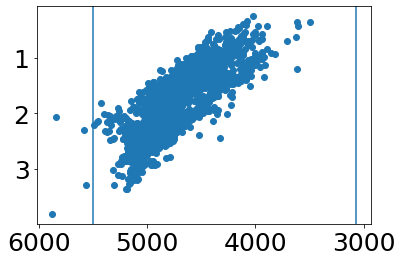

In [23]:
plt.scatter(gcsdr17['TEFF'],gcsdr17['LOGG'])
plt.axvline(3068)
plt.axvline(5500)
plt.gca().invert_xaxis()
plt.gca().invert_yaxis()

3492.2

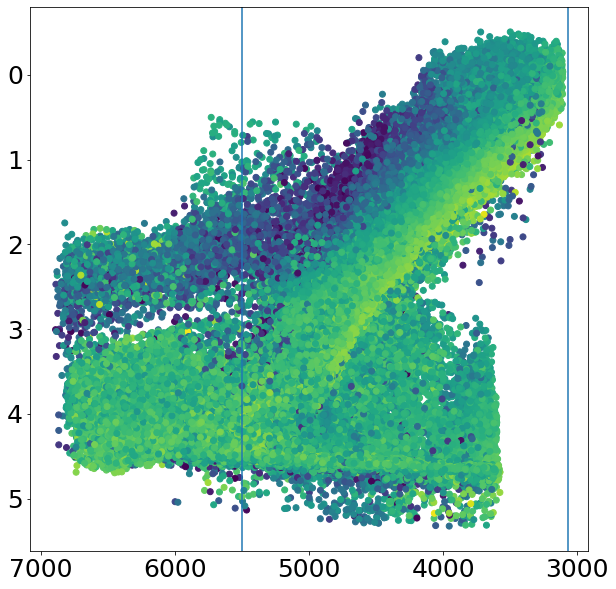

In [27]:
plt.figure(figsize=[10,10])
plt.scatter(dr17['TEFF'],dr17['LOGG'],c=dr17['FE_H'])
plt.axvline(3068)
plt.axvline(5500)
plt.gca().invert_xaxis()
plt.gca().invert_yaxis()

min(gcsdr17['TEFF'])

3492.2

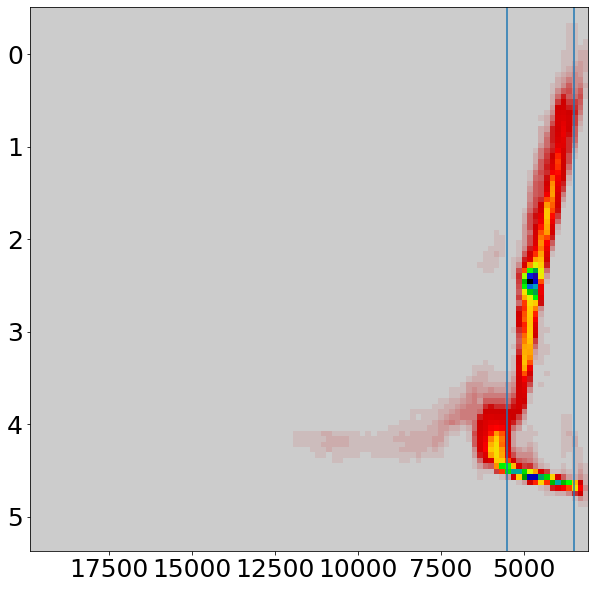

In [34]:
cln = np.where((np.isfinite(dr17['TEFF'])==True)&(np.isfinite(dr17['LOGG'])==True))

plt.figure(figsize=[10,10])
plt.hist2d(dr17['TEFF'][cln],dr17['LOGG'][cln],bins=100,cmap='nipy_spectral_r')
plt.axvline(min(gcsdr17['TEFF']))
plt.axvline(5500)
plt.gca().invert_xaxis()
plt.gca().invert_yaxis()

min(gcsdr17['TEFF'])

In [5]:
gaiaedr3 = fits.getdata('/Users/joshuapovick/Desktop/Research/gaia/GAIAEDR3allStar.fits.gz')

In [6]:
# print(len(dr17))
# print(len(gaiaedr3))

In [7]:
# np.nanmedian(gaiaedr3['phot_g_mean_flux']/gaiaedr3['phot_g_mean_flux_over_error'])

In [8]:
med_apo_feh = np.array([])
for i in range(len(gcs_clus)):
    clus = np.where((gcs['CLUSTER']==gcs_clus[i])&(gcsdr17['FE_H']>-100.))
    med_apo_feh = np.append(med_apo_feh,np.nanmedian(gcsdr17['FE_H'][clus]))
#     print('{}: {:.3f}'.format(gcs_clus[i],np.nanmedian(gcsdr17['FE_H'][clus])))
    
harris_dist = np.array([4.5,4.4,6.3,4.8,7.1,10.4,8.8,11.5,3.2,10.2,2.2,7.5,17.9,26.5,5.4,10.3,4.0,12.9,8.3,12.1,
                        9.6,8.9,4.9,8.6,17.4,16.0,5.9,9.9,4.0,7.4])*1000
harris_feh = np.array([-0.72,-1.56,-1.02,-1.37,-1.53,-2.37,-1.74,-1.65,-1.70,-1.50,-1.16,-1.29,-2.10,-1.49,-1.94,
                       -2.23,-0.78,-1.60,-2.31,-1.18,-1.14,-1.32,-1.59,-1.26,-2.27,-1.98,-0.45,-0.55,-1.54,-0.40])
vanden_feh = np.array([-0.76,-1.57,-1.03,-1.33,-1.58,-2.33,-1.53,-1.66,-1.70,-1.50,-1.18,-1.33,-2.06,-1.44,-1.93,
                       -2.27,-0.82,-1.60,-2.35,-1.18,-1.18,-1.32,-1.51,-1.30,-2.30,-2.31,-0.37,-0.77,-1.55,-0.60])
vanden_age = np.array([11.75,11.75,12.00,13.00,12.00,12.75,11.90,11.75,12.50,11.75,11.50,11.50,12.25,11.75,13.00,
                       12.00,11.00,11.0,12.75,11.00,11.00,11.50,11.50,11.75,12.25,12.50,11.25,12.03,12.50,11.26])

gcs_dist = 999999.0*np.ones(len(gcs))
for i in range(len(np.unique(gcs['CLUSTER']))):
    clus = np.where(gcs['CLUSTER']==np.unique(gcs['CLUSTER'])[i])
    gcs_dist[clus] = harris_dist[i]

print('Harris-APOGEE:',np.median(harris_feh-med_apo_feh))
print('VandenBerg-APOGEE:',np.median(vanden_feh-med_apo_feh))
print('Overall:',np.median([np.median(harris_feh-med_apo_feh),np.median(vanden_feh-med_apo_feh)]))

shiftfeh = 999999*np.ones(len(gcsdr17))
for i in range(len(gcsdr17)):
    if np.isfinite(gcsdr17['FE_H'][i])==False:
        shiftfeh[i] = 0.0+np.median([np.median(harris_feh-med_apo_feh),np.median(vanden_feh-med_apo_feh)])
    else:
        shiftfeh[i] = (gcsdr17['FE_H'][i]+
                       np.median([np.median(harris_feh-med_apo_feh),np.median(vanden_feh-med_apo_feh)]))

Harris-APOGEE: -0.07535000324249275
VandenBerg-APOGEE: -0.08275001049041741
Overall: -0.07905000686645508


(array([], dtype=int64),)

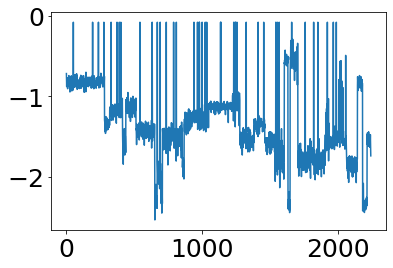

In [11]:
plt.plot(shiftfeh)
np.where(np.isfinite(shiftfeh)==False)

In [12]:
# mark rc and agb include in fitting
# run with new salaris -0.08
# maybe a few younger clusters
# with gaia included

In [13]:
def salaris(feh,cnalpha):
    '''
    Calculate the Salaris corrected [Fe/H] according to Salaris et al. 1993 with Piersanti et al. 2007 and 
    Asplund et al. 2009. Also C and N have been added to the alpha elements and Ne has been excluded.
        
    Inputs:
    ------
        feh: metallcity of a star
        cnalpa: array of abundances np.array([C/Fe],[N/Fe],[O/Fe],[Mg/Fe],[Si/Fe],[S/Fe],[Ca/Fe],[Ti/Fe])
        
    Output:
    ------
            
    '''
    asplund = np.array([8.43,7.83,8.69,7.60,7.51,7.12,6.34,4.95])
        
    # assign solar value to stars if abundance is bad
    for j in range(len(cnalpha)):
        if cnalpha[j] < -100. or cnalpha[j] > 10. or np.isfinite(cnalpha[j])==False:
            cnalpha[j] = 0.0
        
    if np.isfinite(feh)==False:
        feh = 0.0
    
    fac_acn = sum(10**(asplund+cnalpha))/sum(10**asplund)
    salfeh = feh+np.log10(0.78963627131196057*fac_acn+0.21036372868803943)
        
    return salfeh

In [14]:
all_sal_feh = np.array([])
for i in range(len(gcsdr17)):
    cnalpha = np.array([gcsdr17['C_FE'][i],gcsdr17['N_FE'][i],gcsdr17['O_FE'][i],gcsdr17['MG_FE'][i],
                        gcsdr17['SI_FE'][i],gcsdr17['S_FE'][i],gcsdr17['CA_FE'][i],gcsdr17['TI_FE'][i]])
    
    all_sal_feh = np.append(all_sal_feh,salaris(gcsdr17['FE_H'][i],cnalpha))

In [15]:
for i in range(len(gcs_clus)):
    clus = np.where(gcs['CLUSTER']==gcs_clus[i])
    print(np.median(all_sal_feh[clus]))

-0.4732497552643804
-1.2954019544254194
-0.6558759861592895
-1.0316745882607201
-1.2957456385036394
-1.9686354610223893
-1.4913496625701155
-1.3140107651772432
-1.4287206578866434
-1.276077012953488
-0.7360957357015213
-1.0121149244455172
-1.6562981486491537
-1.264514101466443
-1.547733215742363
-2.0251212383717436
-0.5151533808221831
-1.3354111518124823
-1.9392855178715387
-0.9338590707381655
-0.9231541800272747
-0.9765214854759225
-1.1960234379048276
-0.9599301048801605
-2.0140285520416987
-1.6999741036311402
-0.23133385703844814
-0.34223077801815555
-1.264614091440557
-0.4445708219300748


In [16]:
gcs0 = [np.where(gcs['CLUSTER']==gcs_clus[0])]
print(gcsdr17['FE_H'][gcs0])
print(gcsdr17['C_FE'][gcs0])
print(gcsdr17['N_FE'][gcs0])
print(gcsdr17['O_FE'][gcs0])
print(gcsdr17['MG_FE'][gcs0])
print(gcsdr17['SI_FE'][gcs0])
print(gcsdr17['S_FE'][gcs0])
print(gcsdr17['CA_FE'][gcs0])
print(gcsdr17['TI_FE'][gcs0])

[[-0.63845 -0.74213 -0.80151 -0.70368 -0.73453 -0.70733 -0.69091 -0.78465
  -0.75756 -0.82673 -0.73687 -0.74011 -0.79353 -0.78194 -0.79744 -0.73106
  -0.74734 -0.69776 -0.66345 -0.7129  -0.77431 -0.7649  -0.74911 -0.71098
  -0.79187 -0.77227 -0.86751 -0.8072  -0.81734 -0.78258 -0.72704 -0.68571
  -0.78342 -0.71897 -0.6993  -0.83024 -0.66657 -0.73698 -0.78339 -0.704
  -0.8547  -0.72663 -0.70781 -0.71867 -0.77889 -0.71482 -0.68314 -0.84639
  -0.80939 -0.80852 -0.73732      nan -0.74638 -0.74135 -0.75243 -0.77039
  -0.79155 -0.80454 -0.70199 -0.76099 -0.81053 -0.77235 -0.6557  -0.7317
  -0.79981 -0.74833 -0.65137 -0.74402 -0.65702 -0.7325  -0.69161 -0.69606
  -0.73663 -0.71381 -0.70706 -0.64007 -0.7788  -0.66119 -0.77845 -0.71984
  -0.83528 -0.72819 -0.71413 -0.81075 -0.75616 -0.74034 -0.76081 -0.72445
  -0.81594 -0.73536 -0.79408 -0.76036 -0.74197 -0.78941 -0.72293 -0.8072
  -0.82482 -0.70671 -0.72596 -0.70992 -0.75525 -0.694   -0.75824 -0.72631
  -0.67542 -0.70405 -0.65953 -0.79979 -0.8

<ipython-input-16-3a16c0193d8e>:2: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  print(gcsdr17['FE_H'][gcs0])
<ipython-input-16-3a16c0193d8e>:3: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  print(gcsdr17['C_FE'][gcs0])
<ipython-input-16-3a16c0193d8e>:4: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  print(gcsdr17['

In [17]:
for i in np.squeeze(gcs0):
    cnalpha = np.array([gcsdr17['C_FE'][i],gcsdr17['N_FE'][i],gcsdr17['O_FE'][i],gcsdr17['MG_FE'][i],
                        gcsdr17['SI_FE'][i],gcsdr17['S_FE'][i],gcsdr17['CA_FE'][i],gcsdr17['TI_FE'][i]])
    
    print(salaris(gcsdr17['FE_H'][i],cnalpha))

-0.5082237640826803
-0.5289460478491667
-0.5417734212711552
-0.4602098713244658
-0.4801281006720574
-0.4639233480094741
-0.40642971020053503
-0.5347989654197396
-0.4938561286343812
-0.4602431063857749
-0.4277085541891559
-0.45267249221300715
-0.5193555838574662
-0.5300266761383599
-0.5400646015513457
-0.4754176654513616
-0.4891794613031733
-0.43756224668199
-0.4155724626410763
-0.43751260401332376
-0.541124471849197
-0.549964531442859
-0.5255939918067154
-0.429638122815832
-0.5680336391324896
-0.5245954101889885
-0.6465703970722612
-0.5127521273499795
-0.6089851260664982
-0.5639308077270939
-0.5066056555623087
-0.42369053591148753
-0.5482411221964356
-0.4573290512108559
-0.4752504203532179
-0.5548657131297114
-0.3811209401734289
-0.5147716175897495
-0.5378686110554477
-0.4639135923120976
-0.4749159718135958
-0.4011745224692287
-0.4062226658902774
-0.46784451533882904
-0.527029547446335
-0.47860634503131316
-0.30914974626523894
-0.6102095015274012
-0.7801629720234893
-0.5964569737242804

In [18]:
gcsdr17['FE_H'][gcs0]

<ipython-input-18-69883fbf980b>:1: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  gcsdr17['FE_H'][gcs0]


array([[-0.63845, -0.74213, -0.80151, -0.70368, -0.73453, -0.70733,
        -0.69091, -0.78465, -0.75756, -0.82673, -0.73687, -0.74011,
        -0.79353, -0.78194, -0.79744, -0.73106, -0.74734, -0.69776,
        -0.66345, -0.7129 , -0.77431, -0.7649 , -0.74911, -0.71098,
        -0.79187, -0.77227, -0.86751, -0.8072 , -0.81734, -0.78258,
        -0.72704, -0.68571, -0.78342, -0.71897, -0.6993 , -0.83024,
        -0.66657, -0.73698, -0.78339, -0.704  , -0.8547 , -0.72663,
        -0.70781, -0.71867, -0.77889, -0.71482, -0.68314, -0.84639,
        -0.80939, -0.80852, -0.73732,      nan, -0.74638, -0.74135,
        -0.75243, -0.77039, -0.79155, -0.80454, -0.70199, -0.76099,
        -0.81053, -0.77235, -0.6557 , -0.7317 , -0.79981, -0.74833,
        -0.65137, -0.74402, -0.65702, -0.7325 , -0.69161, -0.69606,
        -0.73663, -0.71381, -0.70706, -0.64007, -0.7788 , -0.66119,
        -0.77845, -0.71984, -0.83528, -0.72819, -0.71413, -0.81075,
        -0.75616, -0.74034, -0.76081, -0.72445, 

In [19]:
# p0=[12.0,0.5]
# idx = 1024
# cnalpha = np.array([gcsdr17['C_FE'][idx],gcsdr17['N_FE'][idx],gcsdr17['O_FE'][idx],gcsdr17['MG_FE'][idx],
#                     gcsdr17['SI_FE'][idx],gcsdr17['S_FE'][idx],gcsdr17['CA_FE'][idx],gcsdr17['TI_FE'][idx]])

# CalcAge = AetasStellae(shiftfeh[idx],cnalpha,10000,3.1,massive)

# obs_mags = np.array([gcsdr17['GAIAEDR3_PHOT_BP_MEAN_MAG'][idx],gcsdr17['GAIAEDR3_PHOT_BP_MEAN_MAG'][idx],
#                      gcsdr17['J'][idx],gcsdr17['H'][idx],gcsdr17['K'][idx]],dtype=float).T.ravel()
# # obs_mags_err = 

# popt,pcov = curve_fit(CalcAge.Teff2AppMags,gcsdr17['TEFF'][idx],obs_mags,p0=p0,bounds=((0.,0.),(14.,2.)),
#                       method='trf')#,sigma=np.array([gcsdr17['J_ERR'][idx],gcsdr17['H_ERR'][idx],
# #                                                    gcsdr17['K_ERR'][idx]],dtype=float).T.ravel(),
# #                       absolute_sigma=True)

# print('Initial',p0)
# print('Age; Ak',popt)
# print(pcov)
# print(np.sqrt(pcov[0][0]))

In [20]:
from scipy.stats import binned_statistic

(-3.0, -0.3770445600152016)

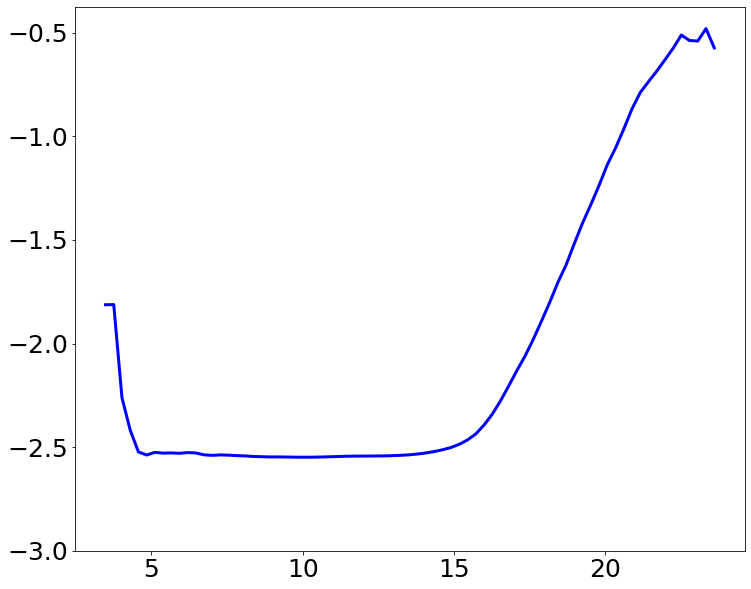

In [49]:
bp_fin = np.where(np.isfinite(gaiaedr3['phot_bp_mean_mag'])==True)

bpmin = min(gaiaedr3['phot_bp_mean_mag'][bp_fin])
bpmax = max(gaiaedr3['phot_bp_mean_mag'][bp_fin])

bpdiff = bpmax-bpmin
bpfluxerr = (2.5*0.434)/gaiaedr3['phot_bp_mean_flux_over_error'][bp_fin]
bpmagerr = np.sqrt((bpfluxerr)**2+0.0027901700**2)

binnum = 75
bpbin ,_,_ = binned_statistic(gaiaedr3['phot_bp_mean_mag'][bp_fin],np.log10(bpmagerr),'median',bins=binnum)

plt.figure(figsize=[12,10])
# plt.hist2d(gaiaedr3['phot_bp_mean_mag'][bp_fin],np.log10(bpmagerr),bins=binnum,density=True,cmin=0.01,
#            cmap='Blues_r')
# plt.colorbar()

plt.plot(np.arange(bpmin,bpmax,bpdiff/binnum),bpbin,lw=3.0,c='blue')
plt.ylim(bottom=-3.0)

(-3.0, -0.5569026350975037)

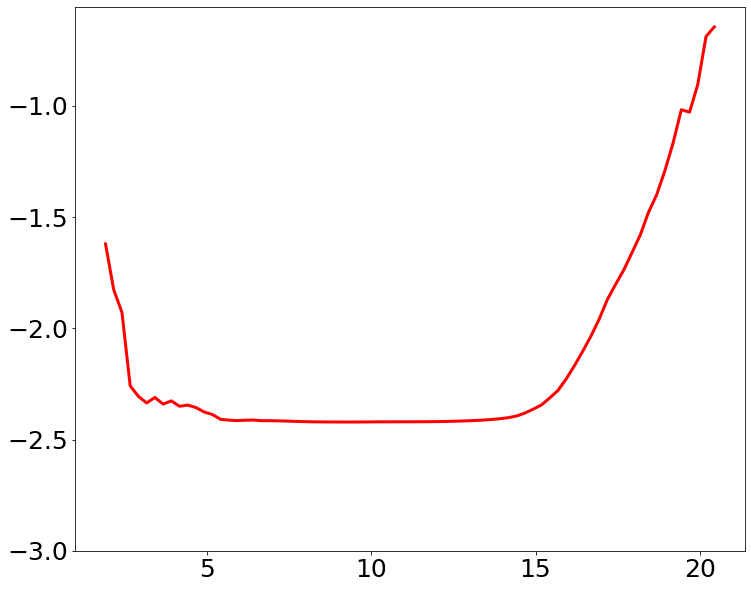

In [50]:
rp_fin = np.where(np.isfinite(gaiaedr3['phot_rp_mean_mag'])==True)

rpmin = min(gaiaedr3['phot_rp_mean_mag'][rp_fin])
rpmax = max(gaiaedr3['phot_rp_mean_mag'][rp_fin])

rpdiff = rpmax-rpmin
rpfluxerr = (2.5*0.434)/gaiaedr3['phot_rp_mean_flux_over_error'][rp_fin]
rpmagerr = np.sqrt((rpfluxerr)**2+0.0037793818**2)

binnum = 75
rpbin ,_,_ = binned_statistic(gaiaedr3['phot_rp_mean_mag'][rp_fin],np.log10(rpmagerr),'median',bins=binnum)

plt.figure(figsize=[12,10])
# plt.hist2d(gaiaedr3['phot_rp_mean_mag'][rp_fin],np.log10(rpmagerr),bins=binnum,density=True,cmin=0.01,
#            cmap='Reds_r')
# plt.colorbar()

plt.plot(np.arange(rpmin,rpmax,rpdiff/binnum),rpbin,lw=3.0,c='red')
plt.ylim(bottom=-3.0)

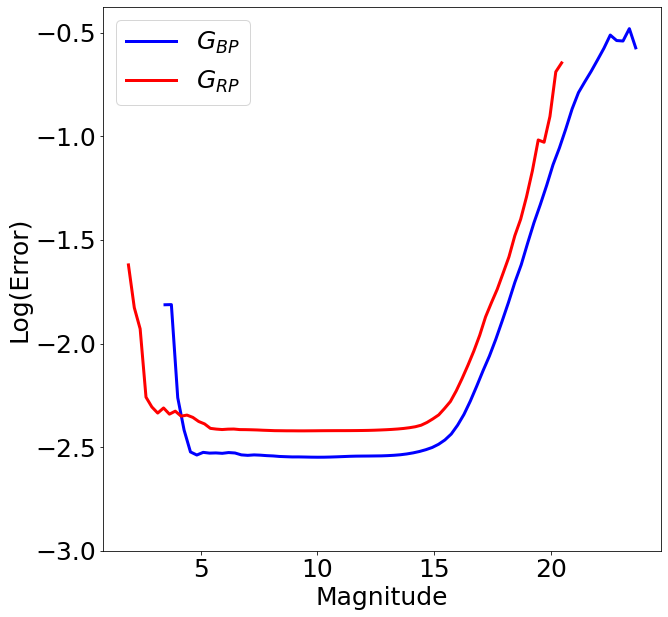

In [51]:
plt.figure(figsize=[10,10])
plt.plot(np.arange(bpmin,bpmax,bpdiff/binnum),bpbin,lw=3.0,c='blue',label=r'$G_{BP}$')
plt.plot(np.arange(rpmin,rpmax,rpdiff/binnum),rpbin,lw=3.0,c='red',label=r'$G_{RP}$')
plt.legend()
plt.ylim(bottom=-3.0)
plt.xlabel('Magnitude')
plt.ylabel('Log(Error)')
plt.savefig('gaiaerrs.pdf',bbox_inches='tight')

Text(0, 0.5, 'Error')

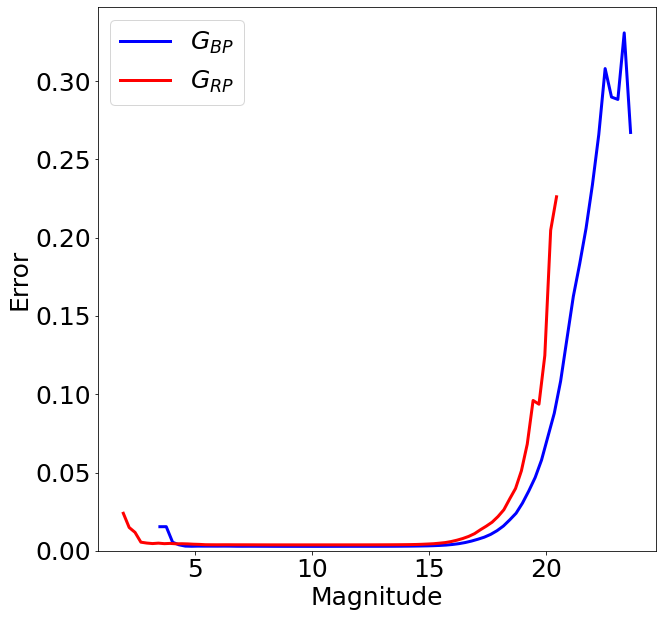

In [52]:
plt.figure(figsize=[10,10])
plt.plot(np.arange(bpmin,bpmax,bpdiff/binnum),10**bpbin,lw=3.0,c='blue',label=r'$G_{BP}$')
plt.plot(np.arange(rpmin,rpmax,rpdiff/binnum),10**rpbin,lw=3.0,c='red',label=r'$G_{RP}$')
plt.legend()
plt.ylim(bottom=.0)
plt.xlabel('Magnitude')
plt.ylabel('Error')
# plt.savefig('gaiaerrs.pdf',bbox_inches='tight')

In [53]:
bperrfunc = InterpolatedUnivariateSpline(np.arange(bpmin,bpmax,bpdiff/binnum),bpbin)
rperrfunc = InterpolatedUnivariateSpline(np.arange(rpmin,rpmax,rpdiff/binnum),rpbin)

bperr = 10**bperrfunc(gcsdr17['GAIAEDR3_PHOT_BP_MEAN_MAG'])
rperr = 10**rperrfunc(gcsdr17['GAIAEDR3_PHOT_RP_MEAN_MAG'])

In [45]:
# bp_fin = np.where(np.isfinite(gaiaedr3['phot_bp_mean_mag'])==True)

# bpmin = min(gaiaedr3['phot_bp_mean_mag'][bp_fin])
# bpmax = max(gaiaedr3['phot_bp_mean_mag'][bp_fin])

# bpdiff = bpmax-bpmin
# bpfluxerr2 = 2.5*np.log10(1+gaiaedr3['phot_bp_mean_flux_over_error'][bp_fin])
# bpmagerr2 = np.sqrt((bpfluxerr2)**2+0.0027901700**2)

# binnum = 75
# bpbin2 ,_,_ = binned_statistic(gaiaedr3['phot_bp_mean_mag'][bp_fin],np.log10(bpmagerr2),'median',bins=binnum)

# plt.figure(figsize=[12,10])
# # plt.hist2d(gaiaedr3['phot_bp_mean_mag'][bp_fin],np.log10(bpmagerr),bins=binnum,density=True,cmin=0.01,
# #            cmap='Blues_r')
# # plt.colorbar()

# plt.plot(np.arange(bpmin,bpmax,bpdiff/binnum),bpbin2,lw=3.0,c='blue')
# plt.ylim(bottom=0.0)
# plt.title(r'Color as Density')
# plt.ylabel(r'BP Error')
# plt.xlabel(r'BP Mag')

In [46]:
# rp_fin = np.where(np.isfinite(gaiaedr3['phot_rp_mean_mag'])==True)

# rpmin = min(gaiaedr3['phot_rp_mean_mag'][rp_fin])
# rpmax = max(gaiaedr3['phot_rp_mean_mag'][rp_fin])

# rpdiff = rpmax-rpmin
# rpfluxerr2 = 2.5*np.log10(1+gaiaedr3['phot_rp_mean_flux_over_error'][rp_fin])
# rpmagerr2 = np.sqrt((rpfluxerr2)**2+0.0037793818**2)

# binnum = 75
# rpbin ,_,_ = binned_statistic(gaiaedr3['phot_rp_mean_mag'][rp_fin],np.log10(rpmagerr),'median',bins=binnum)

# plt.figure(figsize=[12,10])
# # plt.hist2d(gaiaedr3['phot_rp_mean_mag'][rp_fin],np.log10(rpmagerr),bins=binnum,density=True,cmin=0.01,
# #            cmap='Blues_r')
# # plt.colorbar()

# plt.plot(np.arange(rpmin,rpmax,rpdiff/binnum),rpbin,lw=3.0,c='red')
# plt.ylim(bottom=0.0)
# plt.title(r'Color as Density')
# plt.ylabel(r'Rp Error')
# plt.xlabel(r'Rp Mag')

In [47]:
# plt.figure(figsize=[10,10])
# plt.plot(np.arange(bpmin,bpmax,bpdiff/binnum),bpbin,lw=3.0,c='blue',label=r'$G_{BP}$')
# plt.plot(np.arange(rpmin,rpmax,rpdiff/binnum),rpbin,lw=3.0,c='red',label=r'$G_{RP}$')
# plt.legend()
# plt.ylim(bottom=0.0)
# plt.xlabel('Magnitude')
# plt.ylabel('Log(Error)')
# plt.savefig('gaiaerrs2.pdf',bbox_inches='tight')

In [48]:
# plt.figure(figsize=[10,10])
# plt.plot(np.arange(bpmin,bpmax,bpdiff/binnum),10**bpbin,lw=3.0,c='blue',label=r'$G_{BP}$')
# plt.plot(np.arange(rpmin,rpmax,rpdiff/binnum),10**rpbin,lw=3.0,c='red',label=r'$G_{RP}$')
# plt.legend()
# plt.ylim(bottom=0.0)
# plt.xlabel('Magnitude')
# plt.ylabel('Error')
# # plt.savefig('gaiaerrs2.pdf',bbox_inches='tight')

In [23]:
# bperrfunc = InterpolatedUnivariateSpline(np.arange(bpmin,bpmax,bpdiff/binnum),bpbin)
# rperrfunc = InterpolatedUnivariateSpline(np.arange(rpmin,rpmax,rpdiff/binnum),rpbin)

# bperr = 10**bperrfunc(gcsdr17['GAIAEDR3_PHOT_BP_MEAN_MAG'])
# rperr = 10**rperrfunc(gcsdr17['GAIAEDR3_PHOT_RP_MEAN_MAG'])

In [137]:
p0=[12.0,0.5]
idx = 1024
cnalpha = np.array([gcsdr17['C_FE'][idx],gcsdr17['N_FE'][idx],gcsdr17['O_FE'][idx],gcsdr17['MG_FE'][idx],
                    gcsdr17['SI_FE'][idx],gcsdr17['S_FE'][idx],gcsdr17['CA_FE'][idx],gcsdr17['TI_FE'][idx]])

CalcAge = AetasStellae(shiftfeh[idx],cnalpha,10000,3.1,massive)

obs_mags = np.array([gcsdr17['GAIAEDR3_PHOT_BP_MEAN_MAG'][idx],gcsdr17['GAIAEDR3_PHOT_BP_MEAN_MAG'][idx],
                     gcsdr17['J'][idx],gcsdr17['H'][idx],gcsdr17['K'][idx]],dtype=float).T.ravel()
obs_mags_err = np.array([bperr[idx],rperr[idx],gcsdr17['J'][idx],gcsdr17['H'][idx],
                         gcsdr17['K'][idx]],dtype=float).T.ravel()

popt,pcov = curve_fit(CalcAge.Teff2AppMags,gcsdr17['TEFF'][idx],obs_mags,p0=p0,bounds=((0.,0.),(14.,2.)),
                      method='trf',sigma=obs_mags_err,absolute_sigma=True)

print('Initial',p0)
print('Age; Ak',popt)
print(pcov)
print(np.sqrt(pcov[0][0]))
print(np.sqrt(pcov[1][1]))

Initial [12.0, 0.5]
Age; Ak [4.64991485e+00 1.24908359e-08]
[[ 5.89558522e-01 -8.34175291e-03]
 [-8.34175291e-03  1.18136683e-04]]
0.7678271435358195
0.010869069999073496


In [138]:
shiftfeh[gcs0]

<ipython-input-138-848052a34c0e>:1: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  shiftfeh[gcs0]


array([[-0.71750003, -0.82117999, -0.88055998, -0.78272999, -0.81357998,
        -0.78638   , -0.76995999, -0.86370003, -0.83661002, -0.90578002,
        -0.81592   , -0.81915999, -0.87257999, -0.86098999, -0.87649   ,
        -0.81011003, -0.82639003, -0.77680999, -0.74250001, -0.79194999,
        -0.85336   , -0.84395004, -0.82815999, -0.79003   , -0.87092   ,
        -0.85132003, -0.94656003, -0.88625002, -0.89639002, -0.86163002,
        -0.80609   , -0.76476002, -0.86247003, -0.79802001, -0.77835   ,
        -0.90929002, -0.74562001, -0.81603003, -0.86243999, -0.78305   ,
        -0.93375004, -0.80567998, -0.78685999, -0.79772002, -0.85794002,
        -0.79387003, -0.76218999, -0.92544002, -0.88844002, -0.88757003,
        -0.81637001, -0.07905001, -0.82542998, -0.8204    , -0.83148003,
        -0.84943998, -0.87059999, -0.88358999, -0.78104002, -0.84004003,
        -0.88958001, -0.85140002, -0.73475003, -0.81075001, -0.87886   ,
        -0.82738   , -0.73042   , -0.82306999, -0.7

In [139]:
### Run All Stars
guess_ages = np.arange(0,14)
guess_aks = np.array([0,0.5,1.0])

best_ages = 999999.0*np.ones(len(gcsdr17))#np.ones((len(gcs),len(guess_ages),len(guess_aks)))
best_aks = 999999.0*np.ones(len(gcsdr17))#np.ones((len(gcs),len(guess_ages),len(guess_aks)))
best_ages_err = 999999.0*np.ones(len(gcsdr17))#np.ones((len(gcs),len(guess_ages),len(guess_aks)))
best_aks_err = 999999.0*np.ones(len(gcsdr17))#np.ones((len(gcs),len(guess_ages),len(guess_aks)))
best_chis = 999999.0*np.ones(len(gcsdr17))#np.ones((len(gcs),len(guess_ages),len(guess_aks)))


for i in tqdm_notebook(range(len(gcs))):
    curve_ages = []
    curve_aks = []
    curve_ages_err = []
    curve_aks_err = []
    curve_chi = []
    
    cnalpha = np.array([gcsdr17['C_FE'][i],gcsdr17['N_FE'][i],gcsdr17['O_FE'][i],gcsdr17['MG_FE'][i],
                        gcsdr17['SI_FE'][i],gcsdr17['S_FE'][i],gcsdr17['CA_FE'][i],gcsdr17['TI_FE'][i]])
    
    CalcAge = AetasStellae(shiftfeh[i],cnalpha,gcs_dist[i],3.1,massive)
    for j in range(len(guess_ages)):
        for k in range(len(guess_aks)):
            try:
                obs_mags = np.array([gcsdr17['GAIAEDR3_PHOT_BP_MEAN_MAG'][i],
                                     gcsdr17['GAIAEDR3_PHOT_RP_MEAN_MAG'][i],
                                     gcsdr17['J'][i],gcsdr17['H'][i],
                                     gcsdr17['K'][i]],dtype=float).T.ravel()
                
                obs_sigs = np.array([bperr[i],rperr[i],gcsdr17['J'][i],gcsdr17['H'][i],gcsdr17['K'][i]],
                                    dtype=float).T.ravel()
                
                popt,pcov = curve_fit(CalcAge.Teff2AppMags,gcsdr17['TEFF'][i],
                                   obs_mags,p0=[guess_ages[j],guess_aks[k]],bounds=((0.,0.),(14.,2.)),
                                   method='trf',sigma=obs_sigs,absolute_sigma=True,maxfev=5000)
            
                curve_ages.append(popt[0])
                curve_aks.append(popt[1])
                curve_ages_err.append(np.sqrt(pcov[0][0]))
                curve_aks_err.append(np.sqrt(pcov[1][1]))
                curve_mags = np.asarray(CalcAge.Teff2AppMags(gcsdr17['TEFF'][i],popt[0],popt[1]))
                curve_chi.append(sum((curve_mags-obs_mags)**2/obs_sigs**2))
            
            except:
#                 print([i,j,k])
                curve_ages.append(999999.0)
                curve_aks.append(999999.0)
                curve_ages_err.append(999999.0)
                curve_aks_err.append(999999.0)
                curve_chi.append(999999.0)
                
    best_idx = np.asarray(curve_chi).argmin()
    best_chis[i] = np.min(curve_chi)
    best_ages[i] = np.asarray(curve_ages)[best_idx]
    best_aks[i] = np.asarray(curve_aks)[best_idx]
    best_ages_err[i] = np.asarray(curve_ages_err)[best_idx]
    best_aks_err[i] = np.asarray(curve_aks_err)[best_idx]

<ipython-input-139-32b8cf199a48>:12: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for i in tqdm_notebook(range(len(gcs))):


(array([  30.,   61.,   45.,   25.,   28.,   20.,   44.,   36.,   61.,
        1850.]),
 array([ 0. ,  1.4,  2.8,  4.2,  5.6,  7. ,  8.4,  9.8, 11.2, 12.6, 14. ]),
 <a list of 10 Patch objects>)

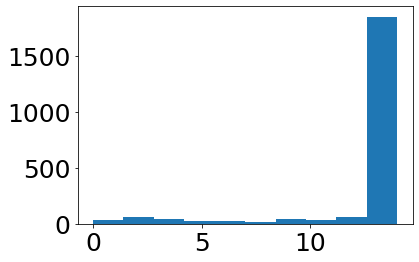

In [140]:
plt.hist(best_ages,range=(0.,14.0))

(3.5077142855284302, 10.0)

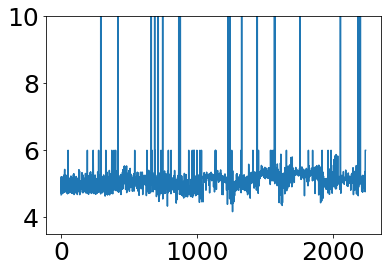

In [141]:
plt.plot(np.log10(best_chis))
plt.ylim(top=10)

(0.0, 14.0)

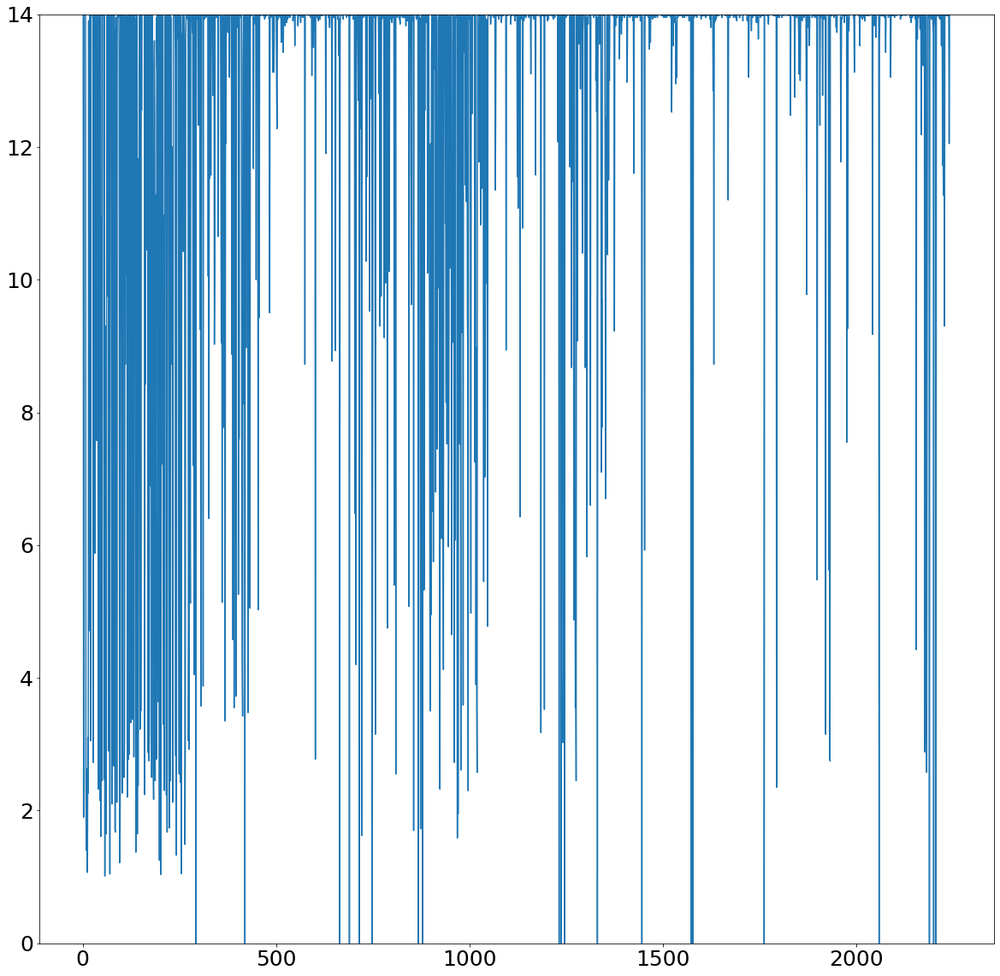

In [154]:
plt.figure(figsize=[20,20])
plt.plot(best_ages)
plt.ylim(0,14)

In [142]:
calc_clus_ages = np.array([])
for i in range(len(gcs_clus)):
    clus = np.where((gcs['CLUSTER']==gcs_clus[i])&(best_ages!=999999.0))
    calc_clus_ages = np.append(calc_clus_ages,np.median(best_ages[clus]))
    
print(calc_clus_ages)

[13.89984635 14.         13.97494159 14.         14.         13.97494156
 14.         14.         14.         13.97494155 14.         13.87490436
 14.         13.9749416  14.         13.97494206 13.97494156 13.97494155
 14.         13.96240323 14.         13.97494154 14.         13.97494151
 13.97494156 14.         14.         14.         14.         13.97494157]


In [143]:
for i in range(len(gcs_clus)):
    clus = np.where((gcs['CLUSTER']==gcs_clus[i]))
    print(np.median(shiftfeh[clus]))

-0.8149499917030334
-1.589649977684021
-1.0530349934101104
-1.3490499877929687
-1.562700035572052
-2.3717500591278076
-1.7981500053405761
-1.5517500066757202
-1.7691500210762023
-1.4805499935150146
-1.1173500442504882
-1.2800999903678894
-1.9679500484466552
-1.4646000289916992
-1.8304500007629394
-2.3043500804901123
-0.8404549980163574
-1.5572499656677246
-2.3223500871658325
-1.1793999695777893
-1.1560500288009643
-1.3302999758720397
-1.415950002670288
-1.1842499995231628
-2.296950044631958
-1.8840499544143676
-0.5485100173950195
-0.5492399954795837
-1.5452500009536743
-0.8152499818801879


In [150]:
vanden_age

array([11.75, 11.75, 12.  , 13.  , 12.  , 12.75, 11.9 , 11.75, 12.5 ,
       11.75, 11.5 , 11.5 , 12.25, 11.75, 13.  , 12.  , 11.  , 11.  ,
       12.75, 11.  , 11.  , 11.5 , 11.5 , 11.75, 12.25, 12.5 , 11.25,
       12.03, 12.5 , 11.26])

In [312]:
pwd

'/Users/joshuapovick/Desktop/Research/LMC_Ages/Age_Fitting'

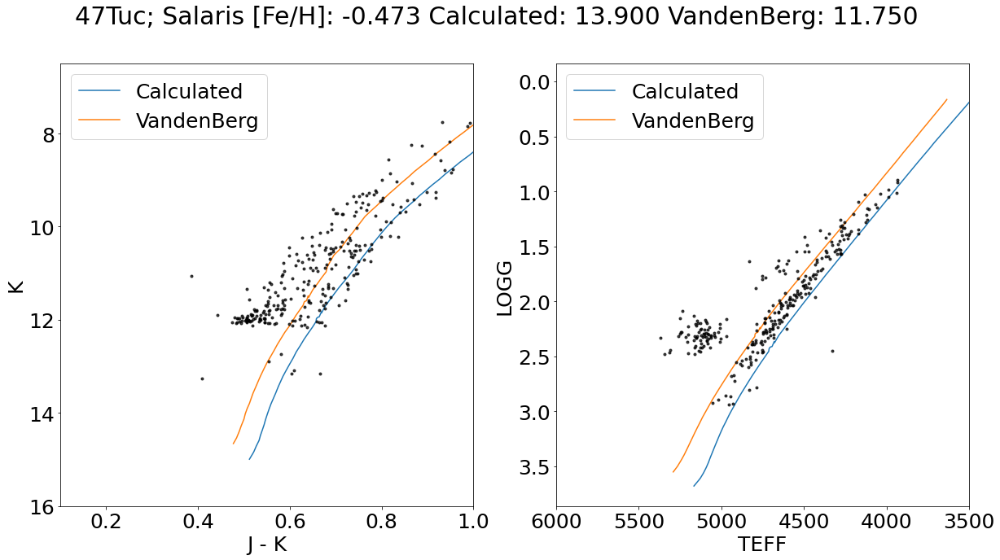

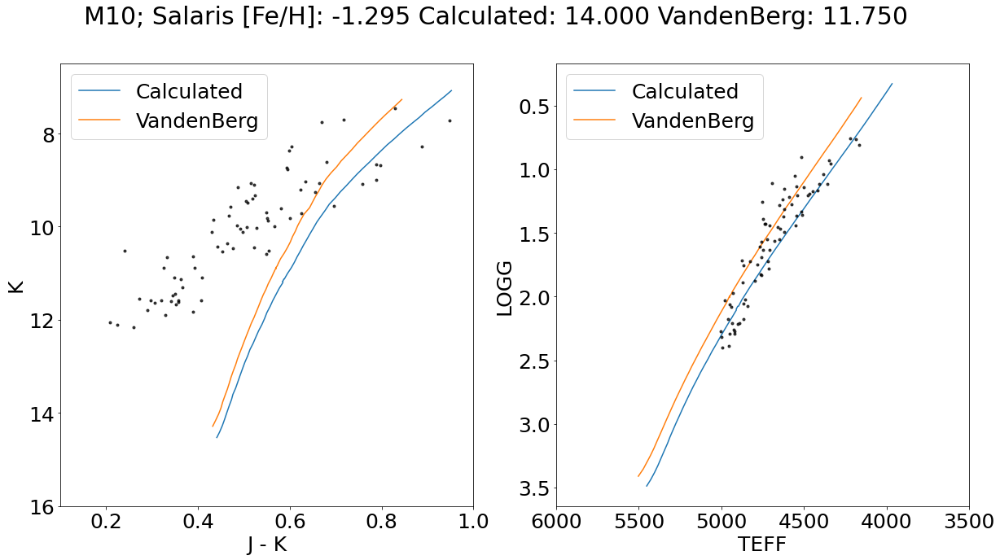

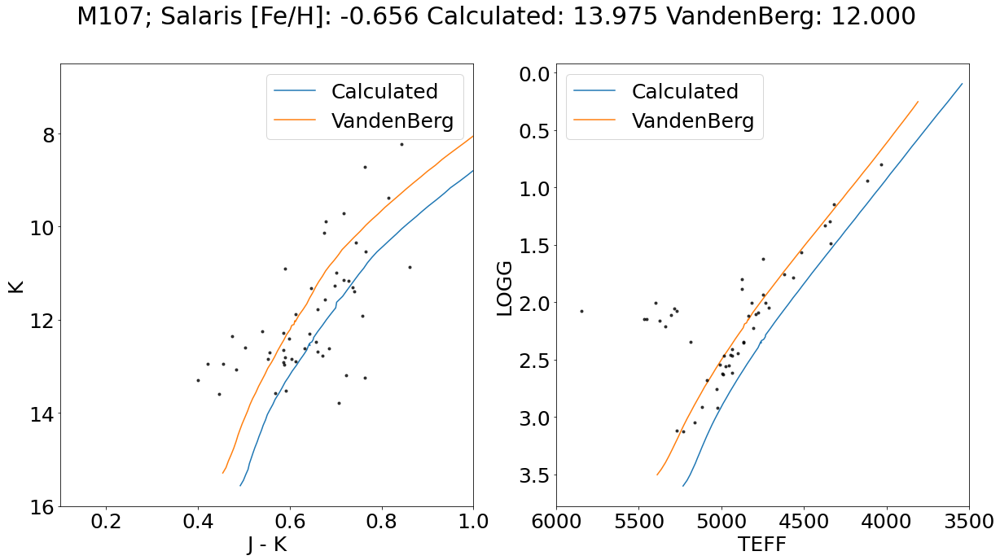

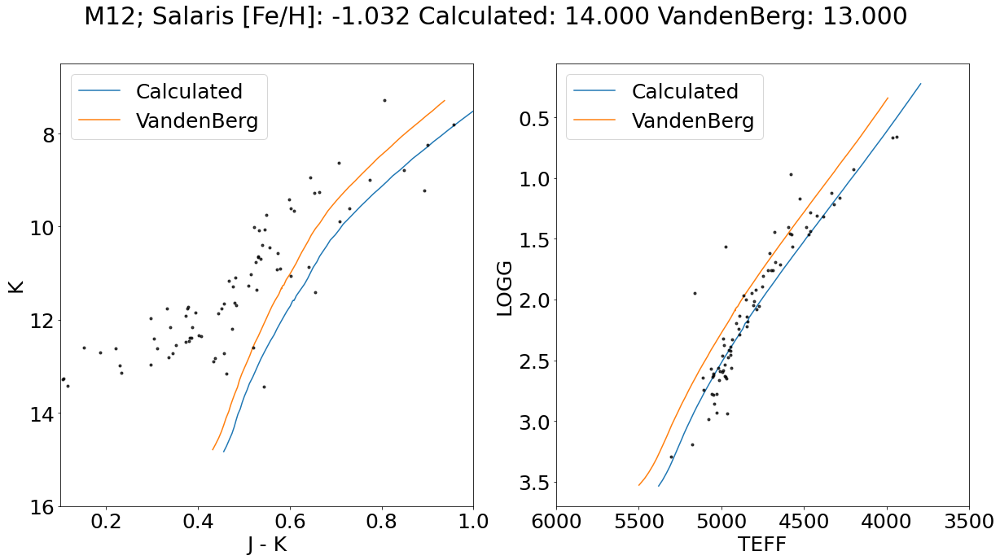

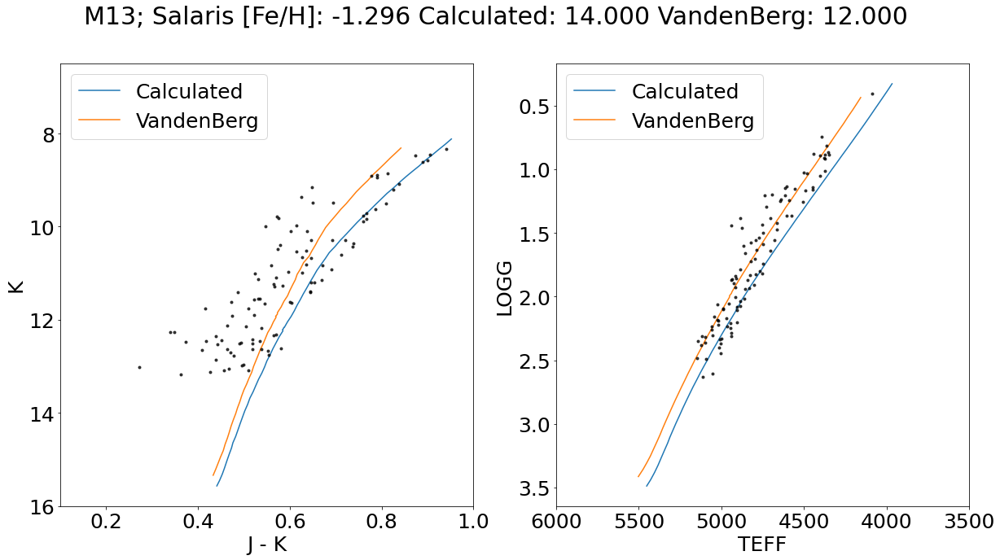

...

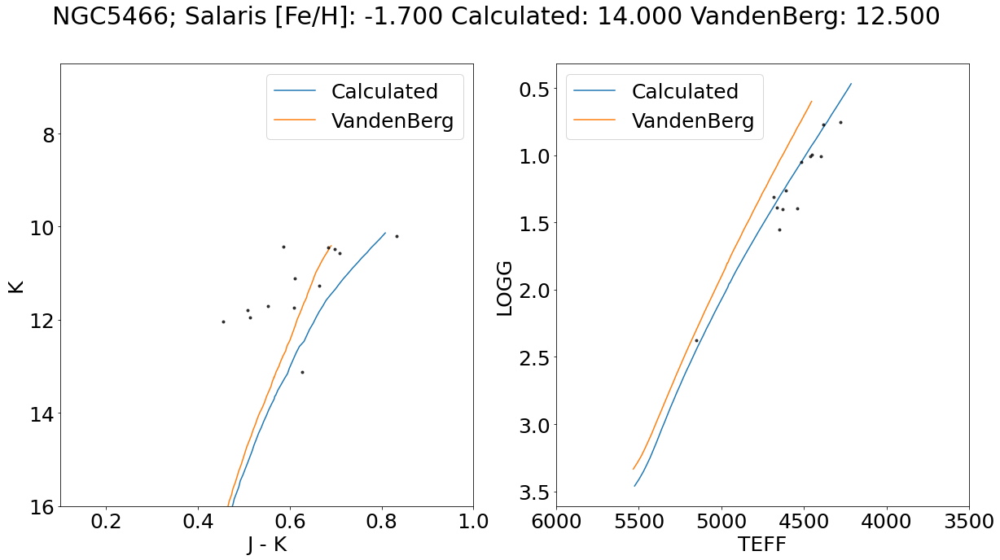

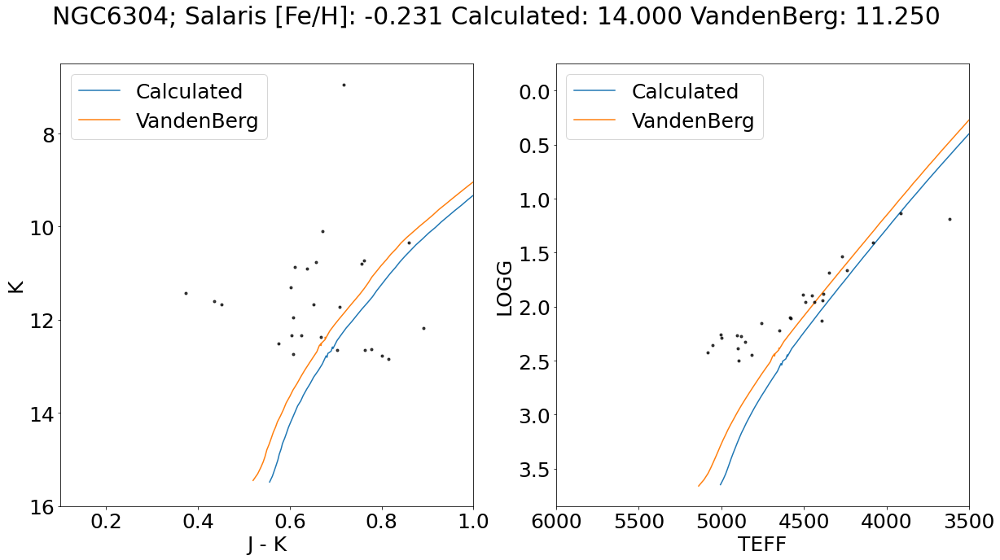

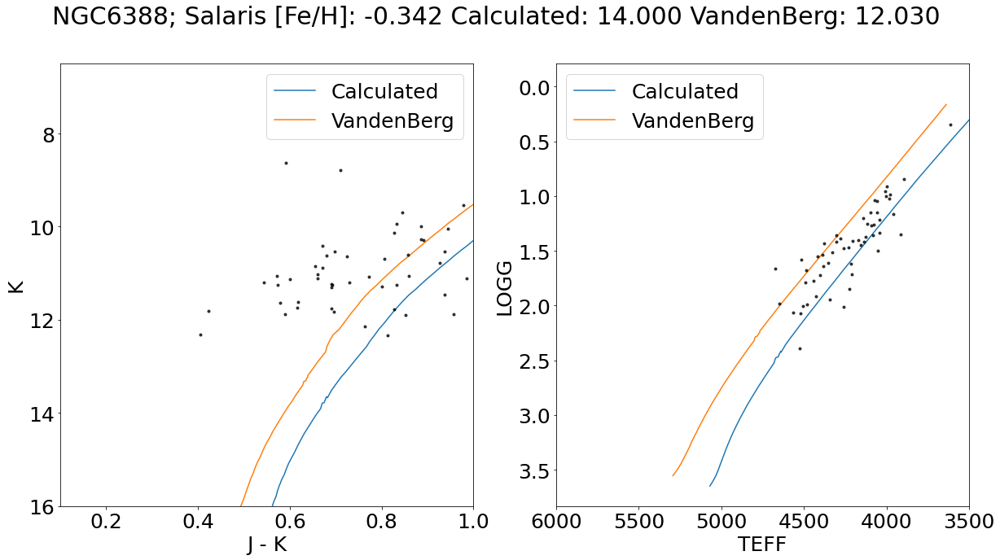

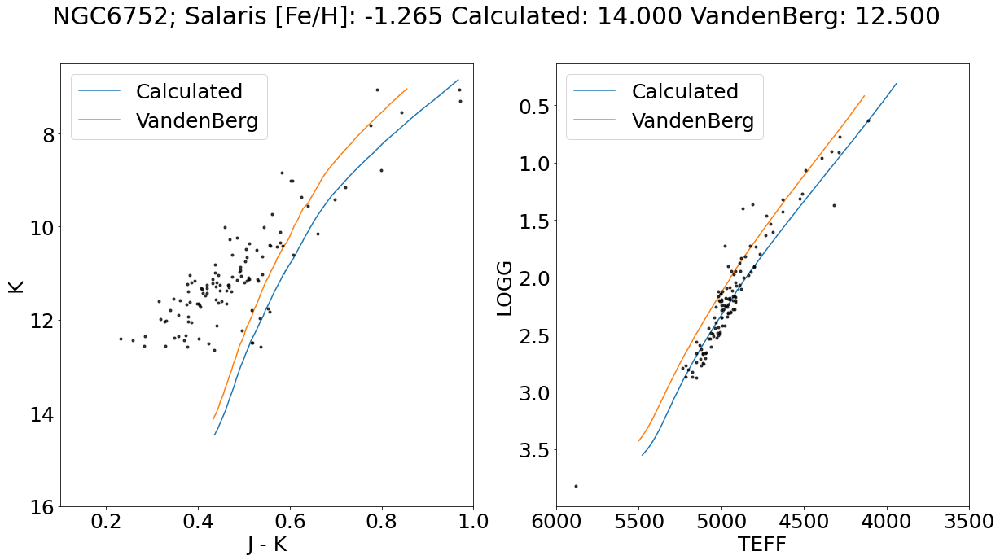

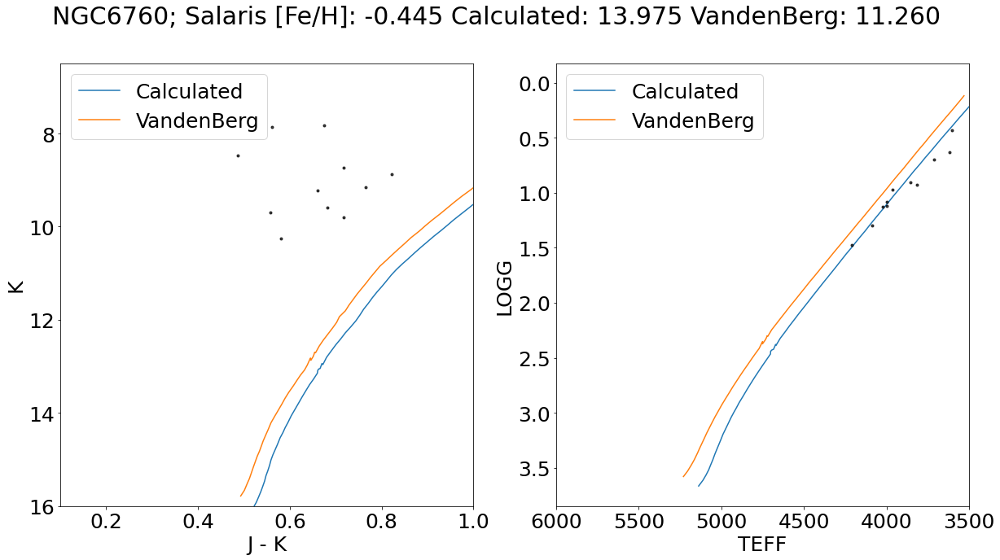

In [313]:
for i in range(len(gcs_clus)):
    clus = np.where((gcs['CLUSTER']==gcs_clus[i]))#&(best_aks!=999999.0))
    isopick = np.where((massive['MH']==closest(massive['MH'],np.median(all_sal_feh[clus])))&
                       (massive['logAge']==closest(massive['logAge'],np.log10(calc_clus_ages[i]*10**9))))
    
    calc_sort = np.argsort(massive['logTe'][isopick])
    
    isopick2 = np.where((massive['MH']==closest(massive['MH'],np.median(vanden_feh[i])))&
                       (massive['logAge']==closest(massive['logAge'],np.log10(vanden_age[i]*10**9))))
    
    vand_sort = np.argsort(massive['logTe'][isopick2])
    
    fig, ax = plt.subplots(1,2,figsize=[20,10])
    ax[0].plot((massive['Jmag']-massive['Ksmag'])[isopick][calc_sort],
                  massive['Ksmag'][isopick][calc_sort]+5.*np.log10(harris_dist[i])-5.0,zorder=0,
                  label='Calculated')
    ax[0].plot((massive['Jmag']-massive['Ksmag'])[isopick2][vand_sort],
                  massive['Ksmag'][isopick2][vand_sort]+5.*np.log10(harris_dist[i])-5.0,zorder=0,
                  label='VandenBerg')
    ax[0].legend()
    ax[0].scatter((gcsdr17['J']-gcsdr17['K']-best_aks*ejk_ak)[clus],gcsdr17['K'][clus]-best_aks[clus],c='k',
                  marker='.',zorder=1,alpha=0.75)
    ax[0].set_xlim(0.1,1.0)
    ax[0].set_ylim(6.5,16)
    ax[0].invert_yaxis()
    ax[0].set_xlabel(r'J - K')
    ax[0].set_ylabel(r'K')
    
    ax[1].plot(10**massive['logTe'][isopick][calc_sort],massive['logg'][isopick][calc_sort],
                  zorder=0,label='Calculated')
    ax[1].plot(10**massive['logTe'][isopick2][vand_sort],massive['logg'][isopick2][vand_sort],
                  zorder=0,label='VandenBerg')
    ax[1].legend()
    ax[1].scatter(gcsdr17['TEFF'][clus],gcsdr17['LOGG'][clus],c='k',marker='.',zorder=1,alpha=0.75)
    ax[1].set_xlim(3500,6000)
    ax[1].set_xlabel(r'TEFF')
    ax[1].set_ylabel(r'LOGG')
    ax[1].invert_yaxis()
    ax[1].invert_xaxis()
    
    plt.suptitle(r'{}; Salaris [Fe/H]: {:.3f} Calculated: {:.3f} VandenBerg: {:.3f} '.format(gcs_clus[i],
                                                                                np.median(all_sal_feh[clus]),
                                                                                calc_clus_ages[i],vanden_age[i]))
    plt.savefig('{}CMDHRGaiaOffset.pdf'.format(gcs_clus[i]),bbox_inches='tight')
    plt.show()

In [158]:
print(best_ages[np.where((gcs['CLUSTER']==gcs_clus[1])&(best_aks!=999999.0))])
print(vanden_age[1])

[13.94986484 13.97494154 13.47488312 14.         14.         13.57500515
 14.         14.         13.97494155 14.         13.92483321 14.
 13.94986485 14.         13.94986494 14.         13.97494154 14.
 13.94986483 14.         14.         14.         13.97494157 13.94986491
 13.97494153 14.         14.         14.         14.         14.
 14.         14.         14.         14.         13.97494151 14.
 13.97494158 14.         13.97494153 13.94986481 14.         14.
 13.97494155 13.94986476 14.         14.         13.97494157 13.94986485
 14.         13.97494158 14.         13.97494154 14.         14.
 14.         13.97494162 14.         13.94986484 13.94986482 13.97494155
 12.52492137 13.92483316 13.97494154 14.         13.52492921 14.
 13.97494154 14.         13.87490442 14.         14.         12.9500069
 13.84984792 13.04998455 14.        ]
11.75


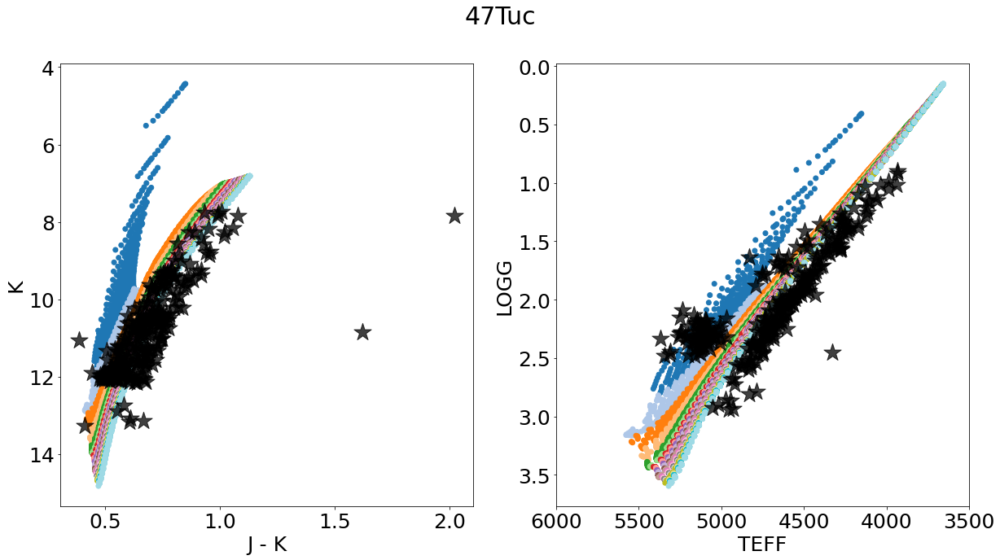

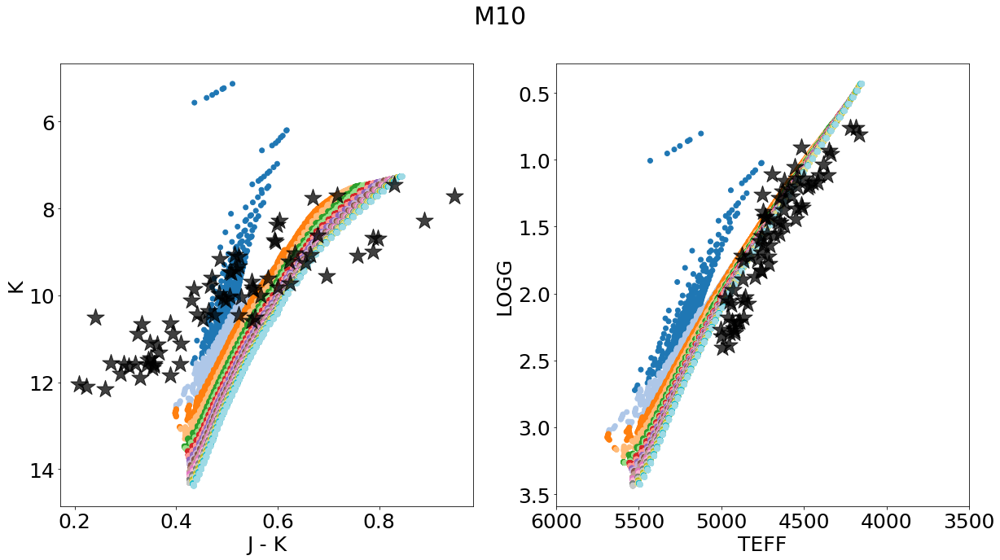

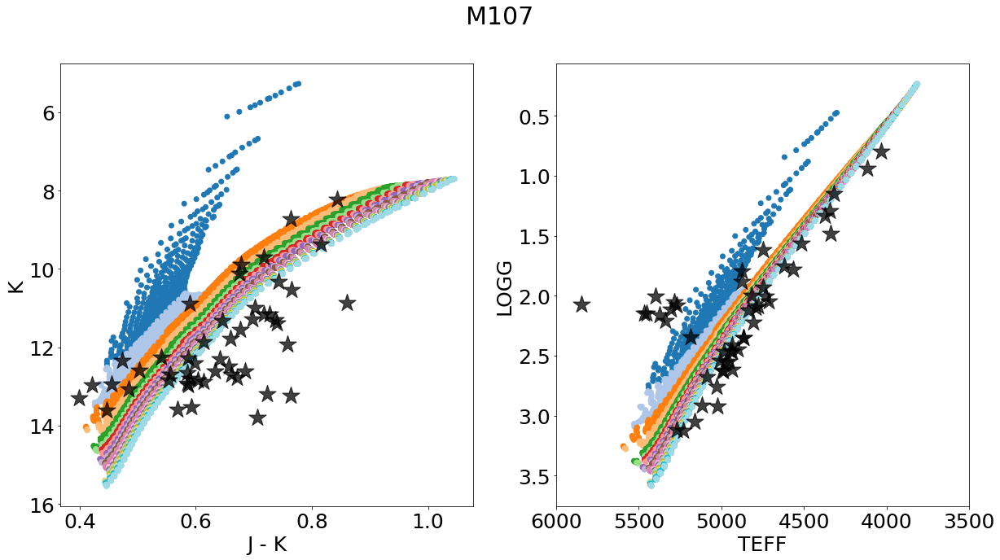

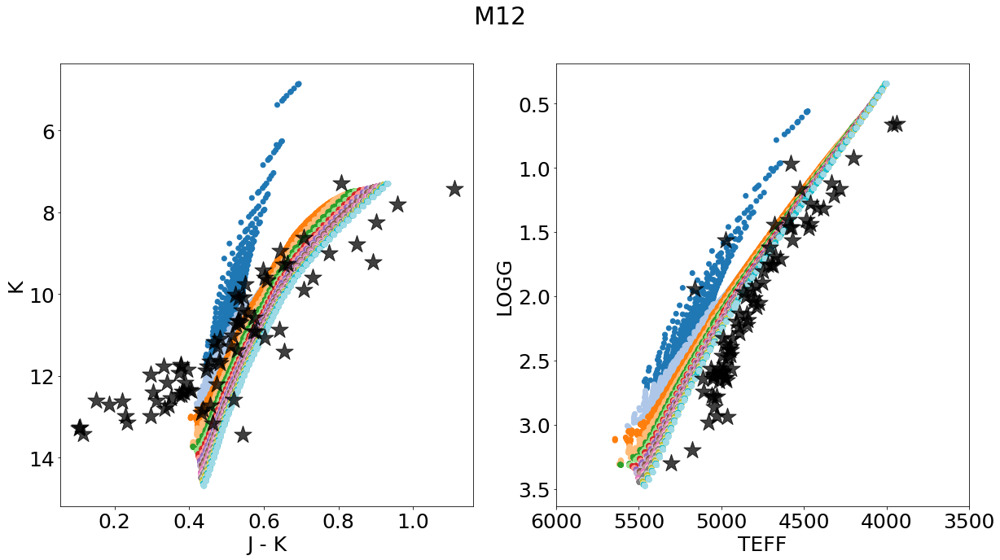

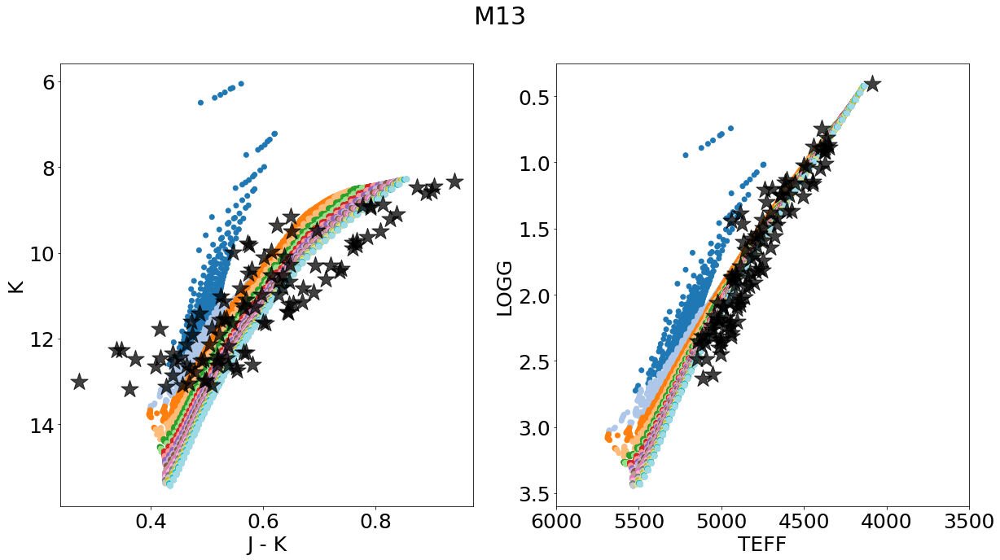

...

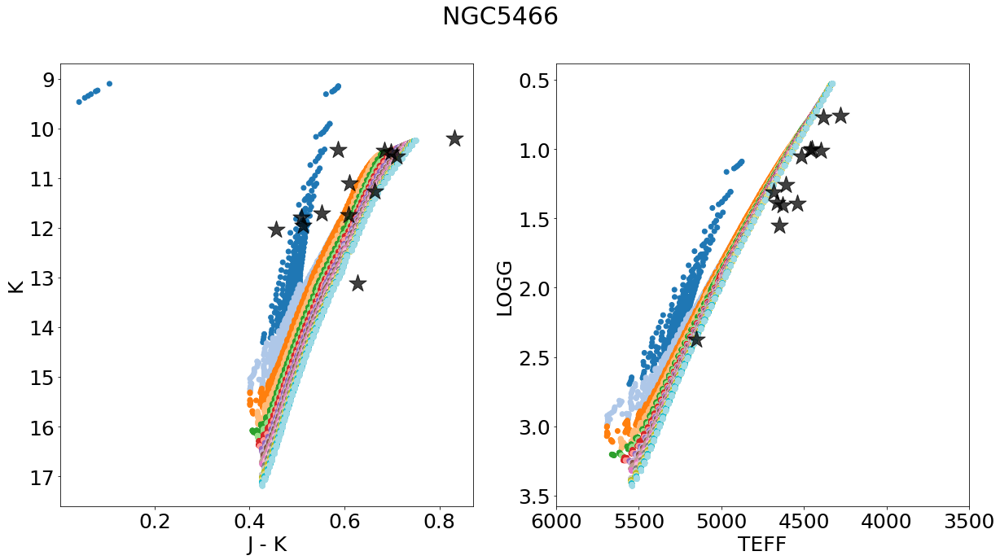

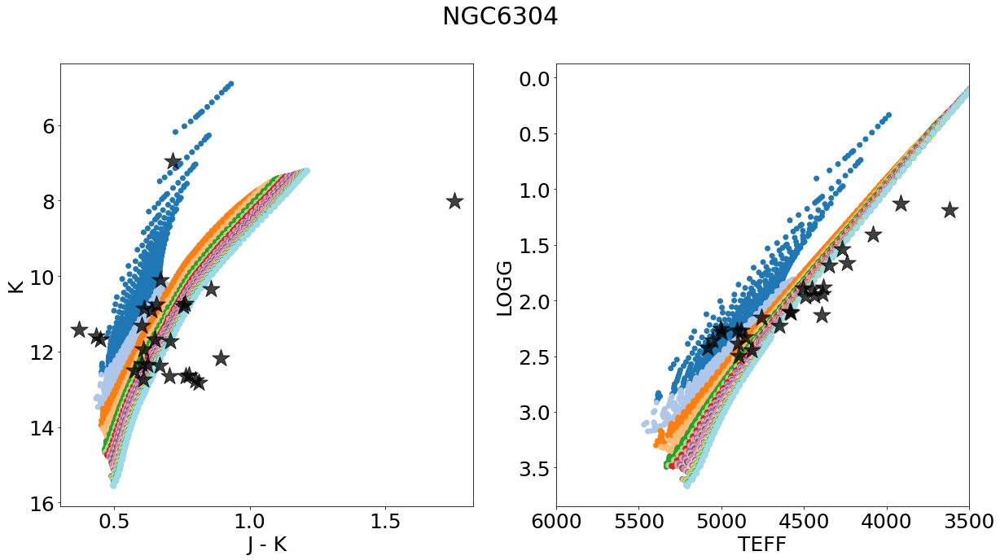

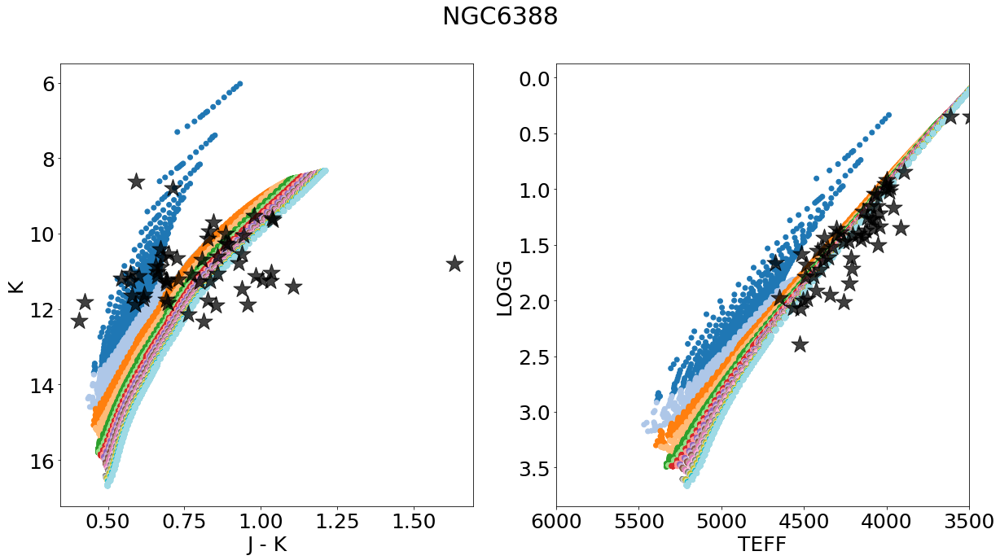

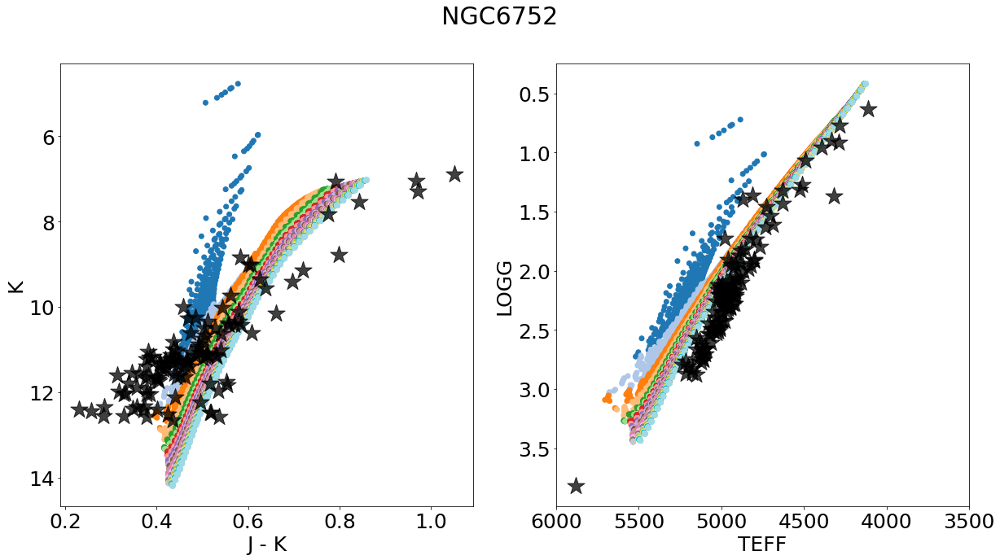

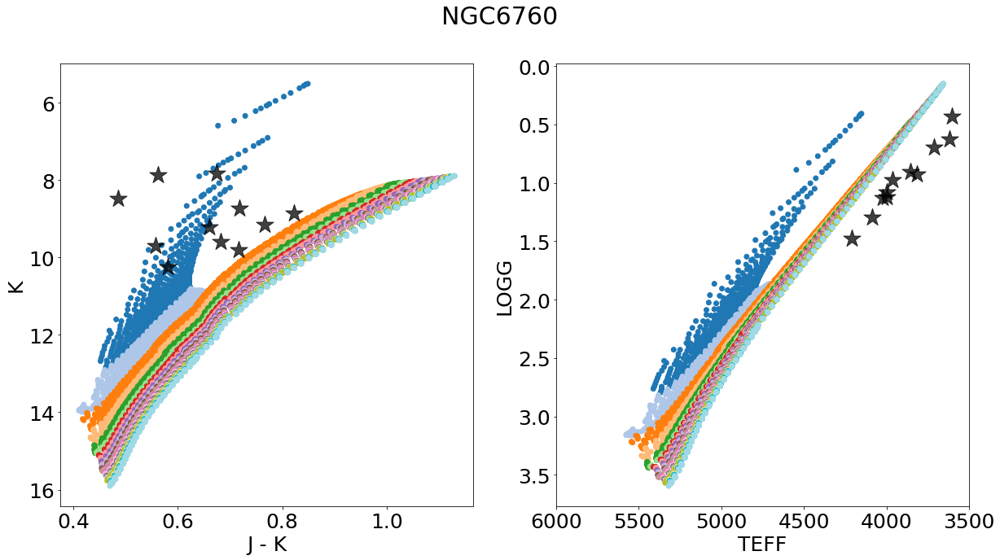

In [146]:
for i in range(len(gcs_clus)):
    clus = np.where((gcs['CLUSTER']==gcs_clus[i])&(best_aks!=999999.0))
    isopick = np.where(massive['MH']==closest(massive['MH'],np.median(shiftfeh[clus])))
    
    fig, ax = plt.subplots(1,2,figsize=[20,10])
    ax[0].scatter((massive['Jmag']-massive['Ksmag'])[isopick],
                  massive['Ksmag'][isopick]+5.*np.log10(harris_dist[i])-5.0,
                  c=10**massive['logAge'][isopick]/10**9,cmap='tab20',zorder=0)
    ax[0].scatter((gcsdr17['J']-gcsdr17['K']-best_aks*ejk_ak)[clus],gcsdr17['K'][clus]-best_aks[clus],c='k',
                  marker='*',s=500,zorder=1,alpha=0.75)
    ax[0].invert_yaxis()
    ax[0].set_xlabel(r'J - K')
    ax[0].set_ylabel(r'K')
    
    ax[1].scatter(10**massive['logTe'][isopick],massive['logg'][isopick],c=10**massive['logAge'][isopick]/10**9,
                  cmap='tab20',zorder=0)
    ax[1].scatter(gcsdr17['TEFF'][clus],gcsdr17['LOGG'][clus],c='k',marker='*',s=500,zorder=1,alpha=0.75)
    ax[1].set_xlim(3500,6000)
    ax[1].set_xlabel(r'TEFF')
    ax[1].set_ylabel(r'LOGG')
    ax[1].invert_yaxis()
    ax[1].invert_xaxis()
    
    plt.suptitle(r'{}'.format(gcs_clus[i]))
#     plt.savefig('{}CMDHR.pdf'.format(gcs_clus[i]),bbox_inches='tight')
#     plt.title(r'K, J - K; {}; Color as Age'.format(gcs_clus[i]))
    plt.show()

# Age - Magnitude Diagnostic Plot

In [237]:
m22_idx = np.where(gcs['CLUSTER']=='M22')

(array([8]),)

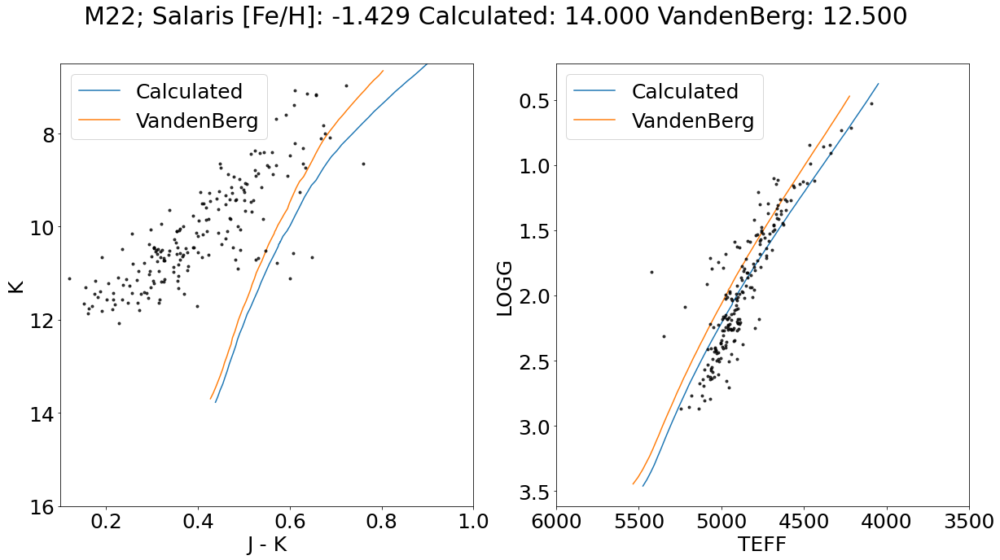

In [315]:
i = np.where(gcs_clus=='M22')
clus = np.where(gcs['CLUSTER']=='M22')#np.where((gcs['CLUSTER']==gcs_clus[i]))
isopick = np.where((massive['MH']==closest(massive['MH'],np.median(all_sal_feh[clus])))&
                    (massive['logAge']==closest(massive['logAge'],np.log10(calc_clus_ages[i]*10**9))))
    
calc_sort = np.argsort(massive['logTe'][isopick])
    
isopick2 = np.where((massive['MH']==closest(massive['MH'],np.median(vanden_feh[i])))&
                       (massive['logAge']==closest(massive['logAge'],np.log10(vanden_age[i]*10**9))))
    
vand_sort = np.argsort(massive['logTe'][isopick2])
    
fig, ax = plt.subplots(1,2,figsize=[20,10])
ax[0].plot((massive['Jmag']-massive['Ksmag'])[isopick][calc_sort],
                  massive['Ksmag'][isopick][calc_sort]+5.*np.log10(harris_dist[i])-5.0,zorder=0,
                  label='Calculated')
ax[0].plot((massive['Jmag']-massive['Ksmag'])[isopick2][vand_sort],
                  massive['Ksmag'][isopick2][vand_sort]+5.*np.log10(harris_dist[i])-5.0,zorder=0,
                  label='VandenBerg')
ax[0].legend()
ax[0].scatter((gcsdr17['J']-gcsdr17['K']-best_aks*ejk_ak)[clus],gcsdr17['K'][clus]-best_aks[clus],c='k',
                  marker='.',zorder=1,alpha=0.75)
ax[0].set_xlim(0.1,1.0)
ax[0].set_ylim(6.5,16)
ax[0].invert_yaxis()
ax[0].set_xlabel(r'J - K')
ax[0].set_ylabel(r'K')
    
ax[1].plot(10**massive['logTe'][isopick][calc_sort],massive['logg'][isopick][calc_sort],
                  zorder=0,label='Calculated')
ax[1].plot(10**massive['logTe'][isopick2][vand_sort],massive['logg'][isopick2][vand_sort],
                  zorder=0,label='VandenBerg')
ax[1].legend()
ax[1].scatter(gcsdr17['TEFF'][clus],gcsdr17['LOGG'][clus],c='k',marker='.',zorder=1,alpha=0.75)
ax[1].set_xlim(3500,6000)
ax[1].set_xlabel(r'TEFF')
ax[1].set_ylabel(r'LOGG')
ax[1].invert_yaxis()
ax[1].invert_xaxis()
    
plt.suptitle(r'M22; Salaris [Fe/H]: {:.3f} Calculated: {:.3f} VandenBerg: {:.3f} '.format(
                                                                                np.median(all_sal_feh[clus]),
                                                                                calc_clus_ages[8],vanden_age[8]));

In [184]:
np.where((gcs['APOGEE_ID']==gcsdr17['APOGEE_ID'])==False)

(array([], dtype=int64),)

In [191]:
closest((gcsdr17['J']-gcsdr17['K']-best_aks*ejk_ak)[clus],0.16)

nan

In [192]:
np.where(np.isfinite((gcsdr17['J']-gcsdr17['K']-best_aks*ejk_ak)[clus])==False)

(array([202, 203]),)

In [197]:
def euclid2d(data,pt):
    x1,y1 = data
    x0,y0 = pt
    euc = np.subtract(x1,x0)**2+np.subtract(y1,y0)**2
    return euc.argmin()

In [217]:
euclid2d(np.array([(gcsdr17['J']-gcsdr17['K']-best_aks*ejk_ak)[clus][:201],(gcsdr17['K']-best_aks)[clus][:201]]),
         np.array([0.5,7]))

23

In [206]:
euclid2d(np.array([(gcsdr17['J']-gcsdr17['K']-best_aks*ejk_ak)[clus][:201],(gcsdr17['K']-best_aks)[clus][:201]]),
         np.array([0.4,10]))

136

In [208]:
euclid2d(np.array([(gcsdr17['J']-gcsdr17['K']-best_aks*ejk_ak)[clus][:201],(gcsdr17['K']-best_aks)[clus][:201]]),
         np.array([0.2,12]))

118

In [213]:
euclid2d(np.array([(gcsdr17['J']-gcsdr17['K']-best_aks*ejk_ak)[clus][:201],(gcsdr17['K']-best_aks)[clus][:201]]),
         np.array([0.0,10]))

36

In [219]:
euclid2d(np.array([(gcsdr17['J']-gcsdr17['K']-best_aks*ejk_ak)[clus][:201],(gcsdr17['K']-best_aks)[clus][:201]]),
         np.array([0.5,9]))

151

Text(0, 0.5, 'K')

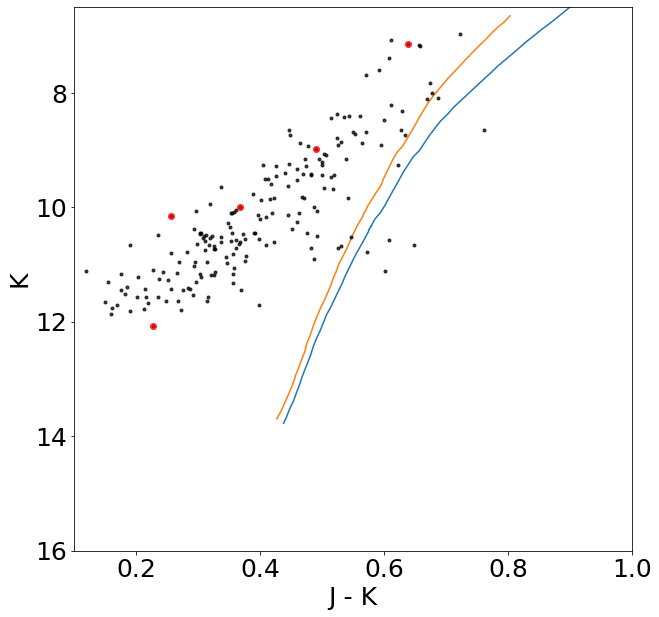

In [309]:
plt.figure(figsize=[10,10])
plt.plot((massive['Jmag']-massive['Ksmag'])[isopick][calc_sort],
                  massive['Ksmag'][isopick][calc_sort]+5.*np.log10(harris_dist[i])-5.0,zorder=0,
                  label='Calculated')
plt.plot((massive['Jmag']-massive['Ksmag'])[isopick2][vand_sort],
                  massive['Ksmag'][isopick2][vand_sort]+5.*np.log10(harris_dist[i])-5.0,zorder=0,
                  label='VandenBerg')

plt.scatter((gcsdr17['J']-gcsdr17['K']-best_aks*ejk_ak)[clus],(gcsdr17['K']-best_aks)[clus],c='k',
                  marker='.',zorder=1,alpha=0.75)

plt.scatter((gcsdr17['J']-gcsdr17['K']-best_aks*ejk_ak)[clus][23],(gcsdr17['K']-best_aks)[clus][23],c='r',
                  zorder=1,alpha=0.75)
plt.scatter((gcsdr17['J']-gcsdr17['K']-best_aks*ejk_ak)[clus][136],(gcsdr17['K']-best_aks)[clus][136],c='r',
                  zorder=1,alpha=0.75)
plt.scatter((gcsdr17['J']-gcsdr17['K']-best_aks*ejk_ak)[clus][118],(gcsdr17['K']-best_aks)[clus][118],c='r',
                  zorder=1,alpha=0.75)
plt.scatter((gcsdr17['J']-gcsdr17['K']-best_aks*ejk_ak)[clus][36],(gcsdr17['K']-best_aks)[clus][36],c='r',
                  zorder=1,alpha=0.75)
plt.scatter((gcsdr17['J']-gcsdr17['K']-best_aks*ejk_ak)[clus][151],(gcsdr17['K']-best_aks)[clus][151],c='r',
                  zorder=1,alpha=0.75)

plt.xlim(0.1,1.0)
plt.ylim(6.5,16)
plt.gca().invert_yaxis()
plt.xlabel(r'J - K')
plt.ylabel(r'K')

Text(0, 0.5, 'LOGG')

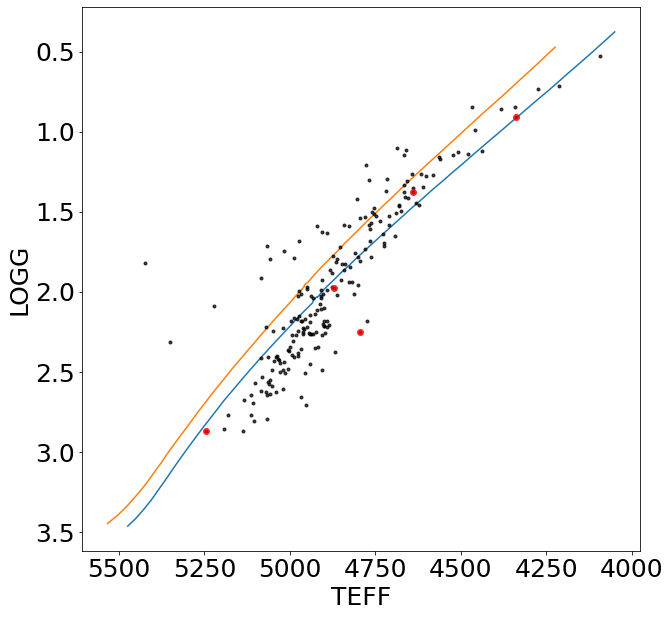

In [310]:
plt.figure(figsize=[10,10])
plt.plot(10**massive['logTe'][isopick][calc_sort],massive['logg'][isopick][calc_sort],zorder=0,label='Calculated')
plt.plot(10**massive['logTe'][isopick2][vand_sort],massive['logg'][isopick2][vand_sort],
         zorder=0,label='VandenBerg')

plt.scatter(gcsdr17['TEFF'][clus],gcsdr17['LOGG'][clus],c='k',marker='.',zorder=1,alpha=0.75)

plt.scatter(gcsdr17['TEFF'][clus][23],gcsdr17['LOGG'][clus][23],c='r',zorder=1,alpha=0.75)
plt.scatter(gcsdr17['TEFF'][clus][136],gcsdr17['LOGG'][clus][136],c='r',zorder=1,alpha=0.75)
plt.scatter(gcsdr17['TEFF'][clus][118],gcsdr17['LOGG'][clus][118],c='r',zorder=1,alpha=0.75)
plt.scatter(gcsdr17['TEFF'][clus][36],gcsdr17['LOGG'][clus][36],c='r',zorder=1,alpha=0.75)
plt.scatter(gcsdr17['TEFF'][clus][151],gcsdr17['LOGG'][clus][151],c='r',zorder=1,alpha=0.75)

# plt.xlim(0.1,1.0)
# plt.ylim(6.5,16)
plt.gca().invert_yaxis()
plt.gca().invert_xaxis()
plt.xlabel(r'TEFF')
plt.ylabel(r'LOGG')

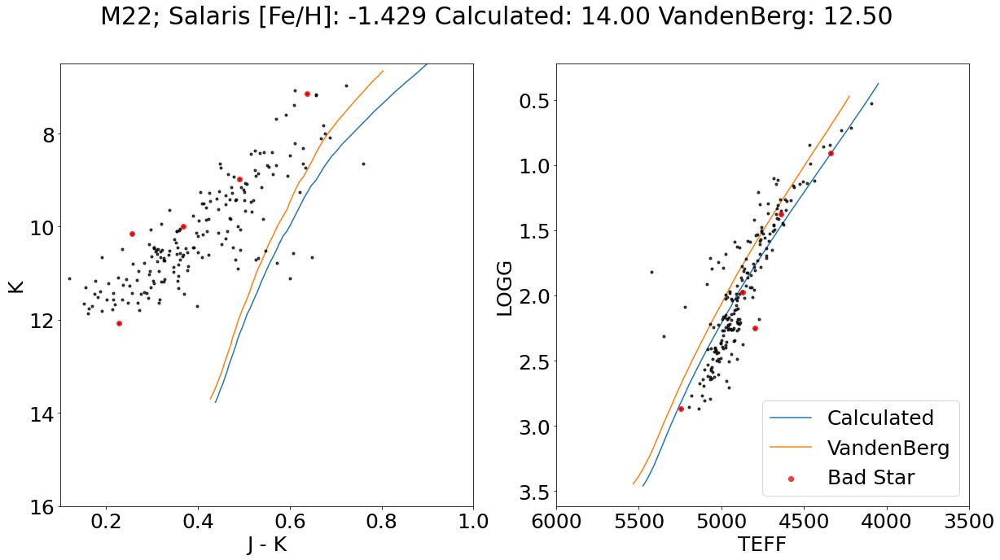

In [321]:
i = np.where(gcs_clus=='M22')
clus = np.where(gcs['CLUSTER']=='M22')#np.where((gcs['CLUSTER']==gcs_clus[i]))
isopick = np.where((massive['MH']==closest(massive['MH'],np.median(all_sal_feh[clus])))&
                    (massive['logAge']==closest(massive['logAge'],np.log10(calc_clus_ages[i]*10**9))))
    
calc_sort = np.argsort(massive['logTe'][isopick])
    
isopick2 = np.where((massive['MH']==closest(massive['MH'],np.median(vanden_feh[i])))&
                       (massive['logAge']==closest(massive['logAge'],np.log10(vanden_age[i]*10**9))))
    
vand_sort = np.argsort(massive['logTe'][isopick2])
    
fig, ax = plt.subplots(1,2,figsize=[20,10])
ax[0].plot((massive['Jmag']-massive['Ksmag'])[isopick][calc_sort],
                  massive['Ksmag'][isopick][calc_sort]+5.*np.log10(harris_dist[i])-5.0,zorder=0,
                  label='Calculated')
ax[0].plot((massive['Jmag']-massive['Ksmag'])[isopick2][vand_sort],
                  massive['Ksmag'][isopick2][vand_sort]+5.*np.log10(harris_dist[i])-5.0,zorder=0,
                  label='VandenBerg')

ax[0].scatter((gcsdr17['J']-gcsdr17['K']-best_aks*ejk_ak)[clus],gcsdr17['K'][clus]-best_aks[clus],c='k',
                  marker='.',zorder=1,alpha=0.75)

ax[0].scatter((gcsdr17['J']-gcsdr17['K']-best_aks*ejk_ak)[clus][23],(gcsdr17['K']-best_aks)[clus][23],c='r',
                  zorder=1,alpha=0.75)
ax[0].scatter((gcsdr17['J']-gcsdr17['K']-best_aks*ejk_ak)[clus][136],(gcsdr17['K']-best_aks)[clus][136],c='r',
                  zorder=1,alpha=0.75)
ax[0].scatter((gcsdr17['J']-gcsdr17['K']-best_aks*ejk_ak)[clus][118],(gcsdr17['K']-best_aks)[clus][118],c='r',
                  zorder=1,alpha=0.75)
ax[0].scatter((gcsdr17['J']-gcsdr17['K']-best_aks*ejk_ak)[clus][36],(gcsdr17['K']-best_aks)[clus][36],c='r',
                  zorder=1,alpha=0.75)
ax[0].scatter((gcsdr17['J']-gcsdr17['K']-best_aks*ejk_ak)[clus][151],(gcsdr17['K']-best_aks)[clus][151],c='r',
                  zorder=1,alpha=0.75)

ax[0].set_xlim(0.1,1.0)
ax[0].set_ylim(6.5,16)
ax[0].invert_yaxis()
ax[0].set_xlabel(r'J - K')
ax[0].set_ylabel(r'K')
    
ax[1].plot(10**massive['logTe'][isopick][calc_sort],massive['logg'][isopick][calc_sort],
                  zorder=0,label='Calculated')
ax[1].plot(10**massive['logTe'][isopick2][vand_sort],massive['logg'][isopick2][vand_sort],
                  zorder=0,label='VandenBerg')

ax[1].scatter(gcsdr17['TEFF'][clus],gcsdr17['LOGG'][clus],c='k',marker='.',zorder=1,alpha=0.75)

ax[1].scatter(gcsdr17['TEFF'][clus][23],gcsdr17['LOGG'][clus][23],c='r',zorder=1,alpha=0.75,label='Bad Star')
ax[1].legend(loc='lower right')
ax[1].scatter(gcsdr17['TEFF'][clus][136],gcsdr17['LOGG'][clus][136],c='r',zorder=1,alpha=0.75)
ax[1].scatter(gcsdr17['TEFF'][clus][118],gcsdr17['LOGG'][clus][118],c='r',zorder=1,alpha=0.75)
ax[1].scatter(gcsdr17['TEFF'][clus][36],gcsdr17['LOGG'][clus][36],c='r',zorder=1,alpha=0.75)
ax[1].scatter(gcsdr17['TEFF'][clus][151],gcsdr17['LOGG'][clus][151],c='r',zorder=1,alpha=0.75)

ax[1].set_xlim(3500,6000)
ax[1].set_xlabel(r'TEFF')
ax[1].set_ylabel(r'LOGG')
ax[1].invert_yaxis()
ax[1].invert_xaxis()
    
plt.suptitle(r'M22; Salaris [Fe/H]: {:.3f} Calculated: {:.2f} VandenBerg: {:.2f} '.format(
                                                                                np.median(all_sal_feh[clus]),
                                                                                calc_clus_ages[8],vanden_age[8]))

plt.savefig('M22SideBySide.pdf',bbox_inches='tight')
plt.show()

In [60]:
m22_idx = np.where(gcs['CLUSTER']=='M22')
bads = np.array([23,136,118,36,151])
globbads = np.array([])

for i in range(len(bads)):
    globbads = np.append(globbads,np.squeeze(m22_idx)[bads[i]])
    
globbads = globbads.astype(int)
globbads = [globbads[3]]

In [61]:
globbads

[1742]

In [56]:
gcsdr17.columns

ColDefs(
    name = 'APOGEE_ID'; format = '30A'
    name = 'TELESCOPE'; format = '6A'
    name = 'FIELD'; format = '20A'
    name = 'ALT_ID'; format = '30A'
    name = 'RA'; format = 'D'
    name = 'DEC'; format = 'D'
    name = 'GLON'; format = 'D'
    name = 'GLAT'; format = 'D'
    name = 'J'; format = 'E'
    name = 'J_ERR'; format = 'E'
    name = 'H'; format = 'E'
    name = 'H_ERR'; format = 'E'
    name = 'K'; format = 'E'
    name = 'K_ERR'; format = 'E'
    name = 'AK_TARG'; format = 'E'
    name = 'AK_TARG_METHOD'; format = '32A'
    name = 'AK_WISE'; format = 'E'
    name = 'SFD_EBV'; format = 'E'
    name = 'APOGEE_TARGET1'; format = 'J'
    name = 'APOGEE_TARGET2'; format = 'J'
    name = 'APOGEE2_TARGET1'; format = 'J'
    name = 'APOGEE2_TARGET2'; format = 'J'
    name = 'APOGEE2_TARGET3'; format = 'J'
    name = 'APOGEE2_TARGET4'; format = 'J'
    name = 'TARGFLAGS'; format = '132A'
    name = 'SURVEY'; format = '32A'
    name = 'PROGRAMNAME'; format = '32A'
    name =

In [64]:
print([np.round(bperr[globbads[0]],3),np.round(rperr[globbads[0]],3),gcsdr17['J_ERR'][globbads[0]],
       gcsdr17['H_ERR'][globbads[0]],gcsdr17['K_ERR'][globbads[0]]])
print(gcsdr17['APOGEE_ID'][globbads[0]])

[0.003, 0.004, 0.024, 0.026, 0.026]
2M18360122-2348521


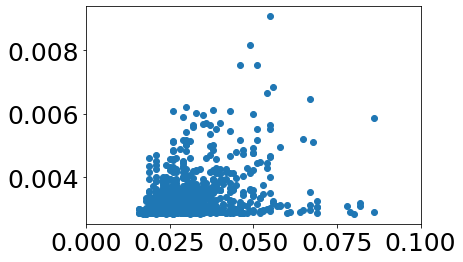

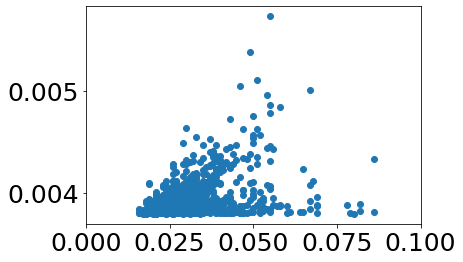

In [70]:
plt.scatter(gcsdr17['K_ERR'],bperr)
plt.xlim(0,0.1)
plt.show()

plt.scatter(gcsdr17['K_ERR'],rperr)
plt.xlim(0,0.1)
plt.show()

(array([100.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.]),
 array([0.  , 0.01, 0.02, 0.03, 0.04, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1 ]),
 <a list of 1 Patch objects>)

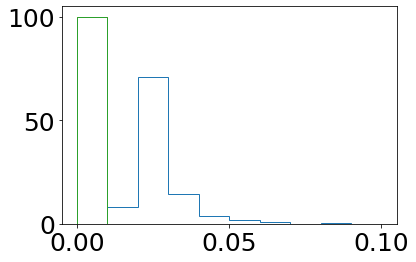

In [74]:
plt.hist(gcsdr17['K_ERR'],range=(0,0.1),density=True,histtype='step')
plt.hist(bperr,range=(0,0.1),density=True,histtype='step')
plt.hist(rperr,range=(0,0.1),density=True,histtype='step')

(array([ 18.,  58., 123., 259., 379., 523., 446., 313., 111.,  14.]),
 array([ 9.35339 , 10.00522 , 10.657052, 11.308883, 11.960714, 12.612545,
        13.264376, 13.916207, 14.568038, 15.21987 , 15.8717  ],
       dtype=float32),
 <a list of 10 Patch objects>)

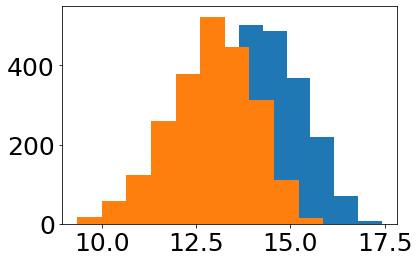

In [77]:
plt.hist(gcsdr17['GAIAEDR3_PHOT_BP_MEAN_MAG'])
plt.hist(gcsdr17['GAIAEDR3_PHOT_RP_MEAN_MAG'])

(array([1.941e+03, 1.910e+02, 5.500e+01, 2.800e+01, 1.600e+01, 7.000e+00,
        2.000e+00, 2.000e+00, 1.000e+00, 1.000e+00]),
 array([0.00284996, 0.00347272, 0.00409547, 0.00471823, 0.00534099,
        0.00596374, 0.0065865 , 0.00720925, 0.00783201, 0.00845476,
        0.00907752]),
 <a list of 10 Patch objects>)

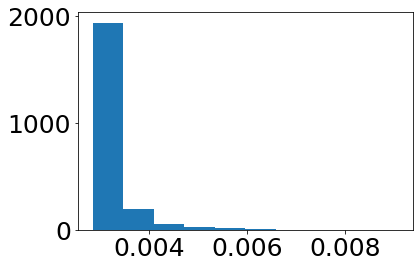

In [65]:
plt.hist(bperr)

In [267]:
m22badtheos = 999999.0*np.ones((len(np.arange(0,15,0.25)),len(globbads),5))
np.shape(m22badtheos)

(60, 5, 5)

In [268]:
m22badtheos = 999999.0*np.ones((len(np.arange(0,15,0.25)),len(globbads),5))
m22badtheos0 = 999999.0*np.ones((len(np.arange(0,15,0.25)),len(globbads),5))

# for i in tqdm_notebook(range(len(gcs_bad_idx))):
#     CalcAge = WhatsMyAgeAgain(gcs['M_H'][gcs_bad_idx[i]],gcs['ALPHA_M'][gcs_bad_idx[i]],gcs_dist[gcs_bad_idx[i]],
#                               3.1,massive)

#     for j in range(len(np.arange(0,15,0.25))):
#         theo = CalcAge.Teff2AppMags(gcs['TEFF'][gcs_bad_idx[i]],np.arange(0,15,0.25)[j],m22bestaks[bads[i]])
#         theo0 = CalcAge.Teff2AppMags(gcs['TEFF'][gcs_bad_idx[i]],np.arange(0,15,0.25)[j],0)
#         m22badtheos[j,i,0] = theo[0]
#         m22badtheos[j,i,1] = theo[1]
#         m22badtheos[j,i,2] = theo[2]
#         m22badtheos0[j,i,0] = theo0[0]
#         m22badtheos0[j,i,1] = theo0[1]
#         m22badtheos0[j,i,2] = theo0[2]

for i in range(len(globbads)):
    idx = globbads.astype(int)[i]
#     print(idx)
    cnalpha = np.array([gcsdr17['C_FE'][idx],gcsdr17['N_FE'][idx],gcsdr17['O_FE'][idx],gcsdr17['MG_FE'][idx],
                        gcsdr17['SI_FE'][idx],gcsdr17['S_FE'][idx],gcsdr17['CA_FE'][idx],gcsdr17['TI_FE'][idx]])
    CalcAge = AetasStellae(shiftfeh[idx],cnalpha,gcs_dist[idx],3.1,massive)
    
    for j in range(len(np.arange(0,15,0.25))):
        theo = CalcAge.Teff2AppMags(gcs['TEFF'][idx],np.arange(0,15,0.25)[j],best_aks[idx])
        theo0 = CalcAge.Teff2AppMags(gcs['TEFF'][idx],np.arange(0,15,0.25)[j],0)
        m22badtheos[j,i,0] = theo[0]
        m22badtheos[j,i,1] = theo[1]
        m22badtheos[j,i,2] = theo[2]
        m22badtheos[j,i,3] = theo[3]
        m22badtheos[j,i,4] = theo[4]
        m22badtheos0[j,i,0] = theo0[0]
        m22badtheos0[j,i,1] = theo0[1]
        m22badtheos0[j,i,2] = theo0[2]
        m22badtheos0[j,i,3] = theo0[3]
        m22badtheos0[j,i,4] = theo0[4]
        

<ipython-input-105-057d33b5ac3f>:226: RuntimeWarning: divide by zero encountered in log10
  lgage = np.log10(age*10**9)


(array([  30.,   61.,   45.,   25.,   28.,   20.,   44.,   36.,   61.,
        1850.]),
 array([ 0. ,  1.4,  2.8,  4.2,  5.6,  7. ,  8.4,  9.8, 11.2, 12.6, 14. ]),
 <a list of 10 Patch objects>)

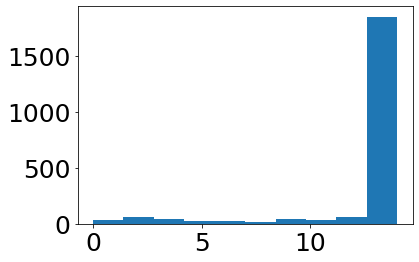

In [276]:
plt.hist(best_ages,range=(0,14))

In [300]:
vanden_age[np.where(gcs_clus=='M22')]

array([12.5])

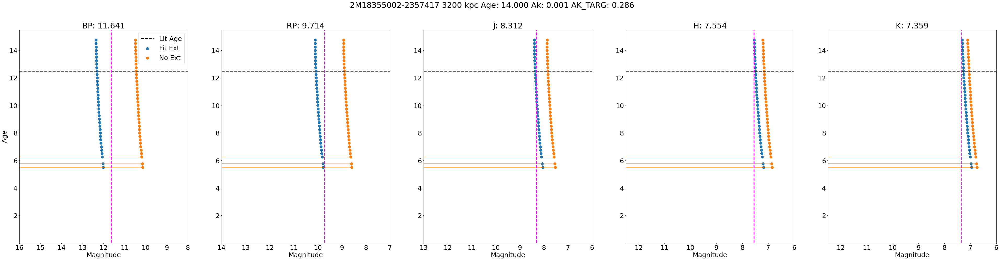

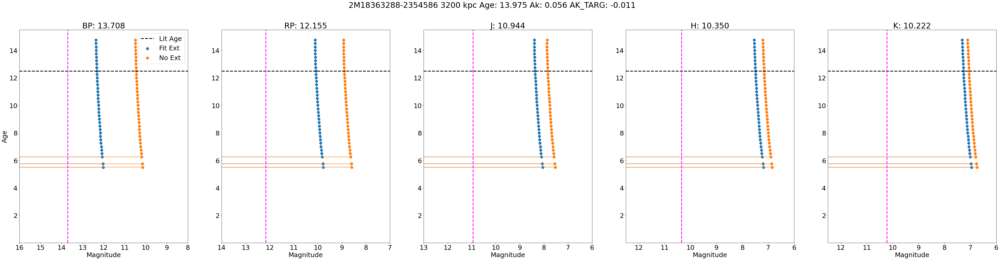

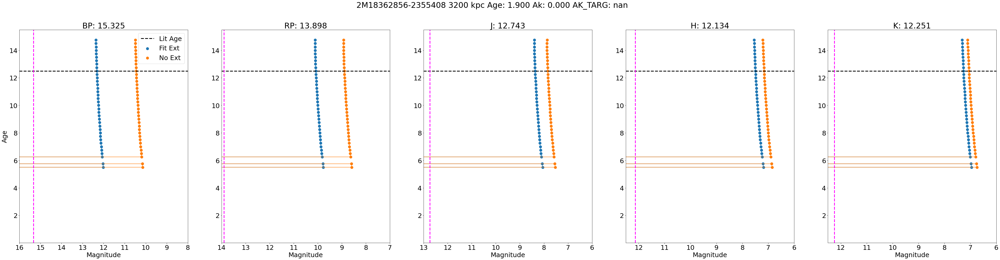

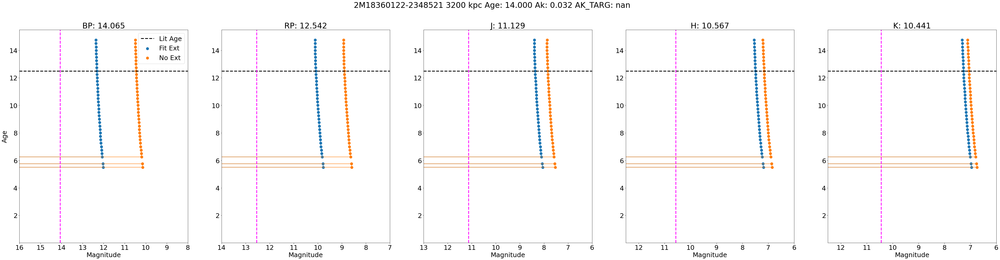

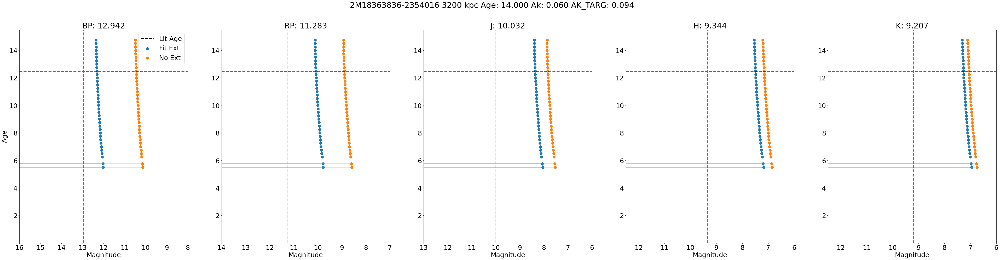

In [325]:
bands = ['BP','RP','J','H','K']
for j in range(len(globbads)):
    fig, ax = plt.subplots(1,5,figsize=[67,15])
    for i in range(5):
        ax[i].scatter(m22badtheos[:,0,i],np.arange(0,15,0.25),s=100,label='Fit Ext')
        ax[i].plot(m22badtheos[:,0,i],np.arange(0,15,0.25))
        ax[i].scatter(m22badtheos0[:,0,i],np.arange(0,15,0.25),s=100,label='No Ext')
        ax[i].plot(m22badtheos0[:,0,i],np.arange(0,15,0.25))
        ax[i].set_ylim(bottom=0.01)
        ax[i].axhline(12.5,c='k',ls='--',label='Lit Age',lw=3.0)
        ax[i].set_xlabel(r'Magnitude')

    ax[0].axvline(gcsdr17[globbads[j]]['GAIAEDR3_PHOT_BP_MEAN_MAG'],ls='--',c='magenta',lw=3.0)
    ax[1].axvline(gcsdr17[globbads[j]]['GAIAEDR3_PHOT_RP_MEAN_MAG'],ls='--',c='magenta',lw=3.0)
    ax[2].axvline(gcsdr17[globbads[j]]['J'],ls='--',c='magenta',lw=3.0)
    ax[3].axvline(gcsdr17[globbads[j]]['H'],ls='--',c='magenta',lw=3.0)
    ax[4].axvline(gcsdr17[globbads[j]]['K'],ls='--',c='magenta',lw=3.0)

    ax[0].set_title(r'BP: {:.3f}'.format(gcsdr17[globbads[j]]['GAIAEDR3_PHOT_BP_MEAN_MAG']))
    ax[1].set_title(r'RP: {:.3f}'.format(gcsdr17[globbads[j]]['GAIAEDR3_PHOT_RP_MEAN_MAG']))
    ax[2].set_title(r'J: {:.3f}'.format(gcsdr17[globbads[j]]['J']))
    ax[3].set_title(r'H: {:.3f}'.format(gcsdr17[globbads[j]]['H']))
    ax[4].set_title(r'K: {:.3f}'.format(gcsdr17[globbads[j]]['K']))

    ax[0].set_xlim(16.,8.)
    ax[1].set_xlim(14.,7.)
    ax[2].set_xlim(13.,6.)
    ax[3].set_xlim(12.5,6.)
    ax[4].set_xlim(12.5,6.)
    
#     if j == 2:
#         ax[0].set_xlim(12.75,7.5)
#         ax[1].set_xlim(12.5,7.)
#         ax[2].set_xlim(12.5,6.75)
        
#     if j == 4:
#         ax[0].set_xlim(10.7,7.5)
#         ax[1].set_xlim(10.5,7.)
#         ax[2].set_xlim(10.,6.75)

    ax[0].legend()

    ax[0].set_ylabel('Age')
    plt.suptitle(r'{} 3200 kpc Age: {:.3f} Ak: {:.3f} AK_TARG: {:.3f}'.format(gcsdr17[globbads[j]]['APOGEE_ID'],
                                                                              best_ages[j],best_aks[j],
                                                                              gcsdr17[globbads[j]]['AK_TARG']))

    plt.savefig('{}AgeMagDiag.pdf'.format(gcsdr17[globbads[j]]['APOGEE_ID']),bbox_inches='tight')
    plt.show()

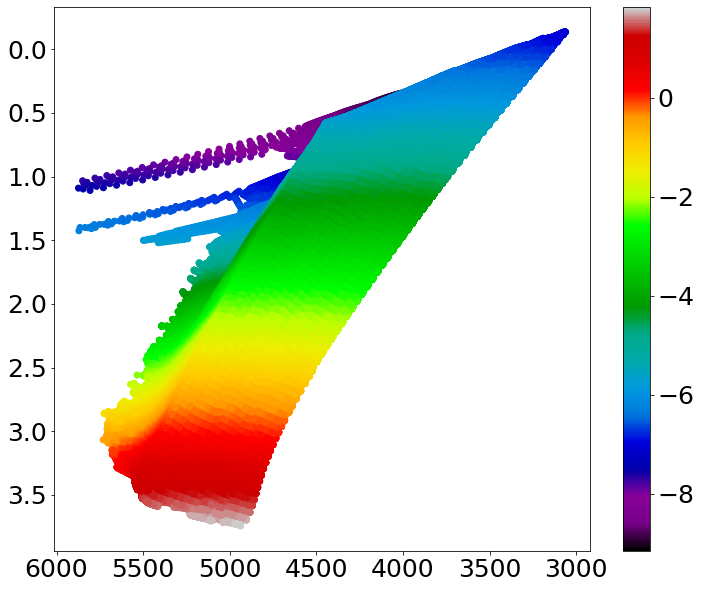

In [236]:
test = np.where(10**massive['logTe']<max(gcsdr17['TEFF']))
plt.figure(figsize=[12,10])
plt.scatter(10**massive['logTe'][test],massive['logg'][test],c=massive['Ksmag'][test],cmap='nipy_spectral')
plt.colorbar()
plt.gca().invert_yaxis()
plt.gca().invert_xaxis()
plt.show()

In [232]:
max(gcsdr17['TEFF'])

5881.8555

In [234]:
np.where(10**massive['logTe']>max(gcsdr17['TEFF']))

(array([  43,   44,   45,   46,   47,   48,   49,   63,   74,   77,   78,
          79,   80,   81,  193,  194,  208,  209,  243,  249,  250,  254,
         255,  322,  323,  324,  325,  326,  327,  328,  330,  366,  367,
         368,  369,  370,  371,  378,  450,  451,  452,  490,  491,  509,
         588,  589,  590,  591,  592,  593,  596,  617,  618,  619,  620,
         635,  636,  637,  638,  643,  660,  661,  662,  663,  679,  680,
         681,  732,  733,  734,  735,  792,  793,  794,  795,  840,  841,
         842,  844,  845,  846,  847,  853,  854,  855,  856,  859,  860,
         881,  882,  883,  884,  885,  890,  913,  914,  915,  916,  917,
         918,  919,  920,  935,  936,  937,  938,  940,  941,  942,  946,
         947,  948,  949,  950,  951,  952,  953,  959,  964,  965,  972,
         983,  984,  985,  999, 1000, 1001, 1002, 1007, 1008, 1009, 1010,
        1011, 1012, 1013, 1014, 1015, 1016, 1017, 1025, 1027, 1028, 1034,
        1035, 1036, 1037, 1038, 1039, 

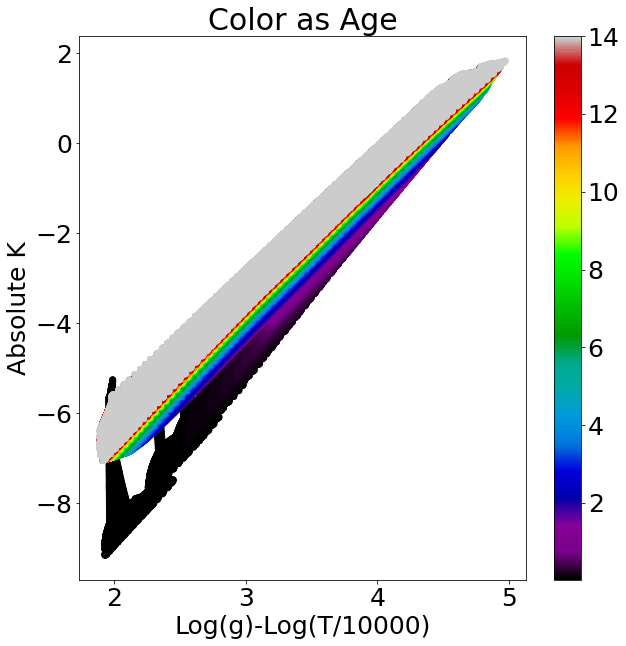

In [290]:
plt.figure(figsize=[10,10])
plt.scatter(massive['logg']-4*np.log10(10**massive['logTe']/10**4),massive['Ksmag'],
            c=10**massive['logAge']/10**9,cmap='nipy_spectral')
plt.colorbar()
plt.title(r'Color as Age')
plt.xlabel(r'Log(g)-Log(T/10000)')
plt.ylabel(r'Absolute K')
plt.show()

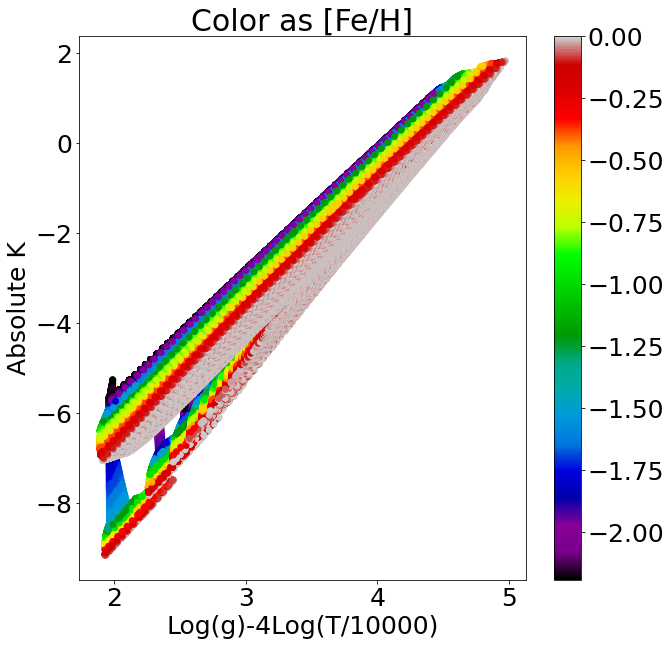

In [306]:
plt.figure(figsize=[10,10])
plt.scatter(massive['logg']-4*np.log10(10**massive['logTe']/10**4),massive['Ksmag'],
            c=massive['MH'],cmap='nipy_spectral')
plt.colorbar()
plt.title(r'Color as [Fe/H]')
plt.xlabel(r'Log(g)-4Log(T/10000)')
plt.ylabel(r'Absolute K')
plt.show()

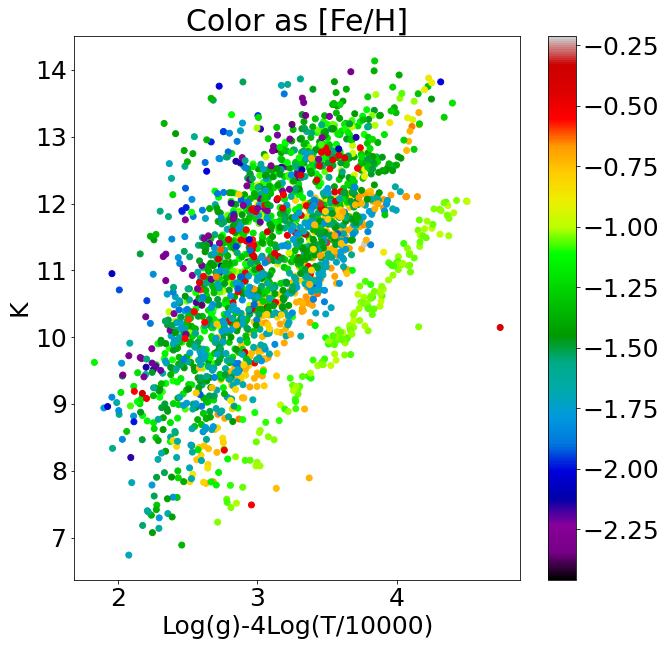

In [305]:
plt.figure(figsize=[10,10])
plt.scatter((gcsdr17['LOGG']-4*np.log10(gcsdr17['TEFF']/10**4)),gcsdr17['K'],
            c=gcsdr17['FE_H'],cmap='nipy_spectral')
plt.colorbar()
plt.title(r'Color as [Fe/H]')
plt.xlabel(r'Log(g)-4Log(T/10000)')
plt.ylabel(r'K')
plt.show()

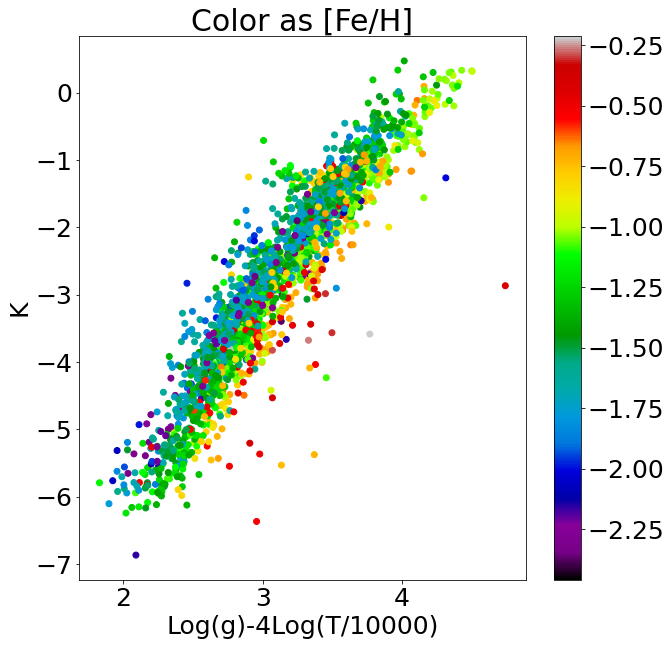

In [303]:
plt.figure(figsize=[10,10])
plt.scatter((gcsdr17['LOGG']-4*np.log10(gcsdr17['TEFF']/10**4)),gcsdr17['K']-5.0*np.log10(gcs_dist)+5.0,
            c=gcsdr17['FE_H'],cmap='nipy_spectral')
plt.colorbar()
plt.title(r'Color as [Fe/H]')
plt.xlabel(r'Log(g)-4Log(T/10000)')
plt.ylabel(r'K')
plt.show()

In [ ]:
# maybe try teff weighted logg and [Fe/H] to get absolute K

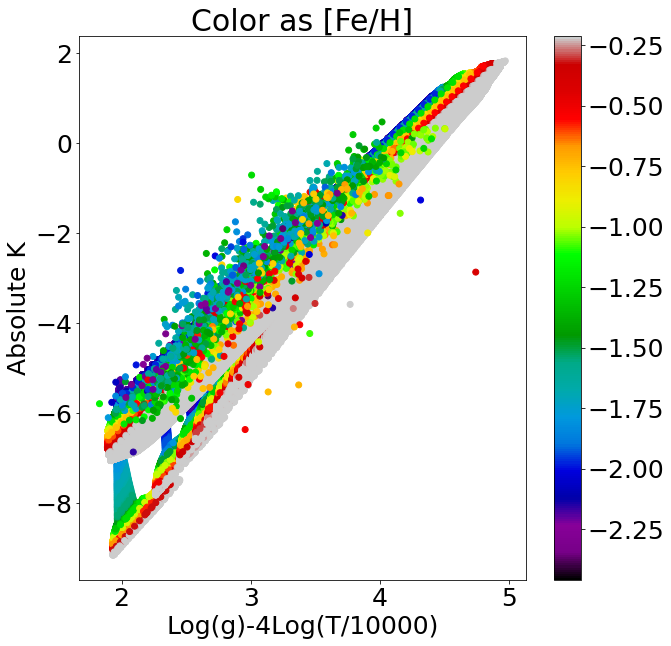

In [304]:
plt.figure(figsize=[10,10])
plt.scatter(massive['logg']-4*np.log10(10**massive['logTe']/10**4),massive['Ksmag'],
            c=massive['MH'],cmap='nipy_spectral',vmax=max(gcsdr17['FE_H']),vmin=min(gcsdr17['FE_H']))
plt.scatter((gcsdr17['LOGG']-4*np.log10(gcsdr17['TEFF']/10**4)),gcsdr17['K']-5.0*np.log10(gcs_dist)+5.0,
            c=gcsdr17['FE_H'],cmap='nipy_spectral')
plt.colorbar()
plt.title(r'Color as [Fe/H]')
plt.xlabel(r'Log(g)-4Log(T/10000)')
plt.ylabel(r'Absolute K')
plt.show()

# Looking at one Bad Star

In [338]:
### Age 12.0 Ak 0.5

### FOUND MISTAKE Reran bad stars

p0=[12.0,0.5]
idx = globbads[2]
cnalpha = np.array([gcsdr17['C_FE'][idx],gcsdr17['N_FE'][idx],gcsdr17['O_FE'][idx],gcsdr17['MG_FE'][idx],
                    gcsdr17['SI_FE'][idx],gcsdr17['S_FE'][idx],gcsdr17['CA_FE'][idx],gcsdr17['TI_FE'][idx]])

CalcAge = AetasStellae(shiftfeh[idx],cnalpha,10000,3.1,massive)

obs_mags = np.array([gcsdr17['GAIAEDR3_PHOT_BP_MEAN_MAG'][idx],gcsdr17['GAIAEDR3_PHOT_RP_MEAN_MAG'][idx],
                     gcsdr17['J'][idx],gcsdr17['H'][idx],gcsdr17['K'][idx]],dtype=float).T.ravel()
obs_mags_err = np.array([bperr[idx],rperr[idx],gcsdr17['J'][idx],gcsdr17['H'][idx],
                         gcsdr17['K'][idx]],dtype=float).T.ravel()

popt,pcov = curve_fit(CalcAge.Teff2AppMags,gcsdr17['TEFF'][idx],obs_mags,p0=p0,bounds=((0.,0.),(14.,2.)),
                      method='trf',sigma=obs_mags_err,absolute_sigma=True)

calc_mags = CalcAge.Teff2AppMags(gcsdr17['TEFF'][idx],popt[0],popt[1]) 

print('-------')
print('Initial Guess',p0)
print('Params [Age, Ak]:',popt)
print('Params Err [Age, Ak]:',[np.sqrt(pcov[0][0]),np.sqrt(pcov[1][1])])
print('Obs [BP,RP,J,H,K]: ',np.round(obs_mags,3))
print('Obs Err [BP,RP,J,H,K]: ',np.round(obs_mags_err,3))
print('Calc [BP,RP,J,H,K]: ',np.round(calc_mags,3))

Input [Age, Ak]:  [12.0, 0.5]
[BP,RP,J,H,K]:  [21.21037132 18.66251771 16.42559059 15.54529219 15.18563579]
Input [Age, Ak]:  [12.000000178813934, 0.5]
[BP,RP,J,H,K]:  [21.21037133 18.66251772 16.4255906  15.5452922  15.18563581]
Input [Age, Ak]:  [12.0, 0.5000000149011612]
[BP,RP,J,H,K]:  [21.21037145 18.66251779 16.42559063 15.54529221 15.18563581]
Input [Age, Ak]:  [5.494556689981596, 0.23277019815746164]
[BP,RP,J,H,K]:  [18.31211442 16.63598869 15.22785609 14.59001209 14.38572087]
Input [Age, Ak]:  [5.49455677185687, 0.23277019815746164]
[BP,RP,J,H,K]:  [18.31211443 16.63598869 15.2278561  14.59001209 14.38572088]
Input [Age, Ak]:  [5.494556689981596, 0.23277021305862283]
[BP,RP,J,H,K]:  [18.31211455 16.63598877 15.22785613 14.59001211 14.38572088]
Input [Age, Ak]:  [2.422484477076869, 0.10281916217160267]
[BP,RP,J,H,K]:  [16.60044629 15.34904489 14.34318321 13.82313364 13.69431593]
Input [Age, Ak]:  [2.422484513174701, 0.10281916217160267]
[BP,RP,J,H,K]:  [16.6004463  15.3490449  

In [410]:
### Rerun For Globbads

### Run All Stars
guess_ages = np.arange(0,14)
guess_aks = np.array([0,0.5,1.0])

bads_ages = 999999.0*np.ones(len(globbads))#np.ones((len(gcs),len(guess_ages),len(guess_aks)))
bads_aks = 999999.0*np.ones(len(globbads))#np.ones((len(gcs),len(guess_ages),len(guess_aks)))
bads_ages_err = 999999.0*np.ones(len(globbads))#np.ones((len(gcs),len(guess_ages),len(guess_aks)))
bads_aks_err = 999999.0*np.ones(len(globbads))#np.ones((len(gcs),len(guess_ages),len(guess_aks)))
bads_chis = 999999.0*np.ones(len(globbads))#np.ones((len(gcs),len(guess_ages),len(guess_aks)))


for i,ind in tqdm_notebook(enumerate(globbads)):
    print(i)
    print(gcsdr17['APOGEE_ID'][ind])
    curve_ages = []
    curve_aks = []
    curve_ages_err = []
    curve_aks_err = []
    curve_chi = []
    
    cnalpha = np.array([gcsdr17['C_FE'][ind],gcsdr17['N_FE'][ind],gcsdr17['O_FE'][ind],gcsdr17['MG_FE'][ind],
                        gcsdr17['SI_FE'][ind],gcsdr17['S_FE'][ind],gcsdr17['CA_FE'][ind],gcsdr17['TI_FE'][ind]])
    
    CalcAge = AetasStellae(shiftfeh[ind],cnalpha,gcs_dist[ind],3.1,massive)
    for j in range(len(guess_ages)):
        for k in range(len(guess_aks)):
            
            obs_mags = np.array([gcsdr17['GAIAEDR3_PHOT_BP_MEAN_MAG'][ind],
                                     gcsdr17['GAIAEDR3_PHOT_RP_MEAN_MAG'][ind],
                                     gcsdr17['J'][ind],gcsdr17['H'][ind],
                                     gcsdr17['K'][ind]],dtype=float).T.ravel()
                
            obs_sigs = np.array([bperr[ind],rperr[ind],gcsdr17['J'][ind],gcsdr17['H'][ind],gcsdr17['K'][ind]],
                                    dtype=float).T.ravel()
            
            try:
                
                popt,pcov = curve_fit(CalcAge.Teff2AppMags,gcsdr17['TEFF'][ind],
                                   obs_mags,p0=[guess_ages[j],guess_aks[k]],bounds=((0.,0.),(14.,2.)),
                                   method='trf',sigma=obs_sigs,absolute_sigma=True,maxfev=5000)
            
                curve_ages.append(popt[0])
                curve_aks.append(popt[1])
                curve_ages_err.append(np.sqrt(pcov[0][0]))
                curve_aks_err.append(np.sqrt(pcov[1][1]))
                curve_mags = np.asarray(CalcAge.Teff2AppMags(gcsdr17['TEFF'][ind],popt[0],popt[1]))
                curve_chi.append(sum((curve_mags-obs_mags)**2/obs_sigs**2))
            
            except:
                curve_mags = 999999.0*np.ones(5)
                curve_ages.append(999999.0)
                curve_aks.append(999999.0)
                curve_ages_err.append(999999.0)
                curve_aks_err.append(999999.0)
                curve_chi.append(999999.0)
                
    bads_idx = np.asarray(curve_chi).argmin()
    bads_chis[i] = np.min(curve_chi)
    bads_ages[i] = np.asarray(curve_ages)[bads_idx]
    bads_aks[i] = np.asarray(curve_aks)[bads_idx]
    bads_ages_err[i] = np.asarray(curve_ages_err)[bads_idx]
    bads_aks_err[i] = np.asarray(curve_aks_err)[bads_idx]
    
    print('-------')
    print('Initial Guess',[guess_ages[j],guess_aks[k]])
    print('Params [Age, Ak]:',popt)
    print('Params Err [Age, Ak]:',[np.sqrt(pcov[0][0]),np.sqrt(pcov[1][1])])
    print('Obs [BP,RP,J,H,K]: ',np.round(obs_mags,3))
    print('Obs Err [BP,RP,J,H,K]: ',np.round(obs_mags_err,3))
    print('Calc [BP,RP,J,H,K]: ',np.round(curve_mags,3))

<ipython-input-410-cf4cbb9c3aeb>:14: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for i,ind in tqdm_notebook(enumerate(globbads)):


0
2M18362856-2355408
Input [Age, Ak]:  [1e-10, 1e-10]
[age_lo,age_hi]:  [0.02499999950079735, 0.0499999995007974]
lgteff, min, max:  [3.7196453, 3.6515, 3.6648]
[BP,RP,J,H,K]:  [999999. 999999. 999999. 999999. 999999.]
Input [Age, Ak]:  [1.5001161193847657e-08, 1e-10]
[age_lo,age_hi]:  [0.02499999950079735, 0.0499999995007974]
lgteff, min, max:  [3.7196453, 3.6515, 3.6648]
[BP,RP,J,H,K]:  [999999. 999999. 999999. 999999. 999999.]
Input [Age, Ak]:  [1e-10, 1.5001161193847657e-08]
[age_lo,age_hi]:  [0.02499999950079735, 0.0499999995007974]
lgteff, min, max:  [3.7196453, 3.6515, 3.6648]
[BP,RP,J,H,K]:  [999999. 999999. 999999. 999999. 999999.]
Input [Age, Ak]:  [1e-10, 1e-10]
[age_lo,age_hi]:  [0.02499999950079735, 0.0499999995007974]
lgteff, min, max:  [3.7196453, 3.6515, 3.6648]
[BP,RP,J,H,K]:  [999999. 999999. 999999. 999999. 999999.]
Input [Age, Ak]:  [1e-10, 0.5]
[age_lo,age_hi]:  [0.02499999950079735, 0.0499999995007974]
lgteff, min, max:  [3.7196453, 3.6515, 3.6648]
[BP,RP,J,H,K]: 

[BP,RP,J,H,K]:  [15.41720049 13.78262579 12.41222855 11.78591179 11.58891562]
No Ext [BP,RP,J,H,K]:  [13.46671183 12.54983536 11.86367628 11.43844077 11.36863095]
Input [Age, Ak]:  [3.3999074335233015, 0.22028468369340617]
[age_lo,age_hi]:  [3.400008478258595, 3.424995458816092]
lgteff, min, max:  [3.7196453, 3.6215, 3.7448]
[BP,RP,J,H,K]:  [15.41720062 13.78262588 12.41222858 11.78591181 11.58891563]
No Ext [BP,RP,J,H,K]:  [13.46671182 12.54983536 11.86367627 11.43844076 11.36863094]
Input [Age, Ak]:  [3.3997827246405294, 0.2202855840583729]
[age_lo,age_hi]:  [3.400008478258595, 3.3749706469138547]
lgteff, min, max:  [3.7196453, 3.6215, 3.7448]
[BP,RP,J,H,K]:  [15.41713918 13.78255636 12.41215403 11.7858311  11.58883444]
No Ext [BP,RP,J,H,K]:  [13.46664242 12.5497608  11.86359948 11.43835864 11.36854885]
Input [Age, Ak]:  [3.3998762563051903, 0.22028489779284138]
[age_lo,age_hi]:  [3.400008478258595, 3.3749706469138547]
lgteff, min, max:  [3.7196453, 3.6215, 3.7448]
[BP,RP,J,H,K]:  [1

[BP,RP,J,H,K]:  [15.41720042 13.78262587 12.41222808 11.7859115  11.58891521]
No Ext [BP,RP,J,H,K]:  [13.46671071 12.54983477 11.86367551 11.43844029 11.36863043]
Input [Age, Ak]:  [1.0, 0.5]
lgteff, min, max:  [3.7196453, 3.7002, 3.74]
[BP,RP,J,H,K]:  [16.99457569 14.44984695 12.20932462 11.32444001 10.96769209]
No Ext [BP,RP,J,H,K]:  [12.56737549 11.6516712  10.964226   10.53575365 10.46769209]
Input [Age, Ak]:  [1.0000000149011612, 0.5]
[age_lo,age_hi]:  [1.0, 1.0249908771372844]
lgteff, min, max:  [3.7196453, 3.7002, 3.74]
[BP,RP,J,H,K]:  [16.99457571 14.44984696 12.20932463 11.32444002 10.9676921 ]
No Ext [BP,RP,J,H,K]:  [12.5673755  11.65167121 10.96422601 10.53575366 10.4676921 ]
Input [Age, Ak]:  [1.0, 0.5000000149011612]
lgteff, min, max:  [3.7196453, 3.7002, 3.74]
[BP,RP,J,H,K]:  [16.99457583 14.44984703 12.20932466 11.32444003 10.96769211]
No Ext [BP,RP,J,H,K]:  [12.56737549 11.6516712  10.964226   10.53575365 10.46769209]
Input [Age, Ak]:  [0.8386432792675409, 0.39265521008

[age_lo,age_hi]:  [3.575032547326308, 3.5500134624448356]
lgteff, min, max:  [3.7196453, 3.6207, 3.745]
[BP,RP,J,H,K]:  [15.42276716 13.79605304 12.43479112 11.8096593  11.61510924]
No Ext [BP,RP,J,H,K]:  [13.49560804 12.57800785 11.89280001 11.46634433 11.39745937]
Input [Age, Ak]:  [3.726946832025677, 0.21144826336454584]
[age_lo,age_hi]:  [3.725031932066737, 3.749989053574928]
lgteff, min, max:  [3.7196453, 3.6201, 3.7446]
[BP,RP,J,H,K]:  [15.39675815 13.79008924 12.44728997 11.82886828 11.6368997 ]
No Ext [BP,RP,J,H,K]:  [13.52451056 12.60675043 11.92074209 11.49533556 11.42545144]
Input [Age, Ak]:  [3.7269468875615126, 0.21144826336454584]
[age_lo,age_hi]:  [3.725031932066737, 3.749989053574928]
lgteff, min, max:  [3.7196453, 3.6201, 3.7446]
[BP,RP,J,H,K]:  [15.39675816 13.79008925 12.44728998 11.82886829 11.63689972]
No Ext [BP,RP,J,H,K]:  [13.52451057 12.60675045 11.9207421  11.49533557 11.42545145]
Input [Age, Ak]:  [3.726946832025677, 0.21144827826570703]
[age_lo,age_hi]:  [3.

[BP,RP,J,H,K]:  [15.32095405 13.88978657 12.71450565 12.14583184 11.98483154]
No Ext [BP,RP,J,H,K]:  [13.92570783 13.00793259 12.32210887 11.89727483 11.82725495]
Input [Age, Ak]:  [6.8805286537550145, 0.15787411588208666]
[age_lo,age_hi]:  [6.8749572187852275, 6.900014446233541]
lgteff, min, max:  [3.7196453, 3.6114, 3.7399]
[BP,RP,J,H,K]:  [15.32586716 13.89401011 12.71802422 12.14933425 11.98814985]
No Ext [BP,RP,J,H,K]:  [13.92798652 13.01049107 12.32488654 11.90030793 11.83027573]
Input [Age, Ak]:  [6.875959721487668, 0.15794837330298286]
[age_lo,age_hi]:  [6.8749572187852275, 6.900014446233541]
lgteff, min, max:  [3.7196453, 3.6114, 3.7399]
[BP,RP,J,H,K]:  [15.32709606 13.89506724 12.71890566 12.15021195 11.98898159]
No Ext [BP,RP,J,H,K]:  [13.92855792 13.01113262 12.32558305 11.90106849 11.83103321]
Input [Age, Ak]:  [6.8759598239474515, 0.15794837330298286]
[age_lo,age_hi]:  [6.8749572187852275, 6.900014446233541]
lgteff, min, max:  [3.7196453, 3.6114, 3.7399]
[BP,RP,J,H,K]:  [

[BP,RP,J,H,K]:  [15.32736988 13.89530123 12.71909908 12.15040385 11.98916306]
No Ext [BP,RP,J,H,K]:  [13.92868206 13.011272   12.32573438 11.90123373 11.83119778]
Input [Age, Ak]:  [6.874958184707627, 0.15796532032954066]
[age_lo,age_hi]:  [6.8749572187852275, 6.900014446233541]
lgteff, min, max:  [3.7196453, 3.6114, 3.7399]
[BP,RP,J,H,K]:  [15.32737137 13.89530271 12.71910054 12.1504054  11.98916458]
No Ext [BP,RP,J,H,K]:  [13.92868317 13.01127325 12.32573573 11.90123521 11.83119926]
Input [Age, Ak]:  [6.874958287152487, 0.15796532032954066]
[age_lo,age_hi]:  [6.8749572187852275, 6.900014446233541]
lgteff, min, max:  [3.7196453, 3.6114, 3.7399]
[BP,RP,J,H,K]:  [15.32737135 13.8953027  12.71910052 12.15040538 11.98916456]
No Ext [BP,RP,J,H,K]:  [13.92868316 13.01127324 12.32573572 11.9012352  11.83119924]
Input [Age, Ak]:  [6.874958184707627, 0.15796533523070186]
[age_lo,age_hi]:  [6.8749572187852275, 6.900014446233541]
lgteff, min, max:  [3.7196453, 3.6114, 3.7399]
[BP,RP,J,H,K]:  [15

[BP,RP,J,H,K]:  [15.30604289 13.46928092 11.90366291 11.21845301 10.98620565]
No Ext [BP,RP,J,H,K]:  [12.80316986 11.88736046 11.19975895 10.77257713 10.70353569]
Input [Age, Ak]:  [1.3591955659202835, 0.2826699621448296]
[age_lo,age_hi]:  [1.3499882857222538, 1.374991457485029]
lgteff, min, max:  [3.7196453, 3.6773, 3.7448]
[BP,RP,J,H,K]:  [15.3060429  13.46928093 11.90366292 11.21845303 10.98620567]
No Ext [BP,RP,J,H,K]:  [12.80316987 11.88736047 11.19975897 10.77257714 10.7035357 ]
Input [Age, Ak]:  [1.3591955456666915, 0.2826699770459908]
[age_lo,age_hi]:  [1.3499882857222538, 1.374991457485029]
lgteff, min, max:  [3.7196453, 3.6773, 3.7448]
[BP,RP,J,H,K]:  [15.30604302 13.46928101 11.90366295 11.21845304 10.98620567]
No Ext [BP,RP,J,H,K]:  [12.80316986 11.88736046 11.19975895 10.77257713 10.70353569]
Input [Age, Ak]:  [1.9758427846684252, 0.2569157754394859]
[age_lo,age_hi]:  [1.975013188270782, 2.000000019968108]
lgteff, min, max:  [3.7196453, 3.6352, 3.7449]
[BP,RP,J,H,K]:  [15.

[BP,RP,J,H,K]:  [15.32901053 13.87931951 12.68651199 12.11179623 11.94749937]
No Ext [BP,RP,J,H,K]:  [13.88263724 12.96515109 12.27973631 11.85413116 11.78414858]
Input [Age, Ak]:  [6.619625822839808, 0.16181576617887736]
[age_lo,age_hi]:  [6.624910263608491, 6.599940191598727]
lgteff, min, max:  [3.7196453, 3.6119, 3.7413]
[BP,RP,J,H,K]:  [15.33246599 13.88713511 12.69978476 12.12643447 11.96303789]
No Ext [BP,RP,J,H,K]:  [13.8996844  12.98155721 12.29683159 11.8711907  11.80122212]
Input [Age, Ak]:  [6.619625921479919, 0.16181576617887736]
[age_lo,age_hi]:  [6.624910263608491, 6.599940191598727]
lgteff, min, max:  [3.7196453, 3.6119, 3.7413]
[BP,RP,J,H,K]:  [15.332466   13.88713512 12.69978477 12.12643448 11.9630379 ]
No Ext [BP,RP,J,H,K]:  [13.89968441 12.98155721 12.2968316  11.87119071 11.80122213]
Input [Age, Ak]:  [6.619625822839808, 0.16181578108003855]
[age_lo,age_hi]:  [6.624910263608491, 6.599940191598727]
lgteff, min, max:  [3.7196453, 3.6119, 3.7413]
[BP,RP,J,H,K]:  [15.33

[BP,RP,J,H,K]:  [15.33335409 13.88779562 12.69871097 12.12509344 11.96151471]
No Ext [BP,RP,J,H,K]:  [13.89776612 12.98044396 12.29496853 11.86934972 11.79938199]
Input [Age, Ak]:  [6.599864373965607, 0.16213271345074667]
[age_lo,age_hi]:  [6.599940191598727, 6.624910263608491]
lgteff, min, max:  [3.7196453, 3.612, 3.7413]
[BP,RP,J,H,K]:  [15.3333541  13.88779562 12.69871097 12.12509345 11.96151471]
No Ext [BP,RP,J,H,K]:  [13.89776613 12.98044397 12.29496854 11.86934973 11.799382  ]
Input [Age, Ak]:  [6.599864275619965, 0.16213272835190787]
[age_lo,age_hi]:  [6.599940191598727, 6.624910263608491]
lgteff, min, max:  [3.7196453, 3.612, 3.7413]
[BP,RP,J,H,K]:  [15.33335422 13.8877957  12.698711   12.12509347 11.96151472]
No Ext [BP,RP,J,H,K]:  [13.89776612 12.98044396 12.29496853 11.86934972 11.79938199]
Input [Age, Ak]:  [6.59986323040449, 0.16213272459542413]
[age_lo,age_hi]:  [6.599940191598727, 6.574912840044064]
lgteff, min, max:  [3.7196453, 3.612, 3.7413]
[BP,RP,J,H,K]:  [15.333352

[BP,RP,J,H,K]:  [15.37414111 13.85068872 12.58783357 11.99227246 11.81554315]
No Ext [BP,RP,J,H,K]:  [13.72817246 12.81036768 12.12492401 11.69905034 11.62965043]
Input [Age, Ak]:  [6.087320007037686, 0.17490690347753005]
[age_lo,age_hi]:  [6.075052004584989, 6.100002317401106]
lgteff, min, max:  [3.7196453, 3.6132, 3.7415]
[BP,RP,J,H,K]:  [15.39089671 13.90306897 12.67464887 12.08961415 11.91876895]
No Ext [BP,RP,J,H,K]:  [13.84220095 12.92422846 12.23909618 11.81372077 11.74386205]
Input [Age, Ak]:  [6.087320097745823, 0.17490690347753005]
[age_lo,age_hi]:  [6.075052004584989, 6.100002317401106]
lgteff, min, max:  [3.7196453, 3.6132, 3.7415]
[BP,RP,J,H,K]:  [15.39089671 13.90306898 12.67464887 12.08961415 11.91876896]
No Ext [BP,RP,J,H,K]:  [13.84220096 12.92422847 12.23909619 11.81372078 11.74386206]
Input [Age, Ak]:  [6.087320007037686, 0.17490691837869124]
[age_lo,age_hi]:  [6.075052004584989, 6.100002317401106]
lgteff, min, max:  [3.7196453, 3.6132, 3.7415]
[BP,RP,J,H,K]:  [15.39

[BP,RP,J,H,K]:  [15.60534052 13.68109851 12.0324609  11.32266634 11.07537565]
No Ext [BP,RP,J,H,K]:  [12.86585132 11.94962672 11.26201139 10.83463832 10.76598268]
Input [Age, Ak]:  [2.7161474011262374, 0.21200540146138708]
[age_lo,age_hi]:  [2.7250219195020393, 2.699976598401209]
lgteff, min, max:  [3.7196453, 3.6259, 3.7488]
[BP,RP,J,H,K]:  [15.17852243 13.5705687  12.22571513 11.60603035 11.41407143]
No Ext [BP,RP,J,H,K]:  [13.30134172 12.38411195 11.69777986 11.27161881 11.20206603]
Input [Age, Ak]:  [1.7810449984241983, 0.2795107388203476]
[age_lo,age_hi]:  [1.7750067135006546, 1.7999896172455905]
lgteff, min, max:  [3.7196453, 3.6398, 3.7457]
[BP,RP,J,H,K]:  [15.47876045 13.65163091 12.09592932 11.41399353 11.18388691]
No Ext [BP,RP,J,H,K]:  [13.00386045 12.08739057 11.39989245 10.97310091 10.90437617]
Input [Age, Ak]:  [1.781045024963837, 0.2795107388203476]
[age_lo,age_hi]:  [1.7750067135006546, 1.7999896172455905]
lgteff, min, max:  [3.7196453, 3.6398, 3.7457]
[BP,RP,J,H,K]:  [

[age_lo,age_hi]:  [5.600025440780003, 5.624967273092622]
lgteff, min, max:  [3.7196453, 3.6144, 3.7417]
[BP,RP,J,H,K]:  [15.35734885 13.86184857 12.62619145 12.03899075 11.86677515]
No Ext [BP,RP,J,H,K]:  [13.7879509  12.86992341 12.18481652 11.75940937 11.68953018]
Input [Age, Ak]:  [5.609088804152377, 0.17724497106083054]
[age_lo,age_hi]:  [5.600025440780003, 5.624967273092622]
lgteff, min, max:  [3.7196453, 3.6144, 3.7417]
[BP,RP,J,H,K]:  [15.35734885 13.86184857 12.62619146 12.03899076 11.86677516]
No Ext [BP,RP,J,H,K]:  [13.78795091 12.86992341 12.18481652 11.75940938 11.68953019]
Input [Age, Ak]:  [5.609088720570442, 0.17724498596199173]
[age_lo,age_hi]:  [5.600025440780003, 5.624967273092622]
lgteff, min, max:  [3.7196453, 3.6144, 3.7417]
[BP,RP,J,H,K]:  [15.35734898 13.86184865 12.62619149 12.03899077 11.86677517]
No Ext [BP,RP,J,H,K]:  [13.7879509  12.86992341 12.18481652 11.75940937 11.68953018]
Input [Age, Ak]:  [6.027396647682076, 0.17256550080885066]
[age_lo,age_hi]:  [6.0

lgteff, min, max:  [3.7196453, 3.6114, 3.7399]
[BP,RP,J,H,K]:  [15.32735573 13.89529062 12.71909412 12.15039784 11.98915781]
No Ext [BP,RP,J,H,K]:  [13.92867746 13.01126744 12.32573211 11.90122943 11.83119361]
Input [Age, Ak]:  [6.8749087325065785, 0.15796419895149477]
[age_lo,age_hi]:  [6.8749572187852275, 6.849990986022837]
lgteff, min, max:  [3.7196453, 3.6114, 3.7399]
[BP,RP,J,H,K]:  [15.32735574 13.89529063 12.71909413 12.15039786 11.98915782]
No Ext [BP,RP,J,H,K]:  [13.92867748 13.01126745 12.32573212 11.90122944 11.83119362]
Input [Age, Ak]:  [6.874908630062457, 0.15796421385265597]
[age_lo,age_hi]:  [6.8749572187852275, 6.849990986022837]
lgteff, min, max:  [3.7196453, 3.6114, 3.7399]
[BP,RP,J,H,K]:  [15.32735586 13.89529071 12.71909416 12.15039787 11.98915782]
No Ext [BP,RP,J,H,K]:  [13.92867746 13.01126744 12.32573211 11.90122943 11.83119361]
Input [Age, Ak]:  [6.875580140036861, 0.15795505149087716]
[age_lo,age_hi]:  [6.8749572187852275, 6.900014446233541]
lgteff, min, max: 

[BP,RP,J,H,K]:  [15.32736992 13.89530185 12.71910024 12.15040526 11.98916454]
No Ext [BP,RP,J,H,K]:  [13.92868327 13.01127337 12.32573587 11.90123535 11.8311994 ]
Input [Age, Ak]:  [6.8749571811596395, 0.1579651451769942]
[age_lo,age_hi]:  [6.8749572187852275, 6.849990986022837]
lgteff, min, max:  [3.7196453, 3.6114, 3.7399]
[BP,RP,J,H,K]:  [15.32736993 13.89530186 12.71910025 12.15040528 11.98916456]
No Ext [BP,RP,J,H,K]:  [13.92868329 13.01127338 12.32573588 11.90123537 11.83119941]
Input [Age, Ak]:  [6.8749572214339505, 0.15796514517859145]
[age_lo,age_hi]:  [6.8749572187852275, 6.900014446233541]
lgteff, min, max:  [3.7196453, 3.6114, 3.7399]
[BP,RP,J,H,K]:  [15.32736994 13.89530187 12.71910025 12.15040528 11.98916456]
No Ext [BP,RP,J,H,K]:  [13.92868329 13.01127339 12.32573588 11.90123537 11.83119942]
Input [Age, Ak]:  [2.0, 1.0]
[age_lo,age_hi]:  [2.000000019968108, 2.0249765580000676]
lgteff, min, max:  [3.7196453, 3.6347, 3.7449]
[BP,RP,J,H,K]:  [21.93657014 17.7622288  13.9695

[BP,RP,J,H,K]:  [15.54655533 13.7818278  12.2871124  11.62299834 11.40381971]
No Ext [BP,RP,J,H,K]:  [13.24165045 12.32503149 11.63888469 11.21238962 11.14350791]
Input [Age, Ak]:  [3.1384522664709653, 0.22114907941379103]
[age_lo,age_hi]:  [3.149995983287373, 3.124999843999184]
lgteff, min, max:  [3.7196453, 3.6227, 3.7413]
[BP,RP,J,H,K]:  [15.36905631 13.73171711 12.35869105 11.73079517 11.53383233]
No Ext [BP,RP,J,H,K]:  [13.41091381 12.49408912 11.80798622 11.38196065 11.31268325]
Input [Age, Ak]:  [3.1384523132375484, 0.22114907941379103]
[age_lo,age_hi]:  [3.149995983287373, 3.124999843999184]
lgteff, min, max:  [3.7196453, 3.6227, 3.7413]
[BP,RP,J,H,K]:  [15.36905632 13.73171712 12.35869106 11.73079519 11.53383234]
No Ext [BP,RP,J,H,K]:  [13.41091383 12.49408914 11.80798623 11.38196067 11.31268326]
Input [Age, Ak]:  [3.1384522664709653, 0.22114909431495222]
[age_lo,age_hi]:  [3.149995983287373, 3.124999843999184]
lgteff, min, max:  [3.7196453, 3.6227, 3.7413]
[BP,RP,J,H,K]:  [15

[BP,RP,J,H,K]:  [15.33031019 13.88126867 12.68908373 12.11454636 11.95036462]
No Ext [BP,RP,J,H,K]:  [13.88570154 12.96821557 12.28280434 11.85719565 11.78721313]
Input [Age, Ak]:  [6.498802084638543, 0.16315150762883196]
[age_lo,age_hi]:  [6.49994976198144, 6.475003388076283]
lgteff, min, max:  [3.7196453, 3.6122, 3.7384]
[BP,RP,J,H,K]:  [15.33031031 13.88126874 12.68908376 12.11454637 11.95036462]
No Ext [BP,RP,J,H,K]:  [13.88570153 12.96821556 12.28280432 11.85719563 11.78721311]
Input [Age, Ak]:  [6.897651370447474, 0.15729634764669403]
[age_lo,age_hi]:  [6.900014446233541, 6.8749572187852275]
lgteff, min, max:  [3.7196453, 3.614, 3.7399]
[BP,RP,J,H,K]:  [15.31860999 13.88837241 12.71397518 12.14557256 11.98473333]
No Ext [BP,RP,J,H,K]:  [13.92584514 13.00808676 12.32227625 11.89745759 11.82743698]
Input [Age, Ak]:  [6.897651473230489, 0.15729634764669403]
[age_lo,age_hi]:  [6.900014446233541, 6.8749572187852275]
lgteff, min, max:  [3.7196453, 3.614, 3.7399]
[BP,RP,J,H,K]:  [15.318

[BP,RP,J,H,K]:  [15.32737375 13.89530427 12.71910132 12.15040596 11.98916499]
No Ext [BP,RP,J,H,K]:  [13.92868328 13.01127338 12.32573588 11.90123537 11.83119941]
Input [Age, Ak]:  [6.874957071087088, 0.1579655911629754]
[age_lo,age_hi]:  [6.8749572187852275, 6.849990986022837]
lgteff, min, max:  [3.7196453, 3.6114, 3.7399]
[BP,RP,J,H,K]:  [15.32737387 13.89530434 12.71910135 12.15040597 11.98916499]
No Ext [BP,RP,J,H,K]:  [13.92868327 13.01127337 12.32573587 11.90123536 11.8311994 ]
Input [Age, Ak]:  [6.874957412268724, 0.15796557413953413]
[age_lo,age_hi]:  [6.8749572187852275, 6.900014446233541]
lgteff, min, max:  [3.7196453, 3.6114, 3.7399]
[BP,RP,J,H,K]:  [15.32737371 13.89530424 12.71910129 12.15040593 11.98916496]
No Ext [BP,RP,J,H,K]:  [13.92868327 13.01127336 12.32573585 11.90123534 11.83119938]
Input [Age, Ak]:  [6.874957156383389, 0.15796557573443087]
[age_lo,age_hi]:  [6.8749572187852275, 6.849990986022837]
lgteff, min, max:  [3.7196453, 3.6114, 3.7399]
[BP,RP,J,H,K]:  [15.

[BP,RP,J,H,K]:  [15.34594749 13.8707066  12.65326851 12.07204838 11.90314265]
No Ext [BP,RP,J,H,K]:  [13.83036293 12.91279375 12.22702797 11.80205362 11.73197527]
Input [Age, Ak]:  [5.946821722739847, 0.1711673846986395]
[age_lo,age_hi]:  [5.950041570821055, 5.925022446812424]
lgteff, min, max:  [3.7196453, 3.6161, 3.7415]
[BP,RP,J,H,K]:  [15.3459475  13.87070661 12.65326852 12.0720484  11.90314266]
No Ext [BP,RP,J,H,K]:  [13.83036294 12.91279376 12.22702798 11.80205363 11.73197528]
Input [Age, Ak]:  [5.9468216341253, 0.1711673995998007]
[age_lo,age_hi]:  [5.950041570821055, 5.925022446812424]
lgteff, min, max:  [3.7196453, 3.6161, 3.7415]
[BP,RP,J,H,K]:  [15.34594762 13.87070668 12.65326855 12.07204841 11.90314267]
No Ext [BP,RP,J,H,K]:  [13.83036293 12.91279375 12.22702797 11.80205362 11.73197527]
Input [Age, Ak]:  [6.002999886564846, 0.1703025879658615]
[age_lo,age_hi]:  [5.999982725336439, 6.025040908412267]
lgteff, min, max:  [3.7196453, 3.6134, 3.7385]
[BP,RP,J,H,K]:  [15.3392571

[BP,RP,J,H,K]:  [15.34656721 13.87122547 12.65371769 12.07250293 11.90353617]
No Ext [BP,RP,J,H,K]:  [13.83078113 12.91318525 12.22742047 11.80247227 11.73234602]
Input [Age, Ak]:  [5.9499900639842505, 0.17119015890913972]
[age_lo,age_hi]:  [5.950041570821055, 5.975028759401808]
lgteff, min, max:  [3.7196453, 3.6161, 3.7415]
[BP,RP,J,H,K]:  [15.34656735 13.87122557 12.65371774 12.07250296 11.90353619]
No Ext [BP,RP,J,H,K]:  [13.83078114 12.91318526 12.22742048 11.80247228 11.73234603]
Input [Age, Ak]:  [5.949978268752823, 0.1711901368967299]
[age_lo,age_hi]:  [5.950041570821055, 5.975028759401808]
lgteff, min, max:  [3.7196453, 3.6161, 3.7415]
[BP,RP,J,H,K]:  [15.34656843 13.8712269  12.65371887 12.07250429 11.90353738]
No Ext [BP,RP,J,H,K]:  [13.83078241 12.91318672 12.22742167 11.80247364 11.73234724]
Input [Age, Ak]:  [5.949978357414409, 0.1711901368967299]
[age_lo,age_hi]:  [5.950041570821055, 5.975028759401808]
lgteff, min, max:  [3.7196453, 3.6161, 3.7415]
[BP,RP,J,H,K]:  [15.346

[BP,RP,J,H,K]:  [17.80443539 15.25866282 13.0193315  12.1365042  11.77891101]
No Ext [BP,RP,J,H,K]:  [13.37723506 12.46048699 11.77423285 11.34781783 11.278911  ]
Input [Age, Ak]:  [2.0742102351450877, 0.3396788768746589]
[age_lo,age_hi]:  [2.0750090729538275, 2.0499817747416977]
lgteff, min, max:  [3.7196453, 3.6334, 3.7448]
[BP,RP,J,H,K]:  [16.1170451  14.09413992 12.35185123 11.61557367 11.35044863]
No Ext [BP,RP,J,H,K]:  [13.10939232 12.19317753 11.50598383 11.07977348 11.01076975]
Input [Age, Ak]:  [2.0742102660532287, 0.3396788768746589]
[age_lo,age_hi]:  [2.0750090729538275, 2.0499817747416977]
lgteff, min, max:  [3.7196453, 3.6334, 3.7448]
[BP,RP,J,H,K]:  [16.11704512 14.09413993 12.35185124 11.61557368 11.35044864]
No Ext [BP,RP,J,H,K]:  [13.10939234 12.19317754 11.50598384 11.07977349 11.01076977]
Input [Age, Ak]:  [2.0742102351450877, 0.3396788917758201]
[age_lo,age_hi]:  [2.0750090729538275, 2.0499817747416977]
lgteff, min, max:  [3.7196453, 3.6334, 3.7448]
[BP,RP,J,H,K]:  

lgteff, min, max:  [3.7196453, 3.6161, 3.7415]
[BP,RP,J,H,K]:  [15.34669408 13.87107653 12.6534591  12.07212528 11.90317299]
No Ext [BP,RP,J,H,K]:  [13.83033155 12.91267197 12.22699975 11.80199193 11.73191775]
Input [Age, Ak]:  [5.9541566013009755, 0.17125524719889176]
[age_lo,age_hi]:  [5.950041570821055, 5.975028759401808]
lgteff, min, max:  [3.7196453, 3.6161, 3.7415]
[BP,RP,J,H,K]:  [15.34669407 13.87107652 12.65345909 12.07212527 11.90317298]
No Ext [BP,RP,J,H,K]:  [13.83033154 12.91267196 12.22699975 11.80199192 11.73191774]
Input [Age, Ak]:  [5.954156512577129, 0.17125526210005296]
[age_lo,age_hi]:  [5.950041570821055, 5.975028759401808]
lgteff, min, max:  [3.7196453, 3.6161, 3.7415]
[BP,RP,J,H,K]:  [15.34669421 13.87107662 12.65345914 12.07212531 11.90317301]
No Ext [BP,RP,J,H,K]:  [13.83033155 12.91267197 12.22699975 11.80199193 11.73191775]
Input [Age, Ak]:  [5.945459259482304, 0.17112786817704972]
[age_lo,age_hi]:  [5.950041570821055, 5.925022446812424]
lgteff, min, max:  [3

[BP,RP,J,H,K]:  [15.34662714 13.87126368 12.65373497 12.07251418 11.90354347]
No Ext [BP,RP,J,H,K]:  [13.83078177 12.91318598 12.22742107 11.80247295 11.73234663]
Input [Age, Ak]:  [5.949984132182238, 0.17119685573701768]
[age_lo,age_hi]:  [5.950041570821055, 5.975028759401808]
lgteff, min, max:  [3.7196453, 3.6161, 3.7415]
[BP,RP,J,H,K]:  [15.34662728 13.87126377 12.65373501 12.07251421 11.9035435 ]
No Ext [BP,RP,J,H,K]:  [13.83078178 12.91318599 12.22742108 11.80247296 11.73234664]
Input [Age, Ak]:  [5.949967135498761, 0.17119662539689343]
[age_lo,age_hi]:  [5.950041570821055, 5.925022446812424]
lgteff, min, max:  [3.7196453, 3.6161, 3.7415]
[BP,RP,J,H,K]:  [15.34660951 13.8712465  12.65371969 12.07249768 11.90352891]
No Ext [BP,RP,J,H,K]:  [13.83076604 12.91317001 12.22740632 11.8024568  11.73233229]
Input [Age, Ak]:  [5.949979882890803, 0.17119678725049864]
[age_lo,age_hi]:  [5.950041570821055, 5.975028759401808]
lgteff, min, max:  [3.7196453, 3.6161, 3.7415]
[BP,RP,J,H,K]:  [15.34

[BP,RP,J,H,K]:  [16.34654824 14.10979504 12.16282018 11.36513668 11.06222949]
No Ext [BP,RP,J,H,K]:  [12.75639298 11.84066671 11.15313072 10.72556622 10.65676383]
Input [Age, Ak]:  [1.2633622363538133, 0.4054656697301171]
[age_lo,age_hi]:  [1.274999457553168, 1.249999962559808]
lgteff, min, max:  [3.7196453, 3.6897, 3.7454]
[BP,RP,J,H,K]:  [16.34654835 14.1097951  12.16282019 11.36513668 11.06222948]
No Ext [BP,RP,J,H,K]:  [12.75639296 11.84066669 11.1531307  10.7255662  10.65676381]
Input [Age, Ak]:  [1.1756338248798346, 0.3426285527851942]
[age_lo,age_hi]:  [1.1750057719868607, 1.1999965570481184]
lgteff, min, max:  [3.7196453, 3.6963, 3.7426]
[BP,RP,J,H,K]:  [15.72616845 13.6936204  11.94217298 11.20127878 10.93542182]
No Ext [BP,RP,J,H,K]:  [12.69239805 11.77615059 11.08896031 10.66082585 10.59279327]
Input [Age, Ak]:  [1.1756338423981436, 0.3426285527851942]
[age_lo,age_hi]:  [1.1750057719868607, 1.1999965570481184]
lgteff, min, max:  [3.7196453, 3.6963, 3.7426]
[BP,RP,J,H,K]:  [1

[BP,RP,J,H,K]:  [15.32756464 13.8950544  12.71880661 12.14963724 11.98834431]
No Ext [BP,RP,J,H,K]:  [13.92773061 13.01030073 12.32511955 11.90026293 11.83024958]
Input [Age, Ak]:  [6.867012152394803, 0.15809472921248152]
[age_lo,age_hi]:  [6.8749572187852275, 6.849990986022837]
lgteff, min, max:  [3.7196453, 3.6114, 3.7399]
[BP,RP,J,H,K]:  [15.32756466 13.89505441 12.71880662 12.14963725 11.98834432]
No Ext [BP,RP,J,H,K]:  [13.92773062 13.01030074 12.32511956 11.90026294 11.83024959]
Input [Age, Ak]:  [6.86701205006835, 0.15809474411364272]
[age_lo,age_hi]:  [6.8749572187852275, 6.849990986022837]
lgteff, min, max:  [3.7196453, 3.6114, 3.7399]
[BP,RP,J,H,K]:  [15.32756478 13.89505449 12.71880665 12.14963726 11.98834432]
No Ext [BP,RP,J,H,K]:  [13.92773061 13.01030073 12.32511955 11.90026293 11.83024958]
Input [Age, Ak]:  [6.880513067548623, 0.15787448704703655]
[age_lo,age_hi]:  [6.8749572187852275, 6.900014446233541]
lgteff, min, max:  [3.7196453, 3.6114, 3.7399]
[BP,RP,J,H,K]:  [15.

[BP,RP,J,H,K]:  [15.32737258 13.89530296 12.71910045 12.1504045  11.98916355]
No Ext [BP,RP,J,H,K]:  [13.92868181 13.01127187 12.32573492 11.90123386 11.83119794]
Input [Age, Ak]:  [6.874971178106848, 0.1579654094685909]
[age_lo,age_hi]:  [6.8749572187852275, 6.900014446233541]
lgteff, min, max:  [3.7196453, 3.6114, 3.7399]
[BP,RP,J,H,K]:  [15.32737053 13.89530138 12.71909878 12.15040338 11.98916251]
No Ext [BP,RP,J,H,K]:  [13.92868154 13.01127143 12.32573375 11.90123305 11.8311971 ]
Input [Age, Ak]:  [6.874951428655192, 0.15796556544063442]
[age_lo,age_hi]:  [6.8749572187852275, 6.849990986022837]
lgteff, min, max:  [3.7196453, 3.6114, 3.7399]
[BP,RP,J,H,K]:  [15.32737296 13.89530351 12.71910085 12.15040524 11.98916429]
No Ext [BP,RP,J,H,K]:  [13.9286826  13.01127268 12.32573543 11.90123466 11.83119872]
Input [Age, Ak]:  [6.874951531099951, 0.15796556544063442]
[age_lo,age_hi]:  [6.8749572187852275, 6.849990986022837]
lgteff, min, max:  [3.7196453, 3.6114, 3.7399]
[BP,RP,J,H,K]:  [15.

[BP,RP,J,H,K]:  [15.35374151 13.86020032 12.62618859 12.03965215 11.86765876]
No Ext [BP,RP,J,H,K]:  [13.78939778 12.87146963 12.18623509 11.76097116 11.69098461]
Input [Age, Ak]:  [5.627388292111855, 0.17667415726535096]
[age_lo,age_hi]:  [5.624967273092622, 5.65002019329329]
lgteff, min, max:  [3.7196453, 3.6143, 3.7417]
[BP,RP,J,H,K]:  [15.35374152 13.86020033 12.62618859 12.03965216 11.86765877]
No Ext [BP,RP,J,H,K]:  [13.78939779 12.87146964 12.1862351  11.76097117 11.69098461]
Input [Age, Ak]:  [5.627388208257237, 0.17667417216651216]
[age_lo,age_hi]:  [5.624967273092622, 5.65002019329329]
lgteff, min, max:  [3.7196453, 3.6143, 3.7417]
[BP,RP,J,H,K]:  [15.35374164 13.8602004  12.62618863 12.03965218 11.86765878]
No Ext [BP,RP,J,H,K]:  [13.78939778 12.87146963 12.18623509 11.76097116 11.69098461]
Input [Age, Ak]:  [6.369848175089217, 0.16679578127322217]
[age_lo,age_hi]:  [6.374997224117522, 6.349945531192354]
lgteff, min, max:  [3.7196453, 3.6125, 3.7414]
[BP,RP,J,H,K]:  [15.3529

[BP,RP,J,H,K]:  [17.9955214  15.44901974 13.21066115 12.32837391 11.96970503]
No Ext [BP,RP,J,H,K]:  [13.5683212  12.65084399 11.96556253 11.53968755 11.46970503]
Input [Age, Ak]:  [4.0, 0.5000000149011612]
[age_lo,age_hi]:  [4.000000079872417, 4.025038140354124]
lgteff, min, max:  [3.7196453, 3.6216, 3.7438]
[BP,RP,J,H,K]:  [17.99552152 15.44901981 13.21066117 12.32837392 11.96970503]
No Ext [BP,RP,J,H,K]:  [13.56832119 12.65084398 11.96556252 11.53968754 11.46970501]
Input [Age, Ak]:  [2.7366779813460784, 0.33495761295216586]
[age_lo,age_hi]:  [2.7250219195020393, 2.7499829424260365]
lgteff, min, max:  [3.7196453, 3.6259, 3.7488]
[BP,RP,J,H,K]:  [16.27322227 14.26493526 12.5380695  11.80617409 11.54303194]
No Ext [BP,RP,J,H,K]:  [13.30737345 12.39039472 11.70395898 11.27782109 11.20807433]
Input [Age, Ak]:  [2.736678022125758, 0.33495761295216586]
[age_lo,age_hi]:  [2.7250219195020393, 2.7499829424260365]
lgteff, min, max:  [3.7196453, 3.6259, 3.7488]
[BP,RP,J,H,K]:  [16.27322229 14.

[BP,RP,J,H,K]:  [15.35393503 13.86801447 12.64068355 12.05655229 11.88585992]
No Ext [BP,RP,J,H,K]:  [13.80954567 12.89189579 12.20634199 11.78142608 11.71143938]
Input [Age, Ak]:  [5.781616768946339, 0.1744205615454017]
[age_lo,age_hi]:  [5.774973557269688, 5.800026796015904]
lgteff, min, max:  [3.7196453, 3.6139, 3.7415]
[BP,RP,J,H,K]:  [15.35393515 13.86801454 12.64068358 12.0565523  11.88585992]
No Ext [BP,RP,J,H,K]:  [13.80954566 12.89189577 12.20634198 11.78142606 11.71143936]
Input [Age, Ak]:  [6.435315941365404, 0.1594169681639294]
[age_lo,age_hi]:  [6.4249536649676875, 6.450004238145341]
lgteff, min, max:  [3.7196453, 3.6124, 3.7384]
[BP,RP,J,H,K]:  [15.28962114 13.85274641 12.67215811 12.10103328 11.93900521]
No Ext [BP,RP,J,H,K]:  [13.87807947 12.96059302 12.27517842 11.8495733  11.77958824]
Input [Age, Ak]:  [5.94476858608204, 0.17042539848979174]
[age_lo,age_hi]:  [5.950041570821055, 5.925022446812424]
lgteff, min, max:  [3.7196453, 3.6161, 3.7415]
[BP,RP,J,H,K]:  [15.3391

[BP,RP,J,H,K]:  [15.32751275 13.89514258 12.71890577 12.14989008 11.98861344]
No Ext [BP,RP,J,H,K]:  [13.92804166 13.0106183  12.32532078 11.90058043 11.8305597 ]
Input [Age, Ak]:  [6.869606234465832, 0.15805373931757916]
[age_lo,age_hi]:  [6.8749572187852275, 6.849990986022837]
lgteff, min, max:  [3.7196453, 3.6114, 3.7399]
[BP,RP,J,H,K]:  [15.32751276 13.89514259 12.71890577 12.1498901  11.98861345]
No Ext [BP,RP,J,H,K]:  [13.92804167 13.01061831 12.32532079 11.90058044 11.83055971]
Input [Age, Ak]:  [6.869606132100723, 0.15805375421874035]
[age_lo,age_hi]:  [6.8749572187852275, 6.849990986022837]
lgteff, min, max:  [3.7196453, 3.6114, 3.7399]
[BP,RP,J,H,K]:  [15.32751288 13.89514266 12.7189058  12.14989011 11.98861345]
No Ext [BP,RP,J,H,K]:  [13.92804166 13.0106183  12.32532078 11.90058043 11.8305597 ]
Input [Age, Ak]:  [6.875869639223514, 0.15795135772291233]
[age_lo,age_hi]:  [6.8749572187852275, 6.900014446233541]
lgteff, min, max:  [3.7196453, 3.6114, 3.7399]
[BP,RP,J,H,K]:  [15

[BP,RP,J,H,K]:  [15.32737467 13.89530484 12.71910156 12.1504061  11.98916507]
No Ext [BP,RP,J,H,K]:  [13.92868327 13.01127336 12.32573585 11.90123534 11.83119938]
Input [Age, Ak]:  [6.874957510651188, 0.1579656820998121]
[age_lo,age_hi]:  [6.8749572187852275, 6.900014446233541]
lgteff, min, max:  [3.7196453, 3.6114, 3.7399]
[BP,RP,J,H,K]:  [15.32737465 13.89530483 12.71910154 12.15040608 11.98916505]
No Ext [BP,RP,J,H,K]:  [13.92868325 13.01127335 12.32573584 11.90123532 11.83119937]
Input [Age, Ak]:  [6.87495740820634, 0.1579656970009733]
[age_lo,age_hi]:  [6.8749572187852275, 6.900014446233541]
lgteff, min, max:  [3.7196453, 3.6114, 3.7399]
[BP,RP,J,H,K]:  [15.3273748  13.89530493 12.71910159 12.15040612 11.98916508]
No Ext [BP,RP,J,H,K]:  [13.92868327 13.01127336 12.32573585 11.90123534 11.83119938]
Input [Age, Ak]:  [6.874955898929489, 0.15796567266848696]
[age_lo,age_hi]:  [6.8749572187852275, 6.849990986022837]
lgteff, min, max:  [3.7196453, 3.6114, 3.7399]
[BP,RP,J,H,K]:  [15.32

[BP,RP,J,H,K]:  [15.2324838  13.69585631 12.41876503 11.81906912 11.64017068]
No Ext [BP,RP,J,H,K]:  [13.54817719 12.63130407 11.94507337 11.51901726 11.44994813]
Input [Age, Ak]:  [3.876325635426971, 0.19022256322928713]
[age_lo,age_hi]:  [3.874984770699824, 3.8999586287443337]
lgteff, min, max:  [3.7196453, 3.6196, 3.7441]
[BP,RP,J,H,K]:  [15.23248391 13.69585638 12.41876505 11.81906912 11.64017068]
No Ext [BP,RP,J,H,K]:  [13.54817717 12.63130406 11.94507335 11.51901724 11.44994812]
Input [Age, Ak]:  [4.538448555513056, 0.18464233220092435]
[age_lo,age_hi]:  [4.549985367579133, 4.525014758387879]
lgteff, min, max:  [3.7196453, 3.6174, 3.7429]
[BP,RP,J,H,K]:  [15.28407409 13.76532304 12.50592008 11.91208995 11.73542386]
No Ext [BP,RP,J,H,K]:  [13.64917695 12.73199965 12.04612425 11.62084017 11.55078153]
Input [Age, Ak]:  [4.53844862314121, 0.18464233220092435]
[age_lo,age_hi]:  [4.549985367579133, 4.525014758387879]
lgteff, min, max:  [3.7196453, 3.6174, 3.7429]
[BP,RP,J,H,K]:  [15.28

[BP,RP,J,H,K]:  [15.32489966 13.89840035 12.7293098  12.16205882 12.00188379]
No Ext [BP,RP,J,H,K]:  [13.94297555 13.0249665  12.3406597  11.91587508 11.84581177]
Input [Age, Ak]:  [7.02224967802866, 0.15607202915960636]
[age_lo,age_hi]:  [7.025059387940316, 7.000031591308976]
lgteff, min, max:  [3.7196453, 3.6111, 3.7399]
[BP,RP,J,H,K]:  [15.32489978 13.89840042 12.72930983 12.16205883 12.00188379]
No Ext [BP,RP,J,H,K]:  [13.94297554 13.02496649 12.34065969 11.91587507 11.84581176]
Input [Age, Ak]:  [7.02224967802866, 0.15607201425844516]
[age_lo,age_hi]:  [7.025059387940316, 7.000031591308976]
lgteff, min, max:  [3.7196453, 3.6111, 3.7399]
[BP,RP,J,H,K]:  [15.32489965 13.89840034 12.72930979 12.16205881 12.00188378]
No Ext [BP,RP,J,H,K]:  [13.94297554 13.02496649 12.34065969 11.91587507 11.84581176]
Input [Age, Ak]:  [5.0, 1e-10]
[age_lo,age_hi]:  [4.99999995007973, 5.0250455174435835]
lgteff, min, max:  [3.7196453, 3.616, 3.7424]
[BP,RP,J,H,K]:  [13.71344861 12.79663104 12.11077264 

lgteff, min, max:  [3.7196453, 3.6114, 3.7399]
[BP,RP,J,H,K]:  [15.32738105 13.8953058  12.71909748 12.15040001 11.98915819]
No Ext [BP,RP,J,H,K]:  [13.928677   13.01126633 12.32572822 11.90122701 11.83119108]
Input [Age, Ak]:  [6.875007588955443, 0.1579671102311665]
[age_lo,age_hi]:  [6.8749572187852275, 6.900014446233541]
lgteff, min, max:  [3.7196453, 3.6114, 3.7399]
[BP,RP,J,H,K]:  [15.32738104 13.89530579 12.71909746 12.1504     11.98915818]
No Ext [BP,RP,J,H,K]:  [13.92867699 13.01126632 12.3257282  11.90122699 11.83119107]
Input [Age, Ak]:  [6.875007486509848, 0.1579671251323277]
[age_lo,age_hi]:  [6.8749572187852275, 6.900014446233541]
lgteff, min, max:  [3.7196453, 3.6114, 3.7399]
[BP,RP,J,H,K]:  [15.32738118 13.89530589 12.71909752 12.15040004 11.98915821]
No Ext [BP,RP,J,H,K]:  [13.928677   13.01126633 12.32572822 11.90122701 11.83119108]
Input [Age, Ak]:  [6.874671389358278, 0.15796150935298547]
[age_lo,age_hi]:  [6.8749572187852275, 6.849990986022837]
lgteff, min, max:  [3

[BP,RP,J,H,K]:  [15.50809207 13.76912097 12.29891322 11.64202002 11.42690976]
No Ext [BP,RP,J,H,K]:  [13.2734368  12.35672535 11.67044239 11.24392596 11.17453182]
Input [Age, Ak]:  [2.613184259636056, 0.25237793283707]
[age_lo,age_hi]:  [2.6250041842087346, 2.599979956709246]
lgteff, min, max:  [3.7196453, 3.6269, 3.749]
[BP,RP,J,H,K]:  [15.50809208 13.76912098 12.29891323 11.64202003 11.42690977]
No Ext [BP,RP,J,H,K]:  [13.2734368  12.35672536 11.6704424  11.24392597 11.17453183]
Input [Age, Ak]:  [2.613184220696577, 0.2523779477382312]
[age_lo,age_hi]:  [2.6250041842087346, 2.599979956709246]
lgteff, min, max:  [3.7196453, 3.6269, 3.749]
[BP,RP,J,H,K]:  [15.5080922  13.76912106 12.29891326 11.64202004 11.42690977]
No Ext [BP,RP,J,H,K]:  [13.2734368  12.35672535 11.67044239 11.24392596 11.17453182]
Input [Age, Ak]:  [4.171282516243334, 0.2002421713071438]
[age_lo,age_hi]:  [4.175033840661721, 4.1500181873416615]
lgteff, min, max:  [3.7196453, 3.6186, 3.7399]
[BP,RP,J,H,K]:  [15.370202

[BP,RP,J,H,K]:  [15.37787583 13.8367287  12.55630189 11.95577886 11.77597254]
No Ext [BP,RP,J,H,K]:  [13.68243128 12.76513682 12.07947781 11.65374282 11.5844921 ]
Input [Age, Ak]:  [4.968142820146143, 0.18892292292858656]
[age_lo,age_hi]:  [4.97496465940093, 4.949940743969343]
lgteff, min, max:  [3.7196453, 3.6161, 3.7425]
[BP,RP,J,H,K]:  [15.38341514 13.85010404 12.57770899 11.98010061 11.80131679]
No Ext [BP,RP,J,H,K]:  [13.71061593 12.79282496 12.10725365 11.68209874 11.61239387]
Input [Age, Ak]:  [4.96814289417724, 0.18892292292858656]
[age_lo,age_hi]:  [4.97496465940093, 4.949940743969343]
lgteff, min, max:  [3.7196453, 3.6161, 3.7425]
[BP,RP,J,H,K]:  [15.38341515 13.85010405 12.577709   11.98010061 11.8013168 ]
No Ext [BP,RP,J,H,K]:  [13.71061594 12.79282497 12.10725366 11.68209875 11.61239388]
Input [Age, Ak]:  [4.968142820146143, 0.18892293782974776]
[age_lo,age_hi]:  [4.97496465940093, 4.949940743969343]
lgteff, min, max:  [3.7196453, 3.6161, 3.7425]
[BP,RP,J,H,K]:  [15.383415

[BP,RP,J,H,K]:  [16.37688646 14.23649547 12.38286126 11.6131638  11.3273166 ]
No Ext [BP,RP,J,H,K]:  [13.05110476 12.1344623  11.44752379 11.02069034 10.95170881]
Input [Age, Ak]:  [1.9084287803769822, 0.37560778213833823]
[age_lo,age_hi]:  [1.8999842462147347, 1.9249967472543066]
lgteff, min, max:  [3.7196453, 3.6366, 3.7446]
[BP,RP,J,H,K]:  [16.37688647 14.23649548 12.38286126 11.61316381 11.3273166 ]
No Ext [BP,RP,J,H,K]:  [13.05110477 12.13446231 11.4475238  11.02069035 10.95170882]
Input [Age, Ak]:  [1.9084287519391776, 0.3756077970394994]
[age_lo,age_hi]:  [1.8999842462147347, 1.9249967472543066]
lgteff, min, max:  [3.7196453, 3.6366, 3.7446]
[BP,RP,J,H,K]:  [16.37688659 14.23649555 12.38286129 11.61316383 11.32731661]
No Ext [BP,RP,J,H,K]:  [13.05110476 12.1344623  11.44752379 11.02069034 10.95170881]
Input [Age, Ak]:  [1.6464505528132847, 0.30584074895714974]
[age_lo,age_hi]:  [1.6499850149526087, 1.6249874080474418]
lgteff, min, max:  [3.7196453, 3.644, 3.7464]
[BP,RP,J,H,K]: 

[BP,RP,J,H,K]:  [15.33661358 13.8834828  12.68731224 12.11179664 11.94677682]
No Ext [BP,RP,J,H,K]:  [13.87965105 12.96262152 12.27755846 11.85224514 11.7822301 ]
Input [Age, Ak]:  [6.402544459484019, 0.16451005679906466]
[age_lo,age_hi]:  [6.40000038338761, 6.4249536649676875]
lgteff, min, max:  [3.7196453, 3.6124, 3.7414]
[BP,RP,J,H,K]:  [15.33606447 13.88300652 12.68691399 12.11140227 11.94640626]
No Ext [BP,RP,J,H,K]:  [13.87942655 12.96235041 12.2772515  11.8519086  11.7818962 ]
Input [Age, Ak]:  [6.400202402572709, 0.1645475300641222]
[age_lo,age_hi]:  [6.40000038338761, 6.4249536649676875]
lgteff, min, max:  [3.7196453, 3.6124, 3.7414]
[BP,RP,J,H,K]:  [15.33666675 13.8835296  12.68735366 12.11183514 11.94681488]
No Ext [BP,RP,J,H,K]:  [13.87969704 12.96266378 12.27759786 11.85228236 11.78226735]
Input [Age, Ak]:  [6.400202497943156, 0.1645475300641222]
[age_lo,age_hi]:  [6.40000038338761, 6.4249536649676875]
lgteff, min, max:  [3.7196453, 3.6124, 3.7414]
[BP,RP,J,H,K]:  [15.3366

[BP,RP,J,H,K]:  [15.20539436 13.80607216 12.66108641 12.10043508 11.94504162]
No Ext [BP,RP,J,H,K]:  [13.89550618 12.97816802 12.29269558 11.86708423 11.79710521]
Input [Age, Ak]:  [6.728151657294435, 0.1599473441487313]
[age_lo,age_hi]:  [6.7249645602333405, 6.749941361219489]
lgteff, min, max:  [3.7196453, 3.6117, 3.7384]
[BP,RP,J,H,K]:  [15.32831329 13.88976644 12.70740787 12.13683937 11.97454066]
No Ext [BP,RP,J,H,K]:  [13.91207546 12.99464488 12.30910743 11.8845428  11.81459331]
Input [Age, Ak]:  [6.728151757551708, 0.1599473441487313]
[age_lo,age_hi]:  [6.7249645602333405, 6.749941361219489]
lgteff, min, max:  [3.7196453, 3.6117, 3.7384]
[BP,RP,J,H,K]:  [15.3283133  13.88976645 12.70740788 12.13683939 11.97454067]
No Ext [BP,RP,J,H,K]:  [13.91207547 12.99464489 12.30910744 11.88454281 11.81459333]
Input [Age, Ak]:  [6.728151657294435, 0.1599473590498925]
[age_lo,age_hi]:  [6.7249645602333405, 6.749941361219489]
lgteff, min, max:  [3.7196453, 3.6117, 3.7384]
[BP,RP,J,H,K]:  [15.32

[BP,RP,J,H,K]:  [15.32738138 13.89530622 12.71910076 12.15040108 11.98915931]
No Ext [BP,RP,J,H,K]:  [13.92867589 13.01126583 12.32573109 11.90122782 11.83119203]
Input [Age, Ak]:  [6.875065647717493, 0.15796449308863472]
[age_lo,age_hi]:  [6.8749572187852275, 6.900014446233541]
lgteff, min, max:  [3.7196453, 3.6114, 3.7399]
[BP,RP,J,H,K]:  [15.3273506  13.89528299 12.7190821  12.1503862  11.98914593]
No Ext [BP,RP,J,H,K]:  [13.92866973 13.01125816 12.32571935 11.90121732 11.83118144]
Input [Age, Ak]:  [6.874938019466523, 0.15796657195991418]
[age_lo,age_hi]:  [6.8749572187852275, 6.849990986022837]
lgteff, min, max:  [3.7196453, 3.6114, 3.7399]
[BP,RP,J,H,K]:  [15.32738027 13.8953075  12.71910231 12.15040518 11.98916369]
No Ext [BP,RP,J,H,K]:  [13.92868099 13.01127104 12.32573439 11.90123302 11.83119712]
Input [Age, Ak]:  [6.874938121911082, 0.15796657195991418]
[age_lo,age_hi]:  [6.8749572187852275, 6.849990986022837]
lgteff, min, max:  [3.7196453, 3.6114, 3.7399]
[BP,RP,J,H,K]:  [15

[BP,RP,J,H,K]:  [15.36359703 13.76542011 12.42941216 11.81274374 11.62218176]
No Ext [BP,RP,J,H,K]:  [13.51167856 12.59493016 11.90858161 11.48283256 11.41302943]
Input [Age, Ak]:  [3.7004237008294405, 0.2117692179821022]
[age_lo,age_hi]:  [3.699985311728588, 3.725031932066737]
lgteff, min, max:  [3.7196453, 3.6202, 3.7447]
[BP,RP,J,H,K]:  [15.3964032  13.78943008 12.44542001 11.82693632 11.63472525]
No Ext [BP,RP,J,H,K]:  [13.52131375 12.6042951  11.91807289 11.49289733 11.42295603]
Input [Age, Ak]:  [3.7004237559700504, 0.2117692179821022]
[age_lo,age_hi]:  [3.699985311728588, 3.725031932066737]
lgteff, min, max:  [3.7196453, 3.6202, 3.7447]
[BP,RP,J,H,K]:  [15.3964032  13.78943008 12.44542001 11.82693632 11.63472525]
No Ext [BP,RP,J,H,K]:  [13.52131375 12.6042951  11.91807289 11.49289734 11.42295603]
Input [Age, Ak]:  [3.7004237008294405, 0.21176923288326338]
[age_lo,age_hi]:  [3.699985311728588, 3.725031932066737]
lgteff, min, max:  [3.7196453, 3.6202, 3.7447]
[BP,RP,J,H,K]:  [15.3

[BP,RP,J,H,K]:  [15.33058482 13.90287546 12.73267139 12.16508271 12.00476829]
No Ext [BP,RP,J,H,K]:  [13.9454181  13.02739214 12.34310934 11.91832132 11.84833006]
Input [Age, Ak]:  [7.042510851507067, 0.15643824466409176]
[age_lo,age_hi]:  [7.050014334091772, 7.025059387940316]
lgteff, min, max:  [3.7196453, 3.611, 3.7398]
[BP,RP,J,H,K]:  [15.33058494 13.90287553 12.73267141 12.16508273 12.00476829]
No Ext [BP,RP,J,H,K]:  [13.94541809 13.02739213 12.34310932 11.91832131 11.84833005]
Input [Age, Ak]:  [7.0228147200617785, 0.15606722456691915]
[age_lo,age_hi]:  [7.025059387940316, 7.000031591308976]
lgteff, min, max:  [3.7196453, 3.6111, 3.7399]
[BP,RP,J,H,K]:  [15.32492168 13.89843768 12.72936188 12.16211524 12.00194277]
No Ext [BP,RP,J,H,K]:  [13.94303998 13.02503063 12.34072371 11.91593906 11.84587555]
Input [Age, Ak]:  [7.022814824709872, 0.15606722456691915]
[age_lo,age_hi]:  [7.025059387940316, 7.000031591308976]
lgteff, min, max:  [3.7196453, 3.6111, 3.7399]
[BP,RP,J,H,K]:  [15.32

[age_lo,age_hi]:  [6.949923112731153, 6.925003544081933]
lgteff, min, max:  [3.7196453, 3.6112, 3.7399]
[BP,RP,J,H,K]:  [15.31631167 13.88781026 12.71644329 12.14862077 11.98818721]
No Ext [BP,RP,J,H,K]:  [13.92956852 13.01133057 12.32643789 11.90157854 11.83157094]
Input [Age, Ak]:  [6.938528351559033, 0.1566162830784761]
[age_lo,age_hi]:  [6.949923112731153, 6.925003544081933]
lgteff, min, max:  [3.7196453, 3.6112, 3.7399]
[BP,RP,J,H,K]:  [15.3163118  13.88781033 12.71644332 12.14862078 11.98818721]
No Ext [BP,RP,J,H,K]:  [13.92956852 13.01133056 12.32643788 11.90157853 11.83157093]
Input [Age, Ak]:  [7.007947565102588, 0.15702322907991972]
[age_lo,age_hi]:  [7.000031591308976, 7.025059387940316]
lgteff, min, max:  [3.7196453, 3.6111, 3.7399]
[BP,RP,J,H,K]:  [15.331691   13.90210019 12.73005808 12.16193952 12.00122047]
No Ext [BP,RP,J,H,K]:  [13.94134446 13.02334301 12.33903927 11.91425536 11.84419724]
Input [Age, Ak]:  [7.007947669529145, 0.15702322907991972]
[age_lo,age_hi]:  [7.00

[BP,RP,J,H,K]:  [15.31872966 13.90614345 12.74924395 12.18591029 12.02821851]
No Ext [BP,RP,J,H,K]:  [13.97381239 13.05609947 12.3710016  11.94631916 11.87632598]
Input [Age, Ak]:  [7.37499351119732, 0.15191655183940997]
[age_lo,age_hi]:  [7.374965618351045, 7.399970697338883]
lgteff, min, max:  [3.7196453, 3.6104, 3.7398]
[BP,RP,J,H,K]:  [15.31873342 13.90614518 12.74911245 12.18586081 12.02813496]
No Ext [BP,RP,J,H,K]:  [13.97360344 13.05596676 12.37081028 11.94623179 11.8762184 ]
Input [Age, Ak]:  [7.374993621093287, 0.15191655183940997]
[age_lo,age_hi]:  [7.374965618351045, 7.399970697338883]
lgteff, min, max:  [3.7196453, 3.6104, 3.7398]
[BP,RP,J,H,K]:  [15.31873343 13.9061452  12.74911247 12.18586082 12.02813497]
No Ext [BP,RP,J,H,K]:  [13.97360345 13.05596677 12.37081029 11.9462318  11.87621842]
Input [Age, Ak]:  [7.37499351119732, 0.15191656674057116]
[age_lo,age_hi]:  [7.374965618351045, 7.399970697338883]
lgteff, min, max:  [3.7196453, 3.6104, 3.7398]
[BP,RP,J,H,K]:  [15.3187

[age_lo,age_hi]:  [7.374965618351045, 7.350045033478188]
lgteff, min, max:  [3.7196453, 3.6104, 3.7398]
[BP,RP,J,H,K]:  [15.31872858 13.90614067 12.74910875 12.18585722 12.02813131]
No Ext [BP,RP,J,H,K]:  [13.97360002 13.05596315 12.37080697 11.94622845 11.87621491]
Input [Age, Ak]:  [7.0, 0.5]
[age_lo,age_hi]:  [7.000031591308976, 7.025059387940316]
lgteff, min, max:  [3.7196453, 3.6111, 3.7399]
[BP,RP,J,H,K]:  [18.36763828 15.8206166  13.58323743 12.70204165 12.34330007]
No Ext [BP,RP,J,H,K]:  [13.94043808 13.02244085 12.33813882 11.9133553  11.84330007]
Input [Age, Ak]:  [7.000000104308128, 0.5]
[age_lo,age_hi]:  [7.000031591308976, 7.025059387940316]
lgteff, min, max:  [3.7196453, 3.6111, 3.7399]
[BP,RP,J,H,K]:  [18.36763829 15.82061661 13.58323745 12.70204167 12.34330008]
No Ext [BP,RP,J,H,K]:  [13.94043809 13.02244086 12.33813883 11.91335531 11.84330008]
Input [Age, Ak]:  [7.0, 0.5000000149011612]
[age_lo,age_hi]:  [7.000031591308976, 7.025059387940316]
lgteff, min, max:  [3.7196

[BP,RP,J,H,K]:  [15.36493965 13.83411117 12.56463987 11.96738018 11.78858454]
No Ext [BP,RP,J,H,K]:  [13.69793933 12.78049723 12.0958154  11.67041136 11.60031653]
Input [Age, Ak]:  [4.878938182547787, 0.1882680068382897]
[age_lo,age_hi]:  [4.8749481399151975, 4.9000442279323675]
lgteff, min, max:  [3.7196453, 3.6164, 3.7426]
[BP,RP,J,H,K]:  [15.36493965 13.83411118 12.56463988 11.96738018 11.78858455]
No Ext [BP,RP,J,H,K]:  [13.69793934 12.78049724 12.09581541 11.67041137 11.60031654]
Input [Age, Ak]:  [4.878938109845944, 0.1882680217394509]
[age_lo,age_hi]:  [4.8749481399151975, 4.9000442279323675]
lgteff, min, max:  [3.7196453, 3.6164, 3.7426]
[BP,RP,J,H,K]:  [15.36493978 13.83411125 12.56463991 11.9673802  11.78858456]
No Ext [BP,RP,J,H,K]:  [13.69793933 12.78049723 12.0958154  11.67041136 11.60031653]
Input [Age, Ak]:  [4.93043865923599, 0.18843034553623655]
[age_lo,age_hi]:  [4.925042698043672, 4.949940743969343]
lgteff, min, max:  [3.7196453, 3.6162, 3.7425]
[BP,RP,J,H,K]:  [15.3

[BP,RP,J,H,K]:  [15.33709721 13.87536643 12.66970287 12.09270359 11.92616143]
No Ext [BP,RP,J,H,K]:  [13.85639618 12.93950143 12.25327291 11.82892317 11.75893373]
Input [Age, Ak]:  [6.208997134207416, 0.16722771770288747]
[age_lo,age_hi]:  [6.199975880723241, 6.225009234168843]
lgteff, min, max:  [3.7196453, 3.6129, 3.7414]
[BP,RP,J,H,K]:  [15.33709734 13.87536651 12.6697029  12.0927036  11.92616144]
No Ext [BP,RP,J,H,K]:  [13.85639616 12.93950142 12.2532729  11.82892316 11.75893372]
Input [Age, Ak]:  [6.511390992595117, 0.1628676919546203]
[age_lo,age_hi]:  [6.49994976198144, 6.524992247275817]
lgteff, min, max:  [3.7196453, 3.6122, 3.7384]
[BP,RP,J,H,K]:  [15.32926896 13.88122403 12.68988598 12.1156075  11.95158948]
No Ext [BP,RP,J,H,K]:  [13.8871732  12.96975918 12.2843133  11.85870444 11.78872179]
Input [Age, Ak]:  [6.511391089622403, 0.1628676919546203]
[age_lo,age_hi]:  [6.49994976198144, 6.524992247275817]
lgteff, min, max:  [3.7196453, 3.6122, 3.7384]
[BP,RP,J,H,K]:  [15.329268

[BP,RP,J,H,K]:  [15.32737134 13.89530275 12.71910064 12.15040553 11.98916471]
No Ext [BP,RP,J,H,K]:  [13.92868328 13.01127338 12.32573588 11.90123537 11.83119941]
Input [Age, Ak]:  [6.874957269989778, 0.15796530409696025]
[age_lo,age_hi]:  [6.8749572187852275, 6.900014446233541]
lgteff, min, max:  [3.7196453, 3.6114, 3.7399]
[BP,RP,J,H,K]:  [15.32737134 13.89530275 12.71910064 12.15040552 11.98916471]
No Ext [BP,RP,J,H,K]:  [13.92868328 13.01127338 12.32573587 11.90123537 11.83119941]
Input [Age, Ak]:  [6.874957167544934, 0.15796531899812144]
[age_lo,age_hi]:  [6.8749572187852275, 6.849990986022837]
lgteff, min, max:  [3.7196453, 3.6114, 3.7399]
[BP,RP,J,H,K]:  [15.32737147 13.89530283 12.71910068 12.15040555 11.98916473]
No Ext [BP,RP,J,H,K]:  [13.92868328 13.01127338 12.32573588 11.90123537 11.83119941]
Input [Age, Ak]:  [6.874954054162536, 0.1579652677762502]
[age_lo,age_hi]:  [6.8749572187852275, 6.849990986022837]
lgteff, min, max:  [3.7196453, 3.6114, 3.7399]
[BP,RP,J,H,K]:  [15.

[BP,RP,J,H,K]:  [15.32721878 13.89517206 12.71899226 12.15029785 11.98906281]
No Ext [BP,RP,J,H,K]:  [13.92861346 13.01119499 12.32565076 11.90114243 11.83110685]
Input [Age, Ak]:  [6.875515473523558, 0.15795597528755378]
[age_lo,age_hi]:  [6.8749572187852275, 6.900014446233541]
lgteff, min, max:  [3.7196453, 3.6114, 3.7399]
[BP,RP,J,H,K]:  [15.32721893 13.89517216 12.71899231 12.15029789 11.98906284]
No Ext [BP,RP,J,H,K]:  [13.92861347 13.011195   12.32565078 11.90114244 11.83110686]
Input [Age, Ak]:  [6.87283030659114, 0.15792736821980266]
[age_lo,age_hi]:  [6.8749572187852275, 6.849990986022837]
lgteff, min, max:  [3.7196453, 3.6114, 3.7399]
[BP,RP,J,H,K]:  [15.32678041 13.89483007 12.71884119 12.15008537 11.98887251]
No Ext [BP,RP,J,H,K]:  [13.92842826 13.01101301 12.32557089 11.90097505 11.83094515]
Input [Age, Ak]:  [6.874844179610346, 0.15796305336328575]
[age_lo,age_hi]:  [6.8749572187852275, 6.849990986022837]
lgteff, min, max:  [3.7196453, 3.6114, 3.7399]
[BP,RP,J,H,K]:  [15.

[BP,RP,J,H,K]:  [15.32736986 13.89530182 12.71910023 12.15040527 11.98916455]
No Ext [BP,RP,J,H,K]:  [13.92868329 13.01127339 12.32573588 11.90123537 11.83119941]
Input [Age, Ak]:  [6.874957205375961, 0.15796512184770228]
[age_lo,age_hi]:  [6.8749572187852275, 6.849990986022837]
lgteff, min, max:  [3.7196453, 3.6114, 3.7399]
[BP,RP,J,H,K]:  [15.32736973 13.89530173 12.71910019 12.15040524 11.98916454]
No Ext [BP,RP,J,H,K]:  [13.92868329 13.01127339 12.32573588 11.90123537 11.83119941]
Input [Age, Ak]:  [8.0, 1e-10]
[age_lo,age_hi]:  [8.000000239617236, 8.024906850284532]
lgteff, min, max:  [3.7196453, 3.6092, 3.7397]
[BP,RP,J,H,K]:  [14.03135367 13.11430962 12.42908341 12.00441781 11.93377691]
No Ext [BP,RP,J,H,K]:  [14.03135367 13.11430962 12.42908341 12.00441781 11.93377691]
Input [Age, Ak]:  [8.00000011920929, 1e-10]
[age_lo,age_hi]:  [8.000000239617236, 8.024906850284532]
lgteff, min, max:  [3.7196453, 3.6092, 3.7397]
[BP,RP,J,H,K]:  [14.03135366 13.11430961 12.4290834  12.0044178 

[BP,RP,J,H,K]:  [15.31810255 13.90699326 12.75184952 12.18898998 12.03170964]
No Ext [BP,RP,J,H,K]:  [13.97895954 13.06059885 12.3752311  11.95042751 11.88046924]
Input [Age, Ak]:  [7.449980632658222, 0.1512381351148494]
[age_lo,age_hi]:  [7.450063938515315, 7.474979397536402]
lgteff, min, max:  [3.7196453, 3.6102, 3.7398]
[BP,RP,J,H,K]:  [15.31806902 13.9069613  12.75182154 12.18895804 12.03168596]
No Ext [BP,RP,J,H,K]:  [13.97894601 13.06057954 12.37520875 11.95039914 11.88044783]
Input [Age, Ak]:  [7.449980743671584, 0.1512381351148494]
[age_lo,age_hi]:  [7.450063938515315, 7.474979397536402]
lgteff, min, max:  [3.7196453, 3.6102, 3.7398]
[BP,RP,J,H,K]:  [15.31806903 13.90696132 12.75182155 12.18895806 12.03168597]
No Ext [BP,RP,J,H,K]:  [13.97894602 13.06057955 12.37520876 11.95039915 11.88044784]
Input [Age, Ak]:  [7.449980632658222, 0.1512381500160106]
[age_lo,age_hi]:  [7.450063938515315, 7.474979397536402]
lgteff, min, max:  [3.7196453, 3.6102, 3.7398]
[BP,RP,J,H,K]:  [15.31806

[BP,RP,J,H,K]:  [15.3469789  13.88272083 12.67499009 12.09693766 11.93003156]
No Ext [BP,RP,J,H,K]:  [13.85934282 12.94247259 12.25660972 11.8319218  11.76202063]
Input [Age, Ak]:  [6.234438564117267, 0.1680109483437581]
[age_lo,age_hi]:  [6.225009234168843, 6.249999750398704]
lgteff, min, max:  [3.7196453, 3.6128, 3.7414]
[BP,RP,J,H,K]:  [15.34697902 13.8827209  12.67499011 12.09693767 11.93003156]
No Ext [BP,RP,J,H,K]:  [13.85934281 12.94247258 12.25660971 11.83192179 11.76202062]
Input [Age, Ak]:  [6.90726139561474, 0.15708408518772687]
[age_lo,age_hi]:  [6.900014446233541, 6.925003544081933]
lgteff, min, max:  [3.7196453, 3.614, 3.7399]
[BP,RP,J,H,K]:  [15.31730809 13.88743376 12.71395341 12.1457075  11.9850053 ]
No Ext [BP,RP,J,H,K]:  [13.9264227  13.00833601 12.32278305 11.89792735 11.82792121]
Input [Age, Ak]:  [6.907261498540955, 0.15708408518772687]
[age_lo,age_hi]:  [6.900014446233541, 6.925003544081933]
lgteff, min, max:  [3.7196453, 3.614, 3.7399]
[BP,RP,J,H,K]:  [15.317308

[BP,RP,J,H,K]:  [15.37101523 13.89145792 12.67095891 12.08818087 11.91886028]
No Ext [BP,RP,J,H,K]:  [13.84491057 12.92689592 12.24175971 11.816312   11.74650478]
Input [Age, Ak]:  [6.5370836276813185, 0.16259618417664293]
[age_lo,age_hi]:  [6.524992247275817, 6.549980393641186]
lgteff, min, max:  [3.7196453, 3.6121, 3.7414]
[BP,RP,J,H,K]:  [15.32990194 13.88282709 12.69229101 12.11826039 11.95439899]
No Ext [BP,RP,J,H,K]:  [13.89021022 12.97288169 12.28739444 11.86178561 11.7918028 ]
Input [Age, Ak]:  [6.537083725091455, 0.16259618417664293]
[age_lo,age_hi]:  [6.524992247275817, 6.549980393641186]
lgteff, min, max:  [3.7196453, 3.6121, 3.7414]
[BP,RP,J,H,K]:  [15.32990196 13.8828271  12.69229102 12.1182604  11.954399  ]
No Ext [BP,RP,J,H,K]:  [13.89021024 12.9728817  12.28739445 11.86178562 11.79180282]
Input [Age, Ak]:  [6.5370836276813185, 0.16259619907780412]
[age_lo,age_hi]:  [6.524992247275817, 6.549980393641186]
lgteff, min, max:  [3.7196453, 3.6121, 3.7414]
[BP,RP,J,H,K]:  [15.

[age_lo,age_hi]:  [7.075057927086399, 7.050014334091772]
lgteff, min, max:  [3.7196453, 3.611, 3.7373]
[BP,RP,J,H,K]:  [15.32677196 13.90099883 12.73223509 12.16503294 12.00504581]
No Ext [BP,RP,J,H,K]:  [13.94624582 13.02844856 12.34397815 11.91909825 11.84913168]
Input [Age, Ak]:  [7.073222280588354, 0.15591412959140288]
[age_lo,age_hi]:  [7.075057927086399, 7.050014334091772]
lgteff, min, max:  [3.7196453, 3.611, 3.7373]
[BP,RP,J,H,K]:  [15.32677195 13.90099883 12.73223509 12.16503294 12.00504581]
No Ext [BP,RP,J,H,K]:  [13.94624582 13.02844856 12.34397815 11.91909825 11.84913168]
Input [Age, Ak]:  [7.07322217518913, 0.15591414449256408]
[age_lo,age_hi]:  [7.075057927086399, 7.050014334091772]
lgteff, min, max:  [3.7196453, 3.611, 3.7373]
[BP,RP,J,H,K]:  [15.32677209 13.90099891 12.73223513 12.16503296 12.00504583]
No Ext [BP,RP,J,H,K]:  [13.94624582 13.02844856 12.34397815 11.91909825 11.84913168]
Input [Age, Ak]:  [6.917151248698722, 0.15563635411096724]
[age_lo,age_hi]:  [6.92500

[BP,RP,J,H,K]:  [15.38178002 13.8244511  12.52845167 11.92320063 11.74020984]
No Ext [BP,RP,J,H,K]:  [13.64183673 12.72473414 12.03911283 11.61323734 11.54370379]
Input [Age, Ak]:  [4.62455964459277, 0.19498304876556272]
[age_lo,age_hi]:  [4.624981501132574, 4.600022966650687]
lgteff, min, max:  [3.7196453, 3.6171, 3.7428]
[BP,RP,J,H,K]:  [15.38748433 13.83483158 12.54393069 11.93990304 11.75820776]
No Ext [BP,RP,J,H,K]:  [13.66102635 12.7436379  12.05838445 11.6323421  11.56322471]
Input [Age, Ak]:  [4.624559713504079, 0.19498304876556272]
[age_lo,age_hi]:  [4.624981501132574, 4.600022966650687]
lgteff, min, max:  [3.7196453, 3.6171, 3.7428]
[BP,RP,J,H,K]:  [15.38748434 13.83483158 12.5439307  11.93990305 11.75820777]
No Ext [BP,RP,J,H,K]:  [13.66102635 12.74363791 12.05838445 11.63234211 11.56322472]
Input [Age, Ak]:  [4.62455964459277, 0.1949830636667239]
[age_lo,age_hi]:  [4.624981501132574, 4.600022966650687]
lgteff, min, max:  [3.7196453, 3.6171, 3.7428]
[BP,RP,J,H,K]:  [15.38748

[BP,RP,J,H,K]:  [15.32489966 13.89840035 12.7293098  12.16205882 12.00188379]
No Ext [BP,RP,J,H,K]:  [13.94297555 13.0249665  12.3406597  11.91587508 11.84581177]
Input [Age, Ak]:  [7.0222496780286905, 0.15607202915960605]
[age_lo,age_hi]:  [7.025059387940316, 7.000031591308976]
lgteff, min, max:  [3.7196453, 3.6111, 3.7399]
[BP,RP,J,H,K]:  [15.32489978 13.89840042 12.72930983 12.16205883 12.00188379]
No Ext [BP,RP,J,H,K]:  [13.94297554 13.02496649 12.34065969 11.91587507 11.84581176]
Input [Age, Ak]:  [7.0222496780286905, 0.15607201425844486]
[age_lo,age_hi]:  [7.025059387940316, 7.000031591308976]
lgteff, min, max:  [3.7196453, 3.6111, 3.7399]
[BP,RP,J,H,K]:  [15.32489965 13.89840034 12.72930979 12.16205881 12.00188378]
No Ext [BP,RP,J,H,K]:  [13.94297554 13.02496649 12.34065969 11.91587507 11.84581176]
Input [Age, Ak]:  [9.0, 1.0]
[age_lo,age_hi]:  [8.999947996371985, 9.025057966698176]
lgteff, min, max:  [3.7196453, 3.6077, 3.738]
[BP,RP,J,H,K]:  [22.96669575 18.79027776 14.9996645

[BP,RP,J,H,K]:  [15.33536033 13.88249212 12.6865717  12.11112811 11.94615631]
No Ext [BP,RP,J,H,K]:  [13.87911059 12.96208136 12.27701838 11.85170359 11.78169009]
Input [Age, Ak]:  [6.419190102160049, 0.16424104975880163]
[age_lo,age_hi]:  [6.4249536649676875, 6.40000038338761]
lgteff, min, max:  [3.7196453, 3.6124, 3.7384]
[BP,RP,J,H,K]:  [15.33176015 13.87927388 12.68378243 12.10832151 11.94349937]
No Ext [BP,RP,J,H,K]:  [13.87750414 12.96012324 12.27478982 11.84925216 11.77925832]
Input [Age, Ak]:  [6.400977882483265, 0.16453469932218664]
[age_lo,age_hi]:  [6.40000038338761, 6.4249536649676875]
lgteff, min, max:  [3.7196453, 3.6124, 3.7414]
[BP,RP,J,H,K]:  [15.33646359 13.88335403 12.68720703 12.11169115 11.94667916]
No Ext [BP,RP,J,H,K]:  [13.87960748 12.96256002 12.27748317 11.8521586  11.78214446]
Input [Age, Ak]:  [6.400977977865269, 0.16453469932218664]
[age_lo,age_hi]:  [6.40000038338761, 6.4249536649676875]
lgteff, min, max:  [3.7196453, 3.6124, 3.7414]
[BP,RP,J,H,K]:  [15.33

[BP,RP,J,H,K]:  [15.33670968 13.88356572 12.68738263 12.11186351 11.94684119]
No Ext [BP,RP,J,H,K]:  [13.87971143 12.96268188 12.2776188  11.85230564 11.78229043]
Input [Age, Ak]:  [6.399926762787807, 0.1645507553850959]
[age_lo,age_hi]:  [6.40000038338761, 6.4249536649676875]
lgteff, min, max:  [3.7196453, 3.6124, 3.7414]
[BP,RP,J,H,K]:  [15.33672715 13.88358453 12.68740246 12.11188422 11.94686179]
No Ext [BP,RP,J,H,K]:  [13.87972887 12.96270066 12.27763862 11.85232635 11.78231103]
Input [Age, Ak]:  [6.3999268581541475, 0.1645507553850959]
[age_lo,age_hi]:  [6.40000038338761, 6.4249536649676875]
lgteff, min, max:  [3.7196453, 3.6124, 3.7414]
[BP,RP,J,H,K]:  [15.33672714 13.88358451 12.68740244 12.1118842  11.94686177]
No Ext [BP,RP,J,H,K]:  [13.87972886 12.96270065 12.27763861 11.85232633 11.78231102]
Input [Age, Ak]:  [6.399926762787807, 0.1645507702862571]
[age_lo,age_hi]:  [6.40000038338761, 6.4249536649676875]
lgteff, min, max:  [3.7196453, 3.6124, 3.7414]
[BP,RP,J,H,K]:  [15.3367

[BP,RP,J,H,K]:  [15.32179796 13.90427946 12.74290863 12.17860422 12.01954604]
No Ext [BP,RP,J,H,K]:  [13.96384215 13.04599457 12.36099934 11.93669033 11.86618096]
Input [Age, Ak]:  [7.14368628737489, 0.15429518728498573]
[age_lo,age_hi]:  [7.150065166039225, 7.124920125270067]
lgteff, min, max:  [3.7196453, 3.6108, 3.7373]
[BP,RP,J,H,K]:  [15.31703846 13.89647621 12.73168648 12.16659305 12.00746184]
No Ext [BP,RP,J,H,K]:  [13.95084709 13.0329861  12.34746103 11.92321203 11.85316666]
Input [Age, Ak]:  [7.223968515547654, 0.1535084128843449]
[age_lo,age_hi]:  [7.225035744103387, 7.199958612751913]
lgteff, min, max:  [3.7196453, 3.6112, 3.7398]
[BP,RP,J,H,K]:  [15.31940552 13.90153976 12.73955884 12.17447764 12.01600615]
No Ext [BP,RP,J,H,K]:  [13.96018057 13.04245272 12.35729262 11.93233766 11.86249774]
Input [Age, Ak]:  [7.223968623193173, 0.1535084128843449]
[age_lo,age_hi]:  [7.225035744103387, 7.199958612751913]
lgteff, min, max:  [3.7196453, 3.6112, 3.7398]
[BP,RP,J,H,K]:  [15.31940

[BP,RP,J,H,K]:  [15.32466164 13.89869836 12.72949942 12.1620327  12.00207482]
No Ext [BP,RP,J,H,K]:  [13.94407289 13.02610851 12.34122488 11.91608686 11.84615362]
Input [Age, Ak]:  [7.099997684184526, 0.15592121732232805]
[age_lo,age_hi]:  [7.1000269957766955, 7.124920125270067]
lgteff, min, max:  [3.7196453, 3.6109, 3.7398]
[BP,RP,J,H,K]:  [15.32466176 13.89869843 12.72949945 12.16203271 12.00207482]
No Ext [BP,RP,J,H,K]:  [13.94407287 13.02610849 12.34122486 11.91608684 11.8461536 ]
Input [Age, Ak]:  [7.099962153898449, 0.15592200084117855]
[age_lo,age_hi]:  [7.1000269957766955, 7.124920125270067]
lgteff, min, max:  [3.7196453, 3.6109, 3.7398]
[BP,RP,J,H,K]:  [15.32466294 13.89869696 12.72949651 12.16202782 12.00206961]
No Ext [BP,RP,J,H,K]:  [13.94406711 13.02610264 12.34121997 11.91608071 11.84614761]
Input [Age, Ak]:  [7.09996225969613, 0.15592200084117855]
[age_lo,age_hi]:  [7.1000269957766955, 7.124920125270067]
lgteff, min, max:  [3.7196453, 3.6109, 3.7398]
[BP,RP,J,H,K]:  [15.

[BP,RP,J,H,K]:  [15.37379222 13.81121921 12.50968769 11.90319944 11.71903469]
No Ext [BP,RP,J,H,K]:  [13.61886038 12.70202886 12.0161335  11.59056601 11.52083585]
Input [Age, Ak]:  [4.335110746645316, 0.19819883488746654]
[age_lo,age_hi]:  [4.325038721506662, 4.350007442530871]
lgteff, min, max:  [3.7196453, 3.6181, 3.7432]
[BP,RP,J,H,K]:  [15.37379222 13.81121921 12.5096877  11.90319944 11.71903469]
No Ext [BP,RP,J,H,K]:  [13.61886038 12.70202887 12.0161335  11.59056601 11.52083586]
Input [Age, Ak]:  [4.335110682047133, 0.19819884978862773]
[age_lo,age_hi]:  [4.325038721506662, 4.350007442530871]
lgteff, min, max:  [3.7196453, 3.6181, 3.7432]
[BP,RP,J,H,K]:  [15.37379235 13.81121929 12.50968773 11.90319946 11.7190347 ]
No Ext [BP,RP,J,H,K]:  [13.61886038 12.70202886 12.0161335  11.59056601 11.52083585]
Input [Age, Ak]:  [4.078172962945396, 0.20125933858644318]
[age_lo,age_hi]:  [4.075022396651242, 4.099963590417653]
lgteff, min, max:  [3.7196453, 3.6189, 3.7436]
[BP,RP,J,H,K]:  [15.36

[BP,RP,J,H,K]:  [15.38069576 13.82947831 12.53940591 11.93660992 11.75447392]
No Ext [BP,RP,J,H,K]:  [13.65853764 12.74100233 12.05506895 11.62981498 11.55997649]
Input [Age, Ak]:  [4.657638951523746, 0.1934359678813479]
[age_lo,age_hi]:  [4.649968383453681, 4.67498261298226]
lgteff, min, max:  [3.7196453, 3.6171, 3.7428]
[BP,RP,J,H,K]:  [15.37743636 13.82975791 12.54293003 11.94108733 11.75921482]
No Ext [BP,RP,J,H,K]:  [13.66467684 12.74722224 12.06123632 11.63596672 11.56577885]
Input [Age, Ak]:  [4.657639020927975, 0.1934359678813479]
[age_lo,age_hi]:  [4.649968383453681, 4.67498261298226]
lgteff, min, max:  [3.7196453, 3.6171, 3.7428]
[BP,RP,J,H,K]:  [15.37743636 13.82975791 12.54293004 11.94108734 11.75921483]
No Ext [BP,RP,J,H,K]:  [13.66467685 12.74722224 12.06123633 11.63596672 11.56577886]
Input [Age, Ak]:  [4.657638951523746, 0.1934359827825091]
[age_lo,age_hi]:  [4.649968383453681, 4.67498261298226]
lgteff, min, max:  [3.7196453, 3.6171, 3.7428]
[BP,RP,J,H,K]:  [15.37743649

[BP,RP,J,H,K]:  [15.32690736 13.89490404 12.71876864 12.15007512 11.98885171]
No Ext [BP,RP,J,H,K]:  [13.92846839 13.01103211 12.32547393 11.90094933 11.83091453]
Input [Age, Ak]:  [6.8743941599306995, 0.15797443774751965]
[age_lo,age_hi]:  [6.8749572187852275, 6.849990986022837]
lgteff, min, max:  [3.7196453, 3.6114, 3.7399]
[BP,RP,J,H,K]:  [15.3273847  13.89528494 12.71907971 12.15035102 11.98910654]
No Ext [BP,RP,J,H,K]:  [13.92861578 13.01120446 12.3256922  11.90116646 11.8311321 ]
Input [Age, Ak]:  [6.874394262367155, 0.15797443774751965]
[age_lo,age_hi]:  [6.8749572187852275, 6.849990986022837]
lgteff, min, max:  [3.7196453, 3.6114, 3.7399]
[BP,RP,J,H,K]:  [15.32738471 13.89528495 12.71907972 12.15035104 11.98910655]
No Ext [BP,RP,J,H,K]:  [13.92861579 13.01120447 12.32569221 11.90116647 11.83113211]
Input [Age, Ak]:  [6.8743941599306995, 0.15797445264868085]
[age_lo,age_hi]:  [6.8749572187852275, 6.849990986022837]
lgteff, min, max:  [3.7196453, 3.6114, 3.7399]
[BP,RP,J,H,K]:  [

[BP,RP,J,H,K]:  [23.03852849 18.86227032 15.07191519 13.73491289 13.08652107]
No Ext [BP,RP,J,H,K]:  [14.18412809 13.26591882 12.58171796 12.15754018 12.08652107]
Input [Age, Ak]:  [10.000000149011612, 1.0]
[age_lo,age_hi]:  [10.0, 10.024898865321148]
lgteff, min, max:  [3.7196453, 3.6063, 3.7408]
[BP,RP,J,H,K]:  [23.0385285  18.86227033 15.07191521 13.7349129  13.08652108]
No Ext [BP,RP,J,H,K]:  [14.1841281  13.26591884 12.58171797 12.15754019 12.08652108]
Input [Age, Ak]:  [10.0, 1.0000000149011612]
lgteff, min, max:  [3.7196453, 3.6063, 3.7408]
[BP,RP,J,H,K]:  [23.03852862 18.8622704  15.07191523 13.73491291 13.08652108]
No Ext [BP,RP,J,H,K]:  [14.18412809 13.26591882 12.58171796 12.15754018 12.08652107]
Input [Age, Ak]:  [5.601105070074417, 0.5583306652876363]
[age_lo,age_hi]:  [5.600025440780003, 5.624967273092622]
lgteff, min, max:  [3.7196453, 3.6144, 3.7417]
[BP,RP,J,H,K]:  [18.73100743 15.9939081  13.57455303 12.63941592 12.24723425]
No Ext [BP,RP,J,H,K]:  [13.78732416 12.8692

[BP,RP,J,H,K]:  [15.3945089  13.9139163  12.69128855 12.10808797 11.93831519]
No Ext [BP,RP,J,H,K]:  [13.86260989 12.94569203 12.26045975 11.83518686 11.76530528]
Input [Age, Ak]:  [6.260511243011205, 0.1730099101624194]
[age_lo,age_hi]:  [6.249999750398704, 6.2749461042886745]
lgteff, min, max:  [3.7196453, 3.6128, 3.7414]
[BP,RP,J,H,K]:  [15.39450892 13.91391631 12.69128856 12.10808798 11.9383152 ]
No Ext [BP,RP,J,H,K]:  [13.8626099  12.94569205 12.26045976 11.83518687 11.76530529]
Input [Age, Ak]:  [6.260511149722319, 0.1730099250635806]
[age_lo,age_hi]:  [6.249999750398704, 6.2749461042886745]
lgteff, min, max:  [3.7196453, 3.6128, 3.7414]
[BP,RP,J,H,K]:  [15.39450904 13.91391639 12.69128859 12.10808799 11.9383152 ]
No Ext [BP,RP,J,H,K]:  [13.86260989 12.94569203 12.26045975 11.83518686 11.76530528]
Input [Age, Ak]:  [6.395030421655183, 0.16458192877363095]
[age_lo,age_hi]:  [6.40000038338761, 6.374997224117522]
lgteff, min, max:  [3.7196453, 3.6124, 3.7414]
[BP,RP,J,H,K]:  [15.336

[BP,RP,J,H,K]:  [15.32737494 13.89529183 12.71908925 12.15037759 11.98913513]
No Ext [BP,RP,J,H,K]:  [13.92864936 13.01123875 12.32571393 11.90120074 11.83116559]
Input [Age, Ak]:  [6.87467417092009, 0.15796955662828532]
[age_lo,age_hi]:  [6.8749572187852275, 6.849990986022837]
lgteff, min, max:  [3.7196453, 3.6114, 3.7399]
[BP,RP,J,H,K]:  [15.32737506 13.8952919  12.71908928 12.1503776  11.98913513]
No Ext [BP,RP,J,H,K]:  [13.92864935 13.01123874 12.32571392 11.90120073 11.83116558]
Input [Age, Ak]:  [6.875466458324178, 0.157956922171287]
[age_lo,age_hi]:  [6.8749572187852275, 6.900014446233541]
lgteff, min, max:  [3.7196453, 3.6114, 3.7399]
[BP,RP,J,H,K]:  [15.32723344 13.89518434 12.71900214 12.15030754 11.98907191]
No Ext [BP,RP,J,H,K]:  [13.9286196  13.01120188 12.32565825 11.9011506  11.83111499]
Input [Age, Ak]:  [6.874872256690049, 0.1579666214826388]
[age_lo,age_hi]:  [6.8749572187852275, 6.849990986022837]
lgteff, min, max:  [3.7196453, 3.6114, 3.7399]
[BP,RP,J,H,K]:  [15.327

[BP,RP,J,H,K]:  [15.20969696 13.939273   12.92019894 12.39748799 12.26525734]
No Ext [BP,RP,J,H,K]:  [14.25473762 13.33569874 12.65162772 12.22736616 12.15740595]
Input [Age, Ak]:  [10.027872940541789, 0.1255511948631218]
[age_lo,age_hi]:  [10.024898865321148, 10.050091135227822]
lgteff, min, max:  [3.7196453, 3.6063, 3.7386]
[BP,RP,J,H,K]:  [15.29804355 13.97078231 12.89659019 12.35781697 12.21445189]
No Ext [BP,RP,J,H,K]:  [14.186363   13.2681537  12.58394295 12.15977594 12.08890069]
Input [Age, Ak]:  [10.02787308996874, 0.1255511948631218]
[age_lo,age_hi]:  [10.024898865321148, 10.050091135227822]
lgteff, min, max:  [3.7196453, 3.6063, 3.7386]
[BP,RP,J,H,K]:  [15.29804356 13.97078233 12.8965902  12.35781698 12.21445191]
No Ext [BP,RP,J,H,K]:  [14.18636301 13.26815371 12.58394296 12.15977595 12.08890071]
Input [Age, Ak]:  [10.027872940541789, 0.125551209764283]
[age_lo,age_hi]:  [10.024898865321148, 10.050091135227822]
lgteff, min, max:  [3.7196453, 3.6063, 3.7386]
[BP,RP,J,H,K]:  [1

[age_lo,age_hi]:  [8.350067764690934, 8.32491868199156]
lgteff, min, max:  [3.7196453, 3.6087, 3.7405]
[BP,RP,J,H,K]:  [15.30409418 13.92632748 12.80359943 12.2498928  12.0983747 ]
No Ext [BP,RP,J,H,K]:  [14.05573542 13.13731251 12.45251304 12.02750315 11.95738732]
Input [Age, Ak]:  [8.349572887190995, 0.1409210353697365]
[age_lo,age_hi]:  [8.350067764690934, 8.32491868199156]
lgteff, min, max:  [3.7196453, 3.6087, 3.7405]
[BP,RP,J,H,K]:  [15.30337944 13.92567216 12.80322775 12.24946171 12.09804426]
No Ext [BP,RP,J,H,K]:  [14.05560816 13.13702852 12.45230657 12.02717672 11.95712322]
Input [Age, Ak]:  [8.35018232268844, 0.14091631244658678]
[age_lo,age_hi]:  [8.350067764690934, 8.3749071336617]
lgteff, min, max:  [3.7196453, 3.6087, 3.7405]
[BP,RP,J,H,K]:  [15.30334651 13.92562371 12.80320929 12.24942624 12.0980268 ]
No Ext [BP,RP,J,H,K]:  [14.05561706 13.1370065  12.45229987 12.02714869 11.95711049]
Input [Age, Ak]:  [8.350182447115852, 0.14091631244658678]
[age_lo,age_hi]:  [8.3500677

[BP,RP,J,H,K]:  [16.64852003 14.72686961 13.08561809 12.37954863 12.13182258]
No Ext [BP,RP,J,H,K]:  [13.92121206 13.00309686 12.31859441 11.89369065 11.82380534]
Input [Age, Ak]:  [5.126709322914508, 0.2226187520591446]
[age_lo,age_hi]:  [5.1249543345186215, 5.150032859002326]
lgteff, min, max:  [3.7196453, 3.6179, 3.7423]
[BP,RP,J,H,K]:  [15.69865825 14.05555903 12.67829249 12.04920224 11.85159719]
No Ext [BP,RP,J,H,K]:  [13.72750269 12.80970624 12.12392788 11.6980495  11.62897844]
Input [Age, Ak]:  [5.126709399308431, 0.2226187520591446]
[age_lo,age_hi]:  [5.1249543345186215, 5.150032859002326]
lgteff, min, max:  [3.7196453, 3.6179, 3.7423]
[BP,RP,J,H,K]:  [15.69865826 14.05555903 12.67829249 12.04920225 11.85159719]
No Ext [BP,RP,J,H,K]:  [13.72750269 12.80970625 12.12392789 11.69804951 11.62897844]
Input [Age, Ak]:  [5.126709322914508, 0.2226187669603058]
[age_lo,age_hi]:  [5.1249543345186215, 5.150032859002326]
lgteff, min, max:  [3.7196453, 3.6179, 3.7423]
[BP,RP,J,H,K]:  [15.69

[BP,RP,J,H,K]:  [15.32490005 13.89839984 12.72930843 12.1620572  12.00188201]
No Ext [BP,RP,J,H,K]:  [13.94297348 13.02496444 12.34065764 11.91587302 11.84580972]
Input [Age, Ak]:  [7.022231692261315, 0.15607229241836457]
[age_lo,age_hi]:  [7.025059387940316, 7.000031591308976]
lgteff, min, max:  [3.7196453, 3.6111, 3.7399]
[BP,RP,J,H,K]:  [15.32490006 13.89839986 12.72930845 12.16205721 12.00188202]
No Ext [BP,RP,J,H,K]:  [13.94297349 13.02496445 12.34065765 11.91587304 11.84580973]
Input [Age, Ak]:  [7.02223158762191, 0.15607230731952576]
[age_lo,age_hi]:  [7.025059387940316, 7.000031591308976]
lgteff, min, max:  [3.7196453, 3.6111, 3.7399]
[BP,RP,J,H,K]:  [15.32490018 13.89839993 12.72930847 12.16205722 12.00188203]
No Ext [BP,RP,J,H,K]:  [13.94297348 13.02496444 12.34065764 11.91587302 11.84580972]
Input [Age, Ak]:  [7.022249677981532, 0.15607201425915154]
[age_lo,age_hi]:  [7.025059387940316, 7.000031591308976]
lgteff, min, max:  [3.7196453, 3.6111, 3.7399]
[BP,RP,J,H,K]:  [15.324

[BP,RP,J,H,K]:  [15.3264938  13.89262782 12.71573015 12.14540824 11.98399092]
No Ext [BP,RP,J,H,K]:  [13.92288017 13.00548529 12.32098013 11.89536062 11.82546933]
Input [Age, Ak]:  [6.982556305404318, 0.15626127045783617]
[age_lo,age_hi]:  [6.974932354244468, 7.000031591308976]
lgteff, min, max:  [3.7196453, 3.6112, 3.7399]
[BP,RP,J,H,K]:  [15.32197334 13.89487608 12.72520863 12.15720901 11.99750608]
No Ext [BP,RP,J,H,K]:  [13.93837348 13.02038308 12.33608725 11.91072675 11.84124481]
Input [Age, Ak]:  [6.982556409452514, 0.15626127045783617]
[age_lo,age_hi]:  [6.974932354244468, 7.000031591308976]
lgteff, min, max:  [3.7196453, 3.6112, 3.7399]
[BP,RP,J,H,K]:  [15.32197335 13.89487609 12.72520864 12.15720903 11.99750609]
No Ext [BP,RP,J,H,K]:  [13.9383735  13.0203831  12.33608726 11.91072677 11.84124482]
Input [Age, Ak]:  [6.982556305404318, 0.15626128535899736]
[age_lo,age_hi]:  [6.974932354244468, 7.000031591308976]
lgteff, min, max:  [3.7196453, 3.6112, 3.7399]
[BP,RP,J,H,K]:  [15.32

[BP,RP,J,H,K]:  [15.29187607 13.94086475 12.84384808 12.2986979  12.1512353 ]
No Ext [BP,RP,J,H,K]:  [14.11691424 13.19823972 12.51340372 12.08938359 12.01853723]
Input [Age, Ak]:  [9.128366687672457, 0.1326980835973663]
[age_lo,age_hi]:  [9.124939632640901, 9.149976949522028]
lgteff, min, max:  [3.7196453, 3.6075, 3.7403]
[BP,RP,J,H,K]:  [15.29187619 13.94086482 12.8438481  12.29869791 12.15123529]
No Ext [BP,RP,J,H,K]:  [14.11691423 13.1982397  12.5134037  12.08938358 12.01853721]
Input [Age, Ak]:  [9.100509003574262, 0.1329816399615966]
[age_lo,age_hi]:  [9.09997082601283, 9.124939632640901]
lgteff, min, max:  [3.7196453, 3.6075, 3.7403]
[BP,RP,J,H,K]:  [15.29828555 13.94660489 12.84906767 12.30306865 12.15635963]
No Ext [BP,RP,J,H,K]:  [14.12081286 13.20239289 12.51791715 12.09330704 12.02337799]
Input [Age, Ak]:  [9.121380026540864, 0.13272077064715707]
[age_lo,age_hi]:  [9.124939632640901, 9.09997082601283]
lgteff, min, max:  [3.7196453, 3.6075, 3.7403]
[BP,RP,J,H,K]:  [15.292411

[BP,RP,J,H,K]:  [15.29143608 13.94034895 12.84339156 12.29839507 12.15080683]
No Ext [BP,RP,J,H,K]:  [14.11664062 13.19782907 12.51299398 12.0891104  12.01812755]
Input [Age, Ak]:  [9.124939625258405, 0.13267926533175692]
[age_lo,age_hi]:  [9.124939632640901, 9.09997082601283]
lgteff, min, max:  [3.7196453, 3.6075, 3.7403]
[BP,RP,J,H,K]:  [15.29143575 13.94034864 12.84339127 12.29839483 12.15080654]
No Ext [BP,RP,J,H,K]:  [14.1166404  13.19782883 12.51299373 12.08911018 12.01812728]
Input [Age, Ak]:  [9.124939761230602, 0.13267926533175692]
[age_lo,age_hi]:  [9.124939632640901, 9.149976949522028]
lgteff, min, max:  [3.7196453, 3.6075, 3.7403]
[BP,RP,J,H,K]:  [15.29143575 13.94034865 12.84339128 12.29839484 12.15080656]
No Ext [BP,RP,J,H,K]:  [14.11664041 13.19782885 12.51299374 12.08911019 12.01812729]
Input [Age, Ak]:  [9.124939625258405, 0.1326792802329181]
[age_lo,age_hi]:  [9.124939632640901, 9.09997082601283]
lgteff, min, max:  [3.7196453, 3.6075, 3.7403]
[BP,RP,J,H,K]:  [15.29143

[BP,RP,J,H,K]:  [15.32464321 13.89872189 12.72956964 12.16212241 12.00216956]
No Ext [BP,RP,J,H,K]:  [13.94415114 13.02619316 12.34132229 11.91619378 11.84625928]
Input [Age, Ak]:  [7.099177777350523, 0.15591028164333914]
[age_lo,age_hi]:  [7.1000269957766955, 7.075057927086399]
lgteff, min, max:  [3.7196453, 3.6109, 3.7398]
[BP,RP,J,H,K]:  [15.3246432  13.89872188 12.72956963 12.1621224  12.00216955]
No Ext [BP,RP,J,H,K]:  [13.94415114 13.02619315 12.34132227 11.91619377 11.84625927]
Input [Age, Ak]:  [7.099177671564532, 0.15591029654450034]
[age_lo,age_hi]:  [7.1000269957766955, 7.075057927086399]
lgteff, min, max:  [3.7196453, 3.6109, 3.7398]
[BP,RP,J,H,K]:  [15.32464334 13.89872198 12.72956968 12.16212243 12.00216958]
No Ext [BP,RP,J,H,K]:  [13.94415114 13.02619316 12.34132229 11.91619378 11.84625928]
Input [Age, Ak]:  [7.101641233117551, 0.15594016346527906]
[age_lo,age_hi]:  [7.1000269957766955, 7.124920125270067]
lgteff, min, max:  [3.7196453, 3.6109, 3.7398]
[BP,RP,J,H,K]:  [15

[BP,RP,J,H,K]:  [15.32468404 13.89871758 12.72951548 12.16204952 12.00209071]
No Ext [BP,RP,J,H,K]:  [13.94408476 13.02612107 12.34123797 11.91610179 11.84616832]
Input [Age, Ak]:  [7.099946316066488, 0.15592235015770012]
[age_lo,age_hi]:  [7.1000269957766955, 7.124920125270067]
lgteff, min, max:  [3.7196453, 3.6109, 3.7398]
[BP,RP,J,H,K]:  [15.32466346 13.89869631 12.72949519 12.16202563 12.00206729]
No Ext [BP,RP,J,H,K]:  [13.94406454 13.02610003 12.34121779 11.91607797 11.84614494]
Input [Age, Ak]:  [7.099946421863932, 0.15592235015770012]
[age_lo,age_hi]:  [7.1000269957766955, 7.124920125270067]
lgteff, min, max:  [3.7196453, 3.6109, 3.7398]
[BP,RP,J,H,K]:  [15.32466348 13.89869632 12.72949521 12.16202565 12.00206731]
No Ext [BP,RP,J,H,K]:  [13.94406456 13.02610005 12.3412178  11.91607799 11.84614496]
Input [Age, Ak]:  [7.099946316066488, 0.1559223650588613]
[age_lo,age_hi]:  [7.1000269957766955, 7.124920125270067]
lgteff, min, max:  [3.7196453, 3.6109, 3.7398]
[BP,RP,J,H,K]:  [15.

[BP,RP,J,H,K]:  [15.46046153 13.79633602 12.39750589 11.76229488 11.56031932]
No Ext [BP,RP,J,H,K]:  [13.42926602 12.51253547 11.82625576 11.40044628 11.33091977]
Input [Age, Ak]:  [4.299548956474444, 0.17750216182347814]
[age_lo,age_hi]:  [4.300015291512692, 4.275038202361298]
lgteff, min, max:  [3.7196453, 3.6211, 3.7433]
[BP,RP,J,H,K]:  [15.18756746 13.69210768 12.45493905 11.8669672  11.6953006 ]
No Ext [BP,RP,J,H,K]:  [13.61589225 12.69874319 12.01292365 11.58698013 11.51779844]
Input [Age, Ak]:  [3.4842529316642867, 0.2136034275672857]
[age_lo,age_hi]:  [3.4749615216713865, 3.500015760710141]
lgteff, min, max:  [3.7196453, 3.6211, 3.7409]
[BP,RP,J,H,K]:  [15.37158549 13.7585028  12.40859042 11.78781746 11.59486818]
No Ext [BP,RP,J,H,K]:  [13.48025522 12.56310294 11.87667575 11.45088524 11.38126476]
Input [Age, Ak]:  [3.4842529835837013, 0.2136034275672857]
[age_lo,age_hi]:  [3.4749615216713865, 3.500015760710141]
lgteff, min, max:  [3.7196453, 3.6211, 3.7409]
[BP,RP,J,H,K]:  [15.

[BP,RP,J,H,K]:  [15.09392822 13.74926141 12.65776985 12.11295023 11.96769512]
No Ext [BP,RP,J,H,K]:  [13.93404539 13.01616694 12.33156628 11.90632218 11.83670005]
Input [Age, Ak]:  [11.65390319711007, 0.1058281640558127]
[age_lo,age_hi]:  [11.650109303150122, 11.675083625917889]
lgteff, min, max:  [3.7196453, 3.6045, 3.7363]
[BP,RP,J,H,K]:  [15.22676414 13.96354038 12.95030674 12.43006595 12.298073  ]
No Ext [BP,RP,J,H,K]:  [14.2897192  13.37128877 12.68677374 12.26313549 12.19224483]
Input [Age, Ak]:  [11.653903370766761, 0.1058281640558127]
[age_lo,age_hi]:  [11.650109303150122, 11.675083625917889]
lgteff, min, max:  [3.7196453, 3.6045, 3.7363]
[BP,RP,J,H,K]:  [15.22676415 13.96354039 12.95030676 12.43006596 12.29807301]
No Ext [BP,RP,J,H,K]:  [14.28971921 13.37128879 12.68677376 12.26313551 12.19224485]
Input [Age, Ak]:  [11.65390319711007, 0.1058281789569739]
[age_lo,age_hi]:  [11.650109303150122, 11.675083625917889]
lgteff, min, max:  [3.7196453, 3.6045, 3.7363]
[BP,RP,J,H,K]:  [1

[age_lo,age_hi]:  [7.699987142771369, 7.675028555918381]
lgteff, min, max:  [3.7196453, 3.6098, 3.7398]
[BP,RP,J,H,K]:  [15.31323506 13.91305366 12.76846215 12.20832414 12.05301331]
No Ext [BP,RP,J,H,K]:  [14.00298623 13.08492158 12.39996989 11.97490904 11.90503617]
Input [Age, Ak]:  [7.7000276421575515, 0.14797673841596573]
[age_lo,age_hi]:  [7.699987142771369, 7.7250268929781045]
lgteff, min, max:  [3.7196453, 3.6098, 3.7398]
[BP,RP,J,H,K]:  [15.31323471 13.91305428 12.768464   12.20832533 12.05301542]
No Ext [BP,RP,J,H,K]:  [14.00298942 13.08492444 12.39997274 11.97491086 11.90503868]
Input [Age, Ak]:  [7.699973040081275, 0.14797696228692497]
[age_lo,age_hi]:  [7.699987142771369, 7.675028555918381]
lgteff, min, max:  [3.7196453, 3.6098, 3.7398]
[BP,RP,J,H,K]:  [15.31323304 13.91305204 12.76846103 12.20832261 12.0530124 ]
No Ext [BP,RP,J,H,K]:  [14.00298576 13.08492095 12.39996921 11.97490779 11.90503543]
Input [Age, Ak]:  [7.699973154819815, 0.14797696228692497]
[age_lo,age_hi]:  [7

[BP,RP,J,H,K]:  [15.37136017 13.85791782 12.60422858 12.01160073 11.83604211]
No Ext [BP,RP,J,H,K]:  [13.75148259 12.83408742 12.14865683 11.72302663 11.65309606]
Input [Age, Ak]:  [7.49198024749399, 0.15994201287575524]
[age_lo,age_hi]:  [7.499978182030044, 7.474979397536402]
lgteff, min, max:  [3.7196453, 3.6101, 3.7373]
[BP,RP,J,H,K]:  [15.39921553 13.96042993 12.77869436 12.20738593 12.04489004]
No Ext [BP,RP,J,H,K]:  [13.98302491 13.06533821 12.3804072  11.95509776 11.88494803]
Input [Age, Ak]:  [5.848263319982574, 0.17641053448099614]
[age_lo,age_hi]:  [5.849920983686365, 5.8250545934174]
lgteff, min, max:  [3.7196453, 3.6137, 3.7415]
[BP,RP,J,H,K]:  [15.37910891 13.88673194 12.65297117 12.06677178 11.89515288]
No Ext [BP,RP,J,H,K]:  [13.8170994  12.89947658 12.21367414 11.78850662 11.71874235]
Input [Age, Ak]:  [5.8482634071284885, 0.17641053448099614]
[age_lo,age_hi]:  [5.849920983686365, 5.8250545934174]
lgteff, min, max:  [3.7196453, 3.6137, 3.7415]
[BP,RP,J,H,K]:  [15.379108

[BP,RP,J,H,K]:  [16.42855678 14.47785057 12.80668788 12.09132755 11.83889974]
No Ext [BP,RP,J,H,K]:  [13.61993615 12.70268484 12.01679597 11.59098407 11.52169919]
Input [Age, Ak]:  [3.3949386839105182, 0.24223671031627408]
[age_lo,age_hi]:  [3.400008478258595, 3.3749706469138547]
lgteff, min, max:  [3.7196453, 3.6215, 3.7448]
[BP,RP,J,H,K]:  [15.60986497 13.90372414 12.4650673  11.81863059 11.60895461]
No Ext [BP,RP,J,H,K]:  [13.46500415 12.54808237 11.86185012 11.43653302 11.3667179 ]
Input [Age, Ak]:  [3.3949387344990467, 0.24223671031627408]
[age_lo,age_hi]:  [3.400008478258595, 3.3749706469138547]
lgteff, min, max:  [3.7196453, 3.6215, 3.7448]
[BP,RP,J,H,K]:  [15.60986499 13.90372416 12.46506732 11.81863061 11.60895463]
No Ext [BP,RP,J,H,K]:  [13.46500417 12.54808239 11.86185014 11.43653304 11.36671792]
Input [Age, Ak]:  [3.3949386839105182, 0.24223672521743528]
[age_lo,age_hi]:  [3.400008478258595, 3.3749706469138547]
lgteff, min, max:  [3.7196453, 3.6215, 3.7448]
[BP,RP,J,H,K]:  

[BP,RP,J,H,K]:  [15.41258934 13.78840541 12.42820538 11.80407091 11.60905084]
No Ext [BP,RP,J,H,K]:  [13.48926974 12.57278696 11.88729409 11.46143994 11.3918346 ]
Input [Age, Ak]:  [3.524928124042578, 0.2172162593211663]
[age_lo,age_hi]:  [3.525007131852038, 3.5500134624448356]
lgteff, min, max:  [3.7196453, 3.6209, 3.7445]
[BP,RP,J,H,K]:  [15.41258947 13.78840549 12.42820542 11.80407094 11.60905086]
No Ext [BP,RP,J,H,K]:  [13.48926973 12.57278696 11.88729409 11.46143994 11.3918346 ]
Input [Age, Ak]:  [3.524926441746426, 0.2172162608679755]
[age_lo,age_hi]:  [3.525007131852038, 3.5500134624448356]
lgteff, min, max:  [3.7196453, 3.6209, 3.7445]
[BP,RP,J,H,K]:  [15.41258932 13.78840543 12.42820534 11.80407091 11.60905078]
No Ext [BP,RP,J,H,K]:  [13.48926957 12.57278688 11.88729401 11.46143991 11.39183452]
Input [Age, Ak]:  [3.524926494271923, 0.2172162608679755]
[age_lo,age_hi]:  [3.525007131852038, 3.5500134624448356]
lgteff, min, max:  [3.7196453, 3.6209, 3.7445]
[BP,RP,J,H,K]:  [15.41

In [421]:
curve_mags = np.asarray(CalcAge.Teff2AppMags(gcsdr17['TEFF'][ind],curve_ages[20],curve_aks[20]))
print('Curve Fit Mags: ',curve_mags)
print('Observed Mags: ',obs_mags)
print(sum((curve_mags-obs_mags)**2/obs_sigs**2))

Input [Age, Ak]:  [7.022249678026666, 0.1560720142584763]
[age_lo,age_hi]:  [7.025059387940316, 7.000031591308976]
lgteff, min, max:  [3.7196453, 3.6111, 3.7399]
[BP,RP,J,H,K]:  [15.32489965 13.89840034 12.72930979 12.16205881 12.00188378]
No Ext [BP,RP,J,H,K]:  [13.94297554 13.02496649 12.34065969 11.91587507 11.84581176]
Curve Fit Mags:  [15.32489965 13.89840034 12.72930979 12.16205881 12.00188378]
Observed Mags:  [15.32489967 13.89840031 12.74300003 12.13399982 12.2510004 ]
0.00041998913669465457


In [414]:
curve_ages

[1e-10,
 1e-10,
 1e-10,
 3.3998912359987634,
 6.8749571847705075,
 6.599864210293998,
 7.0222496779770545,
 6.8749572214339505,
 6.874957195486571,
 5.949973154431238,
 5.949973077466764,
 6.874957192961401,
 7.022249677971544,
 6.87495717480279,
 7.02224967802866,
 6.874957203011358,
 7.022249678028344,
 6.3999267371137405,
 6.874957174696095,
 7.022249678029179,
 7.022249678026666,
 7.374965612506462,
 6.874957167544934,
 6.874957205375961,
 7.449978218757355,
 7.022249677985671,
 7.022249678028412,
 7.022249678028833,
 7.0222496780286905,
 6.399926720301318,
 7.099945429133483,
 6.874957193293128,
 6.874957203440673,
 8.349875541355157,
 7.022249678028692,
 7.022249678028403,
 9.124939625258405,
 7.0999452872491755,
 7.022249678026811,
 7.6999870870167335,
 7.022249678028363,
 3.5249259686007512]

In [417]:
print(np.asarray(curve_chi).argmin())

20


In [418]:
curve_ages[20]

7.022249678026666

In [406]:
bads_ages

array([7.02224968])

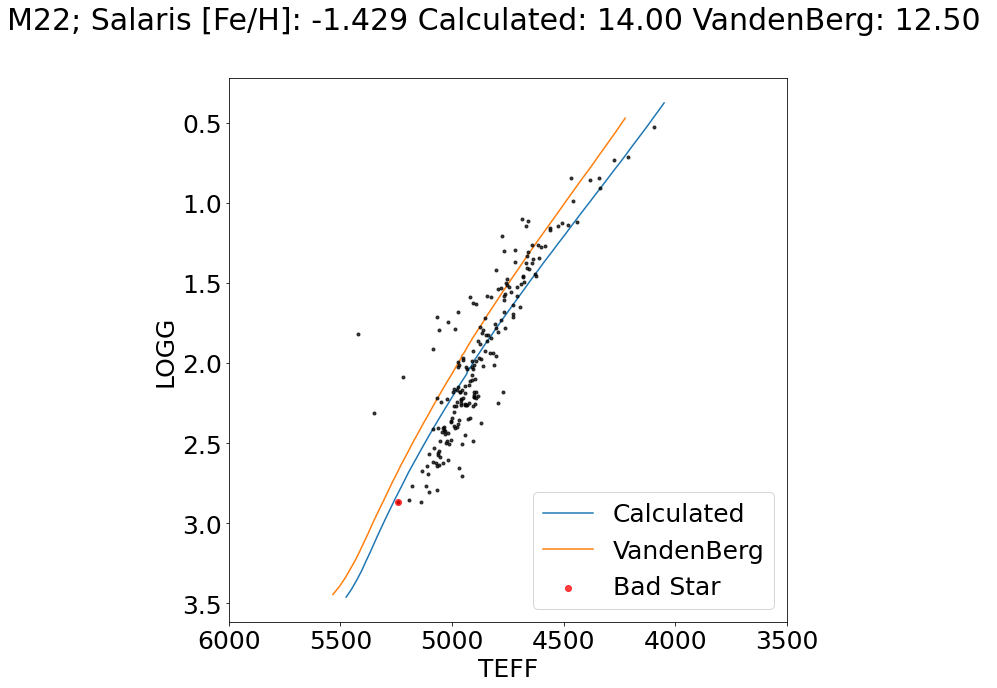

In [376]:
i = np.where(gcs_clus=='M22')
clus = np.where(gcs['CLUSTER']=='M22')#np.where((gcs['CLUSTER']==gcs_clus[i]))
isopick = np.where((massive['MH']==closest(massive['MH'],np.median(all_sal_feh[clus])))&
                    (massive['logAge']==closest(massive['logAge'],np.log10(calc_clus_ages[i]*10**9))))
    
calc_sort = np.argsort(massive['logTe'][isopick])
    
isopick2 = np.where((massive['MH']==closest(massive['MH'],np.median(vanden_feh[i])))&
                       (massive['logAge']==closest(massive['logAge'],np.log10(vanden_age[i]*10**9))))
    
vand_sort = np.argsort(massive['logTe'][isopick2])
    
plt.figure(figsize=[10,10])
    
plt.plot(10**massive['logTe'][isopick][calc_sort],massive['logg'][isopick][calc_sort],
                  zorder=0,label='Calculated')
plt.plot(10**massive['logTe'][isopick2][vand_sort],massive['logg'][isopick2][vand_sort],
                  zorder=0,label='VandenBerg')

plt.scatter(gcsdr17['TEFF'][clus],gcsdr17['LOGG'][clus],c='k',marker='.',zorder=1,alpha=0.75)

# plt.scatter(gcsdr17['TEFF'][clus][23],gcsdr17['LOGG'][clus][23],c='r',zorder=1,alpha=0.75)
# plt.scatter(gcsdr17['TEFF'][clus][136],gcsdr17['LOGG'][clus][136],c='r',zorder=1,alpha=0.75)
plt.scatter(gcsdr17['TEFF'][clus][118],gcsdr17['LOGG'][clus][118],c='r',zorder=1,alpha=0.75,label='Bad Star')
# plt.scatter(gcsdr17['TEFF'][clus][36],gcsdr17['LOGG'][clus][36],c='r',zorder=1,alpha=0.75)
# plt.scatter(gcsdr17['TEFF'][clus][151],gcsdr17['LOGG'][clus][151],c='r',zorder=1,alpha=0.75)

plt.legend(loc='lower right')

plt.xlim(3500,6000)
plt.xlabel(r'TEFF')
plt.ylabel(r'LOGG')
plt.gca().invert_yaxis()
plt.gca().invert_xaxis()
    
plt.suptitle(r'M22; Salaris [Fe/H]: {:.3f} Calculated: {:.2f} VandenBerg: {:.2f} '.format(
                                                                                np.median(all_sal_feh[clus]),
                                                                                calc_clus_ages[8],vanden_age[8]))
plt.show()

In [ ]:
fit star func
age-mag diagnostic plot

In [411]:
badm22theos = 999999.0*np.ones((len(np.arange(0,15,0.25)),len(globbads),5))
badm22theos0 = 999999.0*np.ones((len(np.arange(0,15,0.25)),len(globbads),5))

for i in range(len(globbads)):
    idx = globbads[i]

    cnalpha = np.array([gcsdr17['C_FE'][idx],gcsdr17['N_FE'][idx],gcsdr17['O_FE'][idx],gcsdr17['MG_FE'][idx],
                        gcsdr17['SI_FE'][idx],gcsdr17['S_FE'][idx],gcsdr17['CA_FE'][idx],gcsdr17['TI_FE'][idx]])
    CalcAge = AetasStellae(shiftfeh[idx],cnalpha,gcs_dist[idx],3.1,massive)
    
    for j in range(len(np.arange(0,15,0.25))):
        
        theo = CalcAge.Teff2AppMags(gcs['TEFF'][idx],np.arange(0,15,0.25)[j],bads_aks[i])
        theo0 = CalcAge.Teff2AppMags(gcs['TEFF'][idx],np.arange(0,15,0.25)[j],0)
        
        badm22theos[j,i,0] = theo[0]
        badm22theos[j,i,1] = theo[1]
        badm22theos[j,i,2] = theo[2]
        badm22theos[j,i,3] = theo[3]
        badm22theos[j,i,4] = theo[4]
        badm22theos0[j,i,0] = theo0[0]
        badm22theos0[j,i,1] = theo0[1]
        badm22theos0[j,i,2] = theo0[2]
        badm22theos0[j,i,3] = theo0[3]
        badm22theos0[j,i,4] = theo0[4]

<ipython-input-389-684622fe7e5b>:226: RuntimeWarning: divide by zero encountered in log10
  lgage = np.log10(age*10**9)


Input [Age, Ak]:  [0.0, 0.1560720142584763]
[age_lo,age_hi]:  [0.02499999950079735, 0.0499999995007974]
lgteff, min, max:  [3.7298288, 3.6515, 3.6648]
[BP,RP,J,H,K]:  [999999. 999999. 999999. 999999. 999999.]
Input [Age, Ak]:  [0.0, 0]
[age_lo,age_hi]:  [0.02499999950079735, 0.0499999995007974]
lgteff, min, max:  [3.7298288, 3.6515, 3.6648]
[BP,RP,J,H,K]:  [999999. 999999. 999999. 999999. 999999.]
Input [Age, Ak]:  [0.25, 0.1560720142584763]
[age_lo,age_hi]:  [0.24999999500797404, 0.2749982942426036]
lgteff, min, max:  [3.7298288, 3.6969, 3.7238]
[BP,RP,J,H,K]:  [999999. 999999. 999999. 999999. 999999.]
Input [Age, Ak]:  [0.25, 0]
[age_lo,age_hi]:  [0.24999999500797404, 0.2749982942426036]
lgteff, min, max:  [3.7298288, 3.6969, 3.7238]
[BP,RP,J,H,K]:  [999999. 999999. 999999. 999999. 999999.]
Input [Age, Ak]:  [0.5, 0.1560720142584763]
[age_lo,age_hi]:  [0.49999999500797293, 0.5250008420833815]
lgteff, min, max:  [3.7298288, 3.7033, 3.7357]
[BP,RP,J,H,K]:  [13.60916659 12.22915836 11.0

[BP,RP,J,H,K]:  [15.81793084 14.4331382  13.29684088 12.75644103 12.59981781]
No Ext [BP,RP,J,H,K]:  [14.43600674 13.55970435 12.90819078 12.5102573  12.44374579]
Input [Age, Ak]:  [5.5, 0]
[age_lo,age_hi]:  [5.49996593976403, 5.524970964424762]
lgteff, min, max:  [3.7298288, 3.6169, 3.7418]
[BP,RP,J,H,K]:  [14.43600674 13.55970435 12.90819078 12.5102573  12.44374579]
No Ext [BP,RP,J,H,K]:  [14.43600674 13.55970435 12.90819078 12.5102573  12.44374579]
Input [Age, Ak]:  [5.75, 0.1560720142584763]
[age_lo,age_hi]:  [5.750028536087592, 5.774973557269688]
lgteff, min, max:  [3.7298288, 3.614, 3.7416]
[BP,RP,J,H,K]:  [15.85137421 14.46571691 13.32981681 12.78897214 12.63304144]
No Ext [BP,RP,J,H,K]:  [14.4694501  13.59228306 12.94116671 12.54278841 12.47696942]
Input [Age, Ak]:  [5.75, 0]
[age_lo,age_hi]:  [5.750028536087592, 5.774973557269688]
lgteff, min, max:  [3.7298288, 3.614, 3.7416]
[BP,RP,J,H,K]:  [14.4694501  13.59228306 12.94116671 12.54278841 12.47696942]
No Ext [BP,RP,J,H,K]:  [

[BP,RP,J,H,K]:  [16.28169748 14.89490149 13.76087878 13.22236026 13.06513062]
No Ext [BP,RP,J,H,K]:  [14.89977337 14.02146764 13.37222868 12.97617652 12.9090586 ]
Input [Age, Ak]:  [9.75, 0]
[age_lo,age_hi]:  [9.749896377173886, 9.725008733184024]
lgteff, min, max:  [3.7298288, 3.6066, 3.7402]
[BP,RP,J,H,K]:  [14.89977337 14.02146764 13.37222868 12.97617652 12.9090586 ]
No Ext [BP,RP,J,H,K]:  [14.89977337 14.02146764 13.37222868 12.97617652 12.9090586 ]
Input [Age, Ak]:  [10.0, 0.1560720142584763]
lgteff, min, max:  [3.7298288, 3.6063, 3.7408]
[BP,RP,J,H,K]:  [16.30271575 14.91607714 13.78192793 13.2434141  13.08616235]
No Ext [BP,RP,J,H,K]:  [14.92079164 14.04264329 13.39327783 12.99723036 12.93009033]
Input [Age, Ak]:  [10.0, 0]
lgteff, min, max:  [3.7298288, 3.6063, 3.7408]
[BP,RP,J,H,K]:  [14.92079164 14.04264329 13.39327783 12.99723036 12.93009033]
No Ext [BP,RP,J,H,K]:  [14.92079164 14.04264329 13.39327783 12.99723036 12.93009033]
Input [Age, Ak]:  [10.25, 0.1560720142584763]
[ag

[BP,RP,J,H,K]:  [15.16747085 14.28843427 13.64024662 13.24487062 13.17756241]
No Ext [BP,RP,J,H,K]:  [15.16747085 14.28843427 13.64024662 13.24487062 13.17756241]
Input [Age, Ak]:  [13.5, 0.1560720142584763]
[age_lo,age_hi]:  [13.499882857222538, 13.475038043947164]
lgteff, min, max:  [3.7298288, 3.6029, 3.7357]
[BP,RP,J,H,K]:  [16.57093994 15.18256628 14.05013929 13.51245767 13.35506548]
No Ext [BP,RP,J,H,K]:  [15.18901583 14.30913243 13.66148919 13.26627393 13.19899347]
Input [Age, Ak]:  [13.5, 0]
[age_lo,age_hi]:  [13.499882857222538, 13.475038043947164]
lgteff, min, max:  [3.7298288, 3.6029, 3.7357]
[BP,RP,J,H,K]:  [15.18901583 14.30913243 13.66148919 13.26627393 13.19899347]
No Ext [BP,RP,J,H,K]:  [15.18901583 14.30913243 13.66148919 13.26627393 13.19899347]
Input [Age, Ak]:  [13.75, 0.1560720142584763]
[age_lo,age_hi]:  [13.749914574850289, 13.774949012477467]
lgteff, min, max:  [3.7298288, 3.6027, 3.7356]
[BP,RP,J,H,K]:  [16.58159946 15.19403098 14.06067391 13.52303489 13.365525

In [413]:
bads_ages

array([7.02224968])

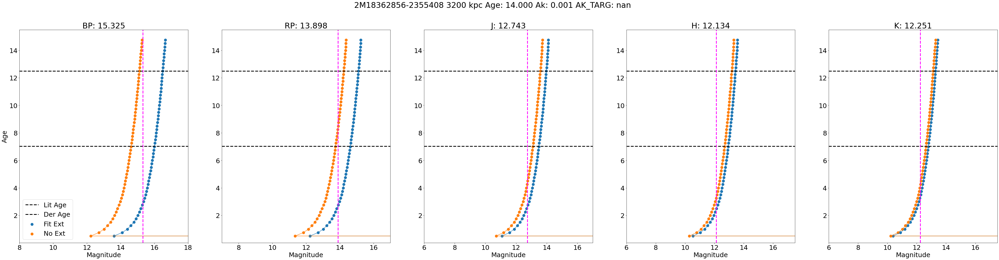

In [412]:
bands = ['BP','RP','J','H','K']
for j in range(len(globbads)):
    fig, ax = plt.subplots(1,5,figsize=[67,15])
    for i in range(5):
        ax[i].scatter(badm22theos[:,0,i],np.arange(0,15,0.25),s=100,label='Fit Ext')
        ax[i].plot(badm22theos[:,0,i],np.arange(0,15,0.25))
        ax[i].scatter(badm22theos0[:,0,i],np.arange(0,15,0.25),s=100,label='No Ext')
        ax[i].plot(badm22theos0[:,0,i],np.arange(0,15,0.25))
        ax[i].set_ylim(bottom=0.01)
        ax[i].axhline(12.5,c='k',ls='--',label='Lit Age',lw=3.0)
        ax[i].axhline(bads_ages,c='k',ls='--',label='Der Age',lw=3.0)
        ax[i].set_xlabel(r'Magnitude')

    ax[0].axvline(gcsdr17[globbads[j]]['GAIAEDR3_PHOT_BP_MEAN_MAG'],ls='--',c='magenta',lw=3.0)
    ax[1].axvline(gcsdr17[globbads[j]]['GAIAEDR3_PHOT_RP_MEAN_MAG'],ls='--',c='magenta',lw=3.0)
    ax[2].axvline(gcsdr17[globbads[j]]['J'],ls='--',c='magenta',lw=3.0)
    ax[3].axvline(gcsdr17[globbads[j]]['H'],ls='--',c='magenta',lw=3.0)
    ax[4].axvline(gcsdr17[globbads[j]]['K'],ls='--',c='magenta',lw=3.0)

    ax[0].set_title(r'BP: {:.3f}'.format(gcsdr17[globbads[j]]['GAIAEDR3_PHOT_BP_MEAN_MAG']))
    ax[1].set_title(r'RP: {:.3f}'.format(gcsdr17[globbads[j]]['GAIAEDR3_PHOT_RP_MEAN_MAG']))
    ax[2].set_title(r'J: {:.3f}'.format(gcsdr17[globbads[j]]['J']))
    ax[3].set_title(r'H: {:.3f}'.format(gcsdr17[globbads[j]]['H']))
    ax[4].set_title(r'K: {:.3f}'.format(gcsdr17[globbads[j]]['K']))

    ax[0].set_xlim(8.,18.)
    ax[1].set_xlim(7.,17.)
    ax[2].set_xlim(6.,17.)
    ax[3].set_xlim(6.,17.5)
    ax[4].set_xlim(6.,17.5)

    ax[0].legend()

    ax[0].set_ylabel('Age')
    plt.suptitle(r'{} 3200 kpc Age: {:.3f} Ak: {:.3f} AK_TARG: {:.3f}'.format(gcsdr17[globbads[j]]['APOGEE_ID'],
                                                                              best_ages[j],best_aks[j],
                                                                              gcsdr17[globbads[j]]['AK_TARG']))
    
    plt.show()

Input [Age, Ak]:  [7.022249678026666, 0.1560720142584763]
[age_lo,age_hi]:  [7.025059387940316, 7.000031591308976]
lgteff, min, max:  [3.7196453, 3.6111, 3.7399]
[BP,RP,J,H,K]:  [15.32489965 13.89840034 12.72930979 12.16205881 12.00188378]
No Ext [BP,RP,J,H,K]:  [13.94297554 13.02496649 12.34065969 11.91587507 11.84581176]
Curve Fit Mags:  [15.32489965 13.89840034 12.72930979 12.16205881 12.00188378]
Observed Mags:  [15.32489967 13.89840031 12.74300003 12.13399982 12.2510004 ]
0.00041998913669465457

array([ 0.39167988,  0.7723599 ,  0.34459293,  0.21838188, -0.06856954,
        0.        ,  0.12233591,  0.3349731 ], dtype=float32)

<ipython-input-446-4d9c545e33fa>:237: RuntimeWarning: divide by zero encountered in log10
  lgage = np.log10(age*10**9)


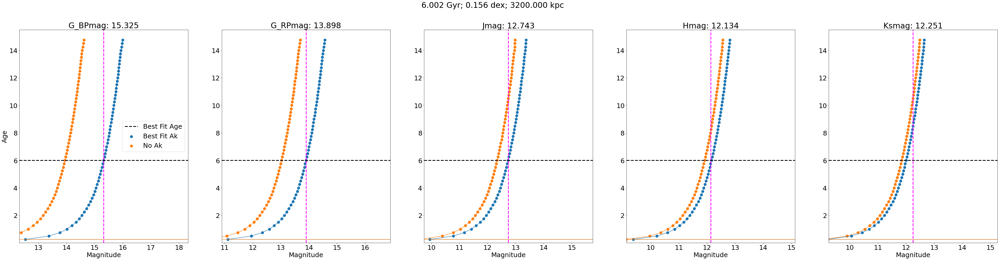

In [447]:
# (self,teff,FeH,CNAlpha,phot,phot_err,Distance,Isochrones,Rv=3.1)

idx = globbads[0]

cnalpha = np.array([gcsdr17['C_FE'][idx],gcsdr17['N_FE'][idx],gcsdr17['O_FE'][idx],gcsdr17['MG_FE'][idx],
                    gcsdr17['SI_FE'][idx],gcsdr17['S_FE'][idx],gcsdr17['CA_FE'][idx],gcsdr17['TI_FE'][idx]])

phots = np.array([gcsdr17['GAIAEDR3_PHOT_BP_MEAN_MAG'][idx],gcsdr17['GAIAEDR3_PHOT_RP_MEAN_MAG'][idx],
                  gcsdr17['J'][idx],gcsdr17['H'][idx],gcsdr17['K'][idx]])
phots_err = np.array([bperr[idx],rperr[idx],gcsdr17['J'][idx],gcsdr17['H'][idx],gcsdr17['K'][idx]])

CalcAge = AetasStellae(gcsdr17['TEFF'][idx],gcsdr17['FE_H'][idx],cnalpha,phots,phots_err,gcs_dist[idx],massive)
best_fit_params,best_fit_params_err = CalcAge.Solve()

CalcAge.Diagnostic(best_fit_params,'testdiagnostic.pdf')

In [426]:
gcsdr17['TEFF'][globbads]

array([5243.789], dtype=float32)

In [380]:
### Age 12.0 Ak 0.5

p0=[12.0,0.5]
idx = globbads[2]
cnalpha = np.array([gcsdr17['C_FE'][idx],gcsdr17['N_FE'][idx],gcsdr17['O_FE'][idx],gcsdr17['MG_FE'][idx],
                    gcsdr17['SI_FE'][idx],gcsdr17['S_FE'][idx],gcsdr17['CA_FE'][idx],gcsdr17['TI_FE'][idx]])

CalcAge = AetasStellae(shiftfeh[idx],cnalpha,10000,3.1,massive)

obs_mags = np.array([gcsdr17['GAIAEDR3_PHOT_BP_MEAN_MAG'][idx],gcsdr17['GAIAEDR3_PHOT_RP_MEAN_MAG'][idx],
                     gcsdr17['J'][idx],gcsdr17['H'][idx],gcsdr17['K'][idx]],dtype=float).T.ravel()
obs_mags_err = np.array([bperr[idx],rperr[idx],gcsdr17['J'][idx],gcsdr17['H'][idx],
                         gcsdr17['K'][idx]],dtype=float).T.ravel()

popt,pcov = curve_fit(CalcAge.Teff2AppMags,gcsdr17['TEFF'][idx],obs_mags,p0=p0,bounds=((0.,0.),(14.,2.)),
                      method='trf',sigma=obs_mags_err,absolute_sigma=True)

calc_mags = CalcAge.Teff2AppMags(gcsdr17['TEFF'][idx],popt[0],popt[1]) 

print('-------')
print('Initial Guess',p0)
print('Params [Age, Ak]:',popt)
print('Params Err [Age, Ak]:',[np.sqrt(pcov[0][0]),np.sqrt(pcov[1][1])])
print('Obs [BP,RP,J,H,K]: ',np.round(obs_mags,3))
print('Obs Err [BP,RP,J,H,K]: ',np.round(obs_mags_err,3))
print('Calc [BP,RP,J,H,K]: ',np.round(calc_mags,3))

Input [Age, Ak]:  [12.0, 0.5]
[age_lo,age_hi]:  [11.999965570481184, 12.024859203095733]
lgteff, min, max:  [3.7196453, 3.6042, 3.7383]
[BP,RP,J,H,K]:  [21.21037132 18.66251771 16.42559059 15.54529219 15.18563579]
No Ext [BP,RP,J,H,K]:  [16.78317111 15.86434196 15.18049197 14.75660583 14.68563579]
Input [Age, Ak]:  [12.000000178813934, 0.5]
[age_lo,age_hi]:  [11.999965570481184, 12.024859203095733]
lgteff, min, max:  [3.7196453, 3.6042, 3.7383]
[BP,RP,J,H,K]:  [21.21037133 18.66251772 16.4255906  15.5452922  15.18563581]
No Ext [BP,RP,J,H,K]:  [16.78317113 15.86434197 15.18049198 14.75660584 14.68563581]
Input [Age, Ak]:  [12.0, 0.5000000149011612]
[age_lo,age_hi]:  [11.999965570481184, 12.024859203095733]
lgteff, min, max:  [3.7196453, 3.6042, 3.7383]
[BP,RP,J,H,K]:  [21.21037145 18.66251779 16.42559063 15.54529221 15.18563581]
No Ext [BP,RP,J,H,K]:  [16.78317111 15.86434196 15.18049197 14.75660583 14.68563579]
Input [Age, Ak]:  [5.494556689981596, 0.23277019815746164]
[age_lo,age_hi]

In [346]:
### Age 12.0 Ak 0.04

p0=[12.0,0.04]
idx = globbads[2]
cnalpha = np.array([gcsdr17['C_FE'][idx],gcsdr17['N_FE'][idx],gcsdr17['O_FE'][idx],gcsdr17['MG_FE'][idx],
                    gcsdr17['SI_FE'][idx],gcsdr17['S_FE'][idx],gcsdr17['CA_FE'][idx],gcsdr17['TI_FE'][idx]])

CalcAge = AetasStellae(shiftfeh[idx],cnalpha,10000,3.1,massive)

obs_mags = np.array([gcsdr17['GAIAEDR3_PHOT_BP_MEAN_MAG'][idx],gcsdr17['GAIAEDR3_PHOT_RP_MEAN_MAG'][idx],
                     gcsdr17['J'][idx],gcsdr17['H'][idx],gcsdr17['K'][idx]],dtype=float).T.ravel()
obs_mags_err = np.array([bperr[idx],rperr[idx],gcsdr17['J'][idx],gcsdr17['H'][idx],
                         gcsdr17['K'][idx]],dtype=float).T.ravel()

popt,pcov = curve_fit(CalcAge.Teff2AppMags,gcsdr17['TEFF'][idx],obs_mags,p0=p0,bounds=((0.,0.),(14.,2.)),
                      method='trf',sigma=obs_mags_err,absolute_sigma=True)

calc_mags = CalcAge.Teff2AppMags(gcsdr17['TEFF'][idx],popt[0],popt[1]) 

print('-------')
print('Initial Guess',p0)
print('Params [Age, Ak]:',popt)
print('Params Err [Age, Ak]:',[np.sqrt(pcov[0][0]),np.sqrt(pcov[1][1])])
print('Obs [BP,RP,J,H,K]: ',np.round(obs_mags,3))
print('Obs Err [BP,RP,J,H,K]: ',np.round(obs_mags_err,3))
print('Calc [BP,RP,J,H,K]: ',np.round(calc_mags,3))

Input [Age, Ak]:  [12.0, 0.04]
[BP,RP,J,H,K]:  [17.13734713 16.08819602 15.28009986 14.81970074 14.72563579]
Input [Age, Ak]:  [12.000000178813934, 0.04]
[BP,RP,J,H,K]:  [17.13734714 16.08819603 15.28009987 14.81970075 14.72563581]
Input [Age, Ak]:  [12.0, 0.040000014901161195]
[BP,RP,J,H,K]:  [17.13734726 16.0881961  15.2800999  14.81970077 14.72563581]
Input [Age, Ak]:  [4.585146824840222, 0.015791933934909068]
[BP,RP,J,H,K]:  [16.27143313 15.30253538 14.5678618  14.12792569 14.04932173]
Input [Age, Ak]:  [4.585146893164234, 0.015791933934909068]
[BP,RP,J,H,K]:  [16.27143314 15.30253539 14.56786181 14.1279257  14.04932174]
Input [Age, Ak]:  [4.585146824840222, 0.01579194883607026]
[BP,RP,J,H,K]:  [16.27143326 15.30253546 14.56786184 14.12792572 14.04932175]
Input [Age, Ak]:  [1.6249679948377, 0.005886095895085999]
[BP,RP,J,H,K]:  [15.46543863 14.52996645 13.82418771 13.39144282 13.31914616]
Input [Age, Ak]:  [1.62496801905161, 0.005886095895085999]
[BP,RP,J,H,K]:  [15.46543865 14.529

In [347]:
p0=[12.0,0.00]
idx = globbads[2]
cnalpha = np.array([gcsdr17['C_FE'][idx],gcsdr17['N_FE'][idx],gcsdr17['O_FE'][idx],gcsdr17['MG_FE'][idx],
                    gcsdr17['SI_FE'][idx],gcsdr17['S_FE'][idx],gcsdr17['CA_FE'][idx],gcsdr17['TI_FE'][idx]])

CalcAge = AetasStellae(shiftfeh[idx],cnalpha,10000,3.1,massive)

obs_mags = np.array([gcsdr17['GAIAEDR3_PHOT_BP_MEAN_MAG'][idx],gcsdr17['GAIAEDR3_PHOT_RP_MEAN_MAG'][idx],
                     gcsdr17['J'][idx],gcsdr17['H'][idx],gcsdr17['K'][idx]],dtype=float).T.ravel()
obs_mags_err = np.array([bperr[idx],rperr[idx],gcsdr17['J'][idx],gcsdr17['H'][idx],
                         gcsdr17['K'][idx]],dtype=float).T.ravel()

popt,pcov = curve_fit(CalcAge.Teff2AppMags,gcsdr17['TEFF'][idx],obs_mags,p0=p0,bounds=((0.,0.),(14.,2.)),
                      method='trf',sigma=obs_mags_err,absolute_sigma=True)

calc_mags = CalcAge.Teff2AppMags(gcsdr17['TEFF'][idx],popt[0],popt[1]) 

print('-------')
print('Initial Guess',p0)
print('Params [Age, Ak]:',popt)
print('Params Err [Age, Ak]:',[np.sqrt(pcov[0][0]),np.sqrt(pcov[1][1])])
print('Obs [BP,RP,J,H,K]: ',np.round(obs_mags,3))
print('Obs Err [BP,RP,J,H,K]: ',np.round(obs_mags_err,3))
print('Calc [BP,RP,J,H,K]: ',np.round(calc_mags,3))

Input [Age, Ak]:  [12.0, 1e-10]
[BP,RP,J,H,K]:  [16.78317111 15.86434196 15.18049197 14.75660583 14.68563579]
Input [Age, Ak]:  [12.000000178813934, 1e-10]
[BP,RP,J,H,K]:  [16.78317113 15.86434197 15.18049198 14.75660584 14.68563581]
Input [Age, Ak]:  [12.0, 1.5001161193847657e-08]
[BP,RP,J,H,K]:  [16.78317125 15.86434204 15.18049201 14.75660586 14.68563581]
Input [Age, Ak]:  [4.308776943423009, 3.710926087109545e-11]
[BP,RP,J,H,K]:  [16.09102502 15.17408115 14.48823689 14.06248345 13.99298404]
Input [Age, Ak]:  [4.308777007628788, 3.710926087109545e-11]
[BP,RP,J,H,K]:  [16.09102502 15.17408116 14.4882369  14.06248346 13.99298405]
Input [Age, Ak]:  [4.308776943423009, 1.4938270454718753e-08]
[BP,RP,J,H,K]:  [16.09102515 15.17408123 14.48823693 14.06248347 13.99298406]
Input [Age, Ak]:  [1.3008615973303006, 1.1727575607169647e-11]
[BP,RP,J,H,K]:  [15.24506103 14.32931481 13.64208168 13.21376389 13.14491617]
Input [Age, Ak]:  [1.300861616714649, 1.1727575607169647e-11]
[BP,RP,J,H,K]:  [1

In [348]:
p0=[14.,0.5]
idx = globbads[2]
cnalpha = np.array([gcsdr17['C_FE'][idx],gcsdr17['N_FE'][idx],gcsdr17['O_FE'][idx],gcsdr17['MG_FE'][idx],
                    gcsdr17['SI_FE'][idx],gcsdr17['S_FE'][idx],gcsdr17['CA_FE'][idx],gcsdr17['TI_FE'][idx]])

CalcAge = AetasStellae(shiftfeh[idx],cnalpha,10000,3.1,massive)

obs_mags = np.array([gcsdr17['GAIAEDR3_PHOT_BP_MEAN_MAG'][idx],gcsdr17['GAIAEDR3_PHOT_RP_MEAN_MAG'][idx],
                     gcsdr17['J'][idx],gcsdr17['H'][idx],gcsdr17['K'][idx]],dtype=float).T.ravel()
obs_mags_err = np.array([bperr[idx],rperr[idx],gcsdr17['J'][idx],gcsdr17['H'][idx],
                         gcsdr17['K'][idx]],dtype=float).T.ravel()

popt,pcov = curve_fit(CalcAge.Teff2AppMags,gcsdr17['TEFF'][idx],obs_mags,p0=p0,bounds=((0.,0.),(14.,2.)),
                      method='trf',sigma=obs_mags_err,absolute_sigma=True)

calc_mags = CalcAge.Teff2AppMags(gcsdr17['TEFF'][idx],popt[0],popt[1]) 

print('-------')
print('Initial Guess',p0)
print('Params [Age, Ak]:',popt)
print('Params Err [Age, Ak]:',[np.sqrt(pcov[0][0]),np.sqrt(pcov[1][1])])
print('Obs [BP,RP,J,H,K]: ',np.round(obs_mags,3))
print('Obs Err [BP,RP,J,H,K]: ',np.round(obs_mags_err,3))
print('Calc [BP,RP,J,H,K]: ',np.round(calc_mags,3))

Input [Age, Ak]:  [13.9999999986, 0.5]
[BP,RP,J,H,K]:  [21.31943292 18.77118097 16.53393895 15.65437972 15.29465343]
Input [Age, Ak]:  [13.999999789983743, 0.5]
[BP,RP,J,H,K]:  [21.31943291 18.77118096 16.53393894 15.6543797  15.29465342]
Input [Age, Ak]:  [13.9999999986, 0.5000000149011612]
[BP,RP,J,H,K]:  [21.31943305 18.77118105 16.53393899 15.65437974 15.29465344]
Input [Age, Ak]:  [5.993178963819467, 0.2185488141332198]
[BP,RP,J,H,K]:  [18.23954969 16.6095818  15.24561085 14.62075242 14.42476172]
Input [Age, Ak]:  [5.993179053124793, 0.2185488141332198]
[BP,RP,J,H,K]:  [18.2395497  16.60958182 15.24561086 14.62075244 14.42476173]
Input [Age, Ak]:  [5.993178963819467, 0.218548829034381]
[BP,RP,J,H,K]:  [18.23954982 16.60958189 15.24561088 14.62075245 14.42476173]
Input [Age, Ak]:  [2.6394302656273387, 0.09895319074129652]
[BP,RP,J,H,K]:  [16.63027382 15.39094162 14.39712157 13.88005634 13.75389423]
Input [Age, Ak]:  [2.6394303049579144, 0.09895319074129652]
[BP,RP,J,H,K]:  [16.6302

In [349]:
p0=[7.,0.5]
idx = globbads[2]
cnalpha = np.array([gcsdr17['C_FE'][idx],gcsdr17['N_FE'][idx],gcsdr17['O_FE'][idx],gcsdr17['MG_FE'][idx],
                    gcsdr17['SI_FE'][idx],gcsdr17['S_FE'][idx],gcsdr17['CA_FE'][idx],gcsdr17['TI_FE'][idx]])

CalcAge = AetasStellae(shiftfeh[idx],cnalpha,10000,3.1,massive)

obs_mags = np.array([gcsdr17['GAIAEDR3_PHOT_BP_MEAN_MAG'][idx],gcsdr17['GAIAEDR3_PHOT_RP_MEAN_MAG'][idx],
                     gcsdr17['J'][idx],gcsdr17['H'][idx],gcsdr17['K'][idx]],dtype=float).T.ravel()
obs_mags_err = np.array([bperr[idx],rperr[idx],gcsdr17['J'][idx],gcsdr17['H'][idx],
                         gcsdr17['K'][idx]],dtype=float).T.ravel()

popt,pcov = curve_fit(CalcAge.Teff2AppMags,gcsdr17['TEFF'][idx],obs_mags,p0=p0,bounds=((0.,0.),(14.,2.)),
                      method='trf',sigma=obs_mags_err,absolute_sigma=True)

calc_mags = CalcAge.Teff2AppMags(gcsdr17['TEFF'][idx],popt[0],popt[1]) 

print('-------')
print('Initial Guess',p0)
print('Params [Age, Ak]:',popt)
print('Params Err [Age, Ak]:',[np.sqrt(pcov[0][0]),np.sqrt(pcov[1][1])])
print('Obs [BP,RP,J,H,K]: ',np.round(obs_mags,3))
print('Obs Err [BP,RP,J,H,K]: ',np.round(obs_mags_err,3))
print('Calc [BP,RP,J,H,K]: ',np.round(calc_mags,3))

Input [Age, Ak]:  [7.0, 0.5]
[BP,RP,J,H,K]:  [20.84188839 18.29486671 16.05748754 15.17629176 14.81755018]
Input [Age, Ak]:  [7.000000104308128, 0.5]
[BP,RP,J,H,K]:  [20.8418884  18.29486672 16.05748755 15.17629177 14.81755019]
Input [Age, Ak]:  [7.0, 0.5000000149011612]
[BP,RP,J,H,K]:  [20.84188852 18.29486679 16.05748758 15.17629179 14.81755019]
Input [Age, Ak]:  [3.2605168113682637, 0.23669885502696691]
[BP,RP,J,H,K]:  [18.0060141  16.31784538 14.89645062 14.2546722  14.04815538]
Input [Age, Ak]:  [3.2605168599537504, 0.23669885502696691]
[BP,RP,J,H,K]:  [18.00601411 16.31784538 14.89645063 14.2546722  14.04815539]
Input [Age, Ak]:  [3.2605168113682637, 0.2366988699281281]
[BP,RP,J,H,K]:  [18.00601424 16.31784546 14.89645066 14.25467222 14.0481554 ]
Input [Age, Ak]:  [1.464384305403518, 0.10952270371530756]
[BP,RP,J,H,K]:  [16.30547724 15.03238838 14.00468369 13.47724212 13.34542826]
Input [Age, Ak]:  [1.4643843272245445, 0.10952270371530756]
[BP,RP,J,H,K]:  [16.30547725 15.03238839

In [352]:
p0=[1.,0.5]
idx = globbads[2]
cnalpha = np.array([gcsdr17['C_FE'][idx],gcsdr17['N_FE'][idx],gcsdr17['O_FE'][idx],gcsdr17['MG_FE'][idx],
                    gcsdr17['SI_FE'][idx],gcsdr17['S_FE'][idx],gcsdr17['CA_FE'][idx],gcsdr17['TI_FE'][idx]])

CalcAge = AetasStellae(shiftfeh[idx],cnalpha,10000,3.1,massive)

obs_mags = np.array([gcsdr17['GAIAEDR3_PHOT_BP_MEAN_MAG'][idx],gcsdr17['GAIAEDR3_PHOT_RP_MEAN_MAG'][idx],
                     gcsdr17['J'][idx],gcsdr17['H'][idx],gcsdr17['K'][idx]],dtype=float).T.ravel()
obs_mags_err = np.array([bperr[idx],rperr[idx],gcsdr17['J'][idx],gcsdr17['H'][idx],
                         gcsdr17['K'][idx]],dtype=float).T.ravel()

popt,pcov = curve_fit(CalcAge.Teff2AppMags,gcsdr17['TEFF'][idx],obs_mags,p0=p0,bounds=((0.,0.),(14.,2.)),
                      method='trf',sigma=obs_mags_err,absolute_sigma=True)

calc_mags = CalcAge.Teff2AppMags(gcsdr17['TEFF'][idx],popt[0],popt[1]) 

print('-------')
print('Initial Guess',p0)
print('Params [Age, Ak]:',popt)
print('Params Err [Age, Ak]:',[np.sqrt(pcov[0][0]),np.sqrt(pcov[1][1])])
print('Obs [BP,RP,J,H,K]: ',np.round(obs_mags,3))
print('Obs Err [BP,RP,J,H,K]: ',np.round(obs_mags_err,3))
print('Calc [BP,RP,J,H,K]: ',np.round(calc_mags,3))

Input [Age, Ak]:  [1.0, 0.5]
[J,H,K]:  [19.4688258  16.92409706 14.68357473 13.79869011 13.4419422 ]
Input [Age, Ak]:  [1.0000000149011612, 0.5]
[BP,RP,J,H,K]:  [19.46882581 16.92409707 14.68357474 13.79869013 13.44194221]
Input [Age, Ak]:  [1.0, 0.5000000149011612]
[J,H,K]:  [19.46882593 16.92409714 14.68357477 13.79869014 13.44194221]
Input [Age, Ak]:  [0.5482347834209698, 0.2759811237907204]
[BP,RP,J,H,K]:  [16.95150574 15.13633773 13.59152195 12.91242809 12.6849938 ]
Input [Age, Ak]:  [0.548234798322131, 0.2759811237907204]
[BP,RP,J,H,K]:  [16.95150577 15.13633776 13.59152198 12.91242812 12.68499382]
Input [Age, Ak]:  [0.5482347834209698, 0.27598113869188157]
[BP,RP,J,H,K]:  [16.95150587 15.13633781 13.59152199 12.91242812 12.68499381]
Input [Age, Ak]:  [0.37069276206793167, 0.18715154440290746]
[BP,RP,J,H,K]:  [15.74579735 14.21962956 12.95160226 12.35430131 12.17907863]
Input [Age, Ak]:  [0.37069277696909286, 0.18715154440290746]
[BP,RP,J,H,K]:  [15.74579739 14.21962961 12.951602

In [359]:
# lit age # median AK_TARG
calc_mags = CalcAge.Teff2AppMags(gcsdr17['TEFF'][idx],12.5,np.median(gcsdr17['AK_TARG'][np.where(gcs_clus=='M22')]))

print('-------')
print('Initial Guess',p0)
print('Obs [BP,RP,J,H,K]: ',np.round(obs_mags,3))
print('Obs Err [BP,RP,J,H,K]: ',np.round(obs_mags_err,3))
print('Calc [BP,RP,J,H,K]: ',np.round(calc_mags,3))

Input [Age, Ak]:  [12.5, 0.009611188]
[BP,RP,J,H,K]:  [16.89730037 15.94676528 15.2327456  14.79979834 14.72424179]
-------
Initial Guess [1.0, 0.5]
Obs [BP,RP,J,H,K]:  [15.325 13.898 12.743 12.134 12.251]
Obs Err [BP,RP,J,H,K]:  [3.0000e-03 3.0000e-03 1.2743e+01 1.2134e+01 1.2251e+01]
Calc [BP,RP,J,H,K]:  [16.897 15.947 15.233 14.8   14.724]


In [361]:
# Lit age # Ak=0
calc_mags = CalcAge.Teff2AppMags(gcsdr17['TEFF'][idx],12.5,0)

Input [Age, Ak]:  [12.5, 0]
[BP,RP,J,H,K]:  [16.81219906 15.89297769 15.20881184 14.78463792 14.71463061]


In [362]:
p0=[12.,2.0]
idx = globbads[2]
cnalpha = np.array([gcsdr17['C_FE'][idx],gcsdr17['N_FE'][idx],gcsdr17['O_FE'][idx],gcsdr17['MG_FE'][idx],
                    gcsdr17['SI_FE'][idx],gcsdr17['S_FE'][idx],gcsdr17['CA_FE'][idx],gcsdr17['TI_FE'][idx]])

CalcAge = AetasStellae(shiftfeh[idx],cnalpha,10000,3.1,massive)

obs_mags = np.array([gcsdr17['GAIAEDR3_PHOT_BP_MEAN_MAG'][idx],gcsdr17['GAIAEDR3_PHOT_RP_MEAN_MAG'][idx],
                     gcsdr17['J'][idx],gcsdr17['H'][idx],gcsdr17['K'][idx]],dtype=float).T.ravel()
obs_mags_err = np.array([bperr[idx],rperr[idx],gcsdr17['J'][idx],gcsdr17['H'][idx],
                         gcsdr17['K'][idx]],dtype=float).T.ravel()

popt,pcov = curve_fit(CalcAge.Teff2AppMags,gcsdr17['TEFF'][idx],obs_mags,p0=p0,bounds=((0.,0.),(14.,2.)),
                      method='trf',sigma=obs_mags_err,absolute_sigma=True)

calc_mags = CalcAge.Teff2AppMags(gcsdr17['TEFF'][idx],popt[0],popt[1]) 

print('-------')
print('Initial Guess',p0)
print('Params [Age, Ak]:',popt)
print('Params Err [Age, Ak]:',[np.sqrt(pcov[0][0]),np.sqrt(pcov[1][1])])
print('Obs [BP,RP,J,H,K]: ',np.round(obs_mags,3))
print('Obs Err [BP,RP,J,H,K]: ',np.round(obs_mags_err,3))
print('Calc [BP,RP,J,H,K]: ',np.round(calc_mags,3))

Input [Age, Ak]:  [12.0, 1.9999999998]
[BP,RP,J,H,K]:  [34.49197192 27.05704495 20.16088645 17.91135125 16.68563579]
Input [Age, Ak]:  [12.000000178813934, 1.9999999998]
[BP,RP,J,H,K]:  [34.49197193 27.05704496 20.16088646 17.91135126 16.6856358 ]
Input [Age, Ak]:  [12.0, 1.9999999699976776]
[BP,RP,J,H,K]:  [34.49197166 27.05704478 20.16088637 17.9113512  16.68563576]
Input [Age, Ak]:  [5.834952396086442, 0.9782262820162115]
[BP,RP,J,H,K]:  [24.9512008  20.84651113 17.1220785  15.80395022 15.16938797]
Input [Age, Ak]:  [5.834952483034009, 0.9782262820162115]
[BP,RP,J,H,K]:  [24.95120081 20.84651114 17.12207851 15.80395023 15.16938798]
Input [Age, Ak]:  [5.834952396086442, 0.9782262969173727]
[BP,RP,J,H,K]:  [24.95120093 20.84651121 17.12207853 15.80395024 15.16938799]
Input [Age, Ak]:  [2.816321389657753, 0.4765613079255938]
[BP,RP,J,H,K]:  [20.02615286 17.55679444 15.3898563  14.52857129 14.18404785]
Input [Age, Ak]:  [2.8163214316242122, 0.4765613079255938]
[BP,RP,J,H,K]:  [20.026152